In [1]:
import pandas as pd
import collections
import math
import os

import cv2
import matplotlib.pyplot as plt
import cv2
import sys
import numpy as np
import math
import time
from PIL import Image 

from pandas import read_csv  
import configparser

%config Completer.use_jedi = False

import configparser
config = configparser.ConfigParser()
config.read('XXX-config.txt')

source_folder = config.get('Configuration', 'source_folder')
time_step = int(config.get('Configuration', 'time_step'))
window_size = int(config.get('Configuration', 'window_size'))
data_folder = config.get('Configuration', 'data_folder')
ini_date = config.get('Configuration', 'ini_date')
end_date = config.get('Configuration', 'end_date')

users=config.get('Configuration', 'users')
users = [(item.strip()) for item in users.split(',')]

w = int(config.get('Configuration', 'w'))
h = int(config.get('Configuration', 'h'))

anchors=config.get('Configuration', 'anchors')
anchors = [(item.strip()) for item in anchors.split(',')]

rooms=config.get('Configuration', 'rooms')
rooms = [(item.strip()) for item in rooms.split(',')]

user_color={}
for user in users:
    user_color[user]=config.get('Colors', user)
print(user_color)

{'f02e': 'blue', '867f': 'red', 'ed9c': 'green'}


In [2]:
import numpy as np
from pandas import read_csv    
import pandas as pd
import time

from datetime import datetime

off_zone=60*60*2

def day_time(ti):
    return int((int)((ti+off_zone)/(60*60*24)))


def time2str(tt):
    return datetime.fromtimestamp(tt).strftime("%Y-%m-%d %H:%M:%S")


t0 = (int)(datetime.strptime(ini_date, '%Y-%m-%d %H:%M:%S').timestamp())
print (ini_date,"Init date is", t0, "day:",day_time(t0), time2str(t0))

tN = (int)(datetime.strptime(end_date, '%Y-%m-%d %H:%M:%S').timestamp())
print (end_date,"End date is", tN, "day:",day_time(tN), time2str(tN))


def day_time0(ti):
    return day_time(ti)-day_time(t0)+1

def relT(ti):
    return (int)((ti-t0)/time_step)

i0=0
ts=list(range(t0,tN,1))

day=list(range(day_time(t0),day_time(tN)+1))[0]
day=19798
print(day)


1980-01-01 13:00:02 Init date is 315576002 day: 3652 1980-01-01 13:00:02
1980-01-01 14:51:20 End date is 315582680 day: 3652 1980-01-01 14:51:20
19798


In [3]:
series=read_csv(os.path.join(source_folder,"scene-time.txt"), sep="\t",parse_dates=True, header=None, names=["tt0","time", "scene"]) 
S={} 
for index, row in series.iterrows():
    S[row["time"]]=row["scene"]
print(S)

{0: 'Scene1', 1: 'Scene1', 2: 'Scene1', 3: 'Scene1', 4: 'Scene1', 5: 'Scene1', 6: 'Scene1', 7: 'Scene1', 8: 'Scene1', 9: 'Scene1', 10: 'Scene1', 11: 'Scene1', 12: 'Scene1', 13: 'Scene1', 14: 'Scene1', 15: 'Scene1', 16: 'Scene1', 17: 'Scene1', 18: 'Scene1', 19: 'Scene1', 20: 'Scene1', 21: 'Scene1', 22: 'Scene1', 23: 'Scene1', 24: 'Scene1', 25: 'Scene1', 26: 'Scene1', 27: 'Scene1', 28: 'Scene1', 29: 'Scene1', 30: 'Scene1', 31: 'Scene1', 32: 'Scene1', 33: 'Scene1', 34: 'Scene1', 35: 'Scene1', 36: 'Scene1', 37: 'Scene1', 38: 'Scene1', 39: 'Scene1', 40: 'Scene1', 41: 'Scene1', 42: 'Scene1', 43: 'Scene1', 44: 'Scene1', 45: 'Scene1', 46: 'Scene1', 47: 'Scene1', 48: 'Scene1', 49: 'Scene1', 50: 'Scene1', 51: 'Scene1', 52: 'Scene1', 53: 'Scene1', 54: 'Scene1', 55: 'Scene1', 56: 'Scene1', 57: 'Scene1', 58: 'Scene1', 59: 'Scene1', 60: 'Scene1', 61: 'Scene1', 62: 'Scene1', 63: 'Scene1', 64: 'Scene1', 65: 'Scene1', 66: 'Scene1', 67: 'Scene1', 68: 'Scene1', 69: 'Scene1', 70: 'Scene1', 71: 'Scene1', 7

In [4]:
def getFPImg(tt):
    return np.array(Image.open(data_folder+"/DAY_"+str(day)+"/FP."+str(tt)+".png"))/255.0

def getGTImg(tt,user):
    return np.array(Image.open(data_folder+"/DAY_"+str(day)+"/GT."+user+"."+str(tt)+".png"))/255.0  

def getSceneImg(scene):
    return np.array(Image.open(data_folder+"/DAY_"+str(day)+"/FP.mean."+str(scene)+".png"))/255.0

In [5]:


XY0={}
rssi0={}
Y0={}

T0=[]
T1=[]


rssi_min=-90
rssi_max=-25


anchors_data={}
for user in users:
    XY0[user]=[]
    rssi0[user]=[]
    Y0[user]=[]


    anchors_data[user]={}
    for anchor in anchors:
        print(data_folder+"/DAY_"+str(day)+"/"+user+"."+anchor+".tsv")
        print(user,anchor)
        series=read_csv(data_folder+"/DAY_"+str(day)+"/"+user+"."+anchor+".tsv", sep="\t",parse_dates=True, header=None, names=["time","d"])
        series=series.values
        anchors_data[user][anchor]=series


for it,tt in enumerate(ts):
    imgX=getFPImg(tt)
    print("imgX",imgX.shape)

    #img00=np.zeros((w,h))
    #scene=getScene(tt)
    #if(scene):
    #    img00=getSceneImg(scene)
    #print("img00",img00)
    #imgX=imgX-img00
    #imgX[imgX<0]=0
    for user in users:

        imgY=getGTImg(tt,user)
        print("user",user,"imgY",imgY.shape)

        dist=[]
        for ixa,anchor in enumerate(anchors):
            print(tt,time2str(tt),anchor,user)
            d=anchors_data[user][anchor][it][1]
            print(anchors_data[user][anchor][it][0], "vs",tt)

            #if(d!=-1):
            #    d=(d - rssi_min) / (rssi_max - rssi_min)

            #print(anchors_data[user][anchor][it][1],d)
            if(d>=0):
                if(d<10):
                    d=(1-d/10.0)
                else:
                    d=0
            else:
                    d=0

            print("\t anchor:",anchor, anchors_data[user][anchor][it], "tt:",tt)
            dist.append(d)

        dist=np.array(dist)
        print("dist:",dist)

        rssi0[user].append(dist.reshape(len(anchors),1))
        XY0[user].append(imgX[:, :, np.newaxis])
        Y0[user].append(imgY[:, :, np.newaxis])
        T0.append(it)
        T1.append(tt)
        
        


./all-data-aligned//DAY_19798/f02e.8171.tsv
f02e 8171
./all-data-aligned//DAY_19798/f02e.eb38.tsv
f02e eb38
./all-data-aligned//DAY_19798/f02e.1fa0.tsv
f02e 1fa0
./all-data-aligned//DAY_19798/f02e.a304.tsv
f02e a304
./all-data-aligned//DAY_19798/f02e.c492.tsv
f02e c492
./all-data-aligned//DAY_19798/867f.8171.tsv
867f 8171
./all-data-aligned//DAY_19798/867f.eb38.tsv
867f eb38
./all-data-aligned//DAY_19798/867f.1fa0.tsv
867f 1fa0
./all-data-aligned//DAY_19798/867f.a304.tsv
867f a304
./all-data-aligned//DAY_19798/867f.c492.tsv
867f c492
./all-data-aligned//DAY_19798/ed9c.8171.tsv
ed9c 8171
./all-data-aligned//DAY_19798/ed9c.eb38.tsv
ed9c eb38
./all-data-aligned//DAY_19798/ed9c.1fa0.tsv
ed9c 1fa0
./all-data-aligned//DAY_19798/ed9c.a304.tsv
ed9c a304
./all-data-aligned//DAY_19798/ed9c.c492.tsv
ed9c c492
imgX (16, 12)
user f02e imgY (16, 12)
315576002 1980-01-01 13:00:02 8171 f02e
10.0 vs 315576002
	 anchor: 8171 [ 10. -10.] tt: 315576002
315576002 1980-01-01 13:00:02 eb38 f02e
10.0 vs 31557

imgX (16, 12)
user f02e imgY (16, 12)
315576071 1980-01-01 13:01:11 8171 f02e
10.0 vs 315576071
	 anchor: 8171 [ 10. -10.] tt: 315576071
315576071 1980-01-01 13:01:11 eb38 f02e
10.0 vs 315576071
	 anchor: eb38 [ 10. -10.] tt: 315576071
315576071 1980-01-01 13:01:11 1fa0 f02e
10.0 vs 315576071
	 anchor: 1fa0 [ 10. -10.] tt: 315576071
315576071 1980-01-01 13:01:11 a304 f02e
10.0 vs 315576071
	 anchor: a304 [ 10. -10.] tt: 315576071
315576071 1980-01-01 13:01:11 c492 f02e
10.0 vs 315576071
	 anchor: c492 [ 10. -10.] tt: 315576071
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576071 1980-01-01 13:01:11 8171 867f
10.0 vs 315576071
	 anchor: 8171 [ 10. -10.] tt: 315576071
315576071 1980-01-01 13:01:11 eb38 867f
10.0 vs 315576071
	 anchor: eb38 [ 10. -10.] tt: 315576071
315576071 1980-01-01 13:01:11 1fa0 867f
10.0 vs 315576071
	 anchor: 1fa0 [ 10. -10.] tt: 315576071
315576071 1980-01-01 13:01:11 a304 867f
10.0 vs 315576071
	 anchor: a304 [ 10. -10.] tt: 315576071
315576071 1980-01-01 13:01:11

imgX (16, 12)
user f02e imgY (16, 12)
315576184 1980-01-01 13:03:04 8171 f02e
10.0 vs 315576184
	 anchor: 8171 [ 10. -10.] tt: 315576184
315576184 1980-01-01 13:03:04 eb38 f02e
10.0 vs 315576184
	 anchor: eb38 [ 10. -10.] tt: 315576184
315576184 1980-01-01 13:03:04 1fa0 f02e
10.0 vs 315576184
	 anchor: 1fa0 [ 10. -10.] tt: 315576184
315576184 1980-01-01 13:03:04 a304 f02e
10.0 vs 315576184
	 anchor: a304 [ 10. -10.] tt: 315576184
315576184 1980-01-01 13:03:04 c492 f02e
10.0 vs 315576184
	 anchor: c492 [ 10. -10.] tt: 315576184
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576184 1980-01-01 13:03:04 8171 867f
10.0 vs 315576184
	 anchor: 8171 [ 10. -10.] tt: 315576184
315576184 1980-01-01 13:03:04 eb38 867f
10.0 vs 315576184
	 anchor: eb38 [ 10. -10.] tt: 315576184
315576184 1980-01-01 13:03:04 1fa0 867f
10.0 vs 315576184
	 anchor: 1fa0 [ 10. -10.] tt: 315576184
315576184 1980-01-01 13:03:04 a304 867f
10.0 vs 315576184
	 anchor: a304 [ 10. -10.] tt: 315576184
315576184 1980-01-01 13:03:04

imgX (16, 12)
user f02e imgY (16, 12)
315576299 1980-01-01 13:04:59 8171 f02e
10.0 vs 315576299
	 anchor: 8171 [ 10. -10.] tt: 315576299
315576299 1980-01-01 13:04:59 eb38 f02e
10.0 vs 315576299
	 anchor: eb38 [ 10. -10.] tt: 315576299
315576299 1980-01-01 13:04:59 1fa0 f02e
10.0 vs 315576299
	 anchor: 1fa0 [ 10. -10.] tt: 315576299
315576299 1980-01-01 13:04:59 a304 f02e
10.0 vs 315576299
	 anchor: a304 [ 10. -10.] tt: 315576299
315576299 1980-01-01 13:04:59 c492 f02e
10.0 vs 315576299
	 anchor: c492 [ 10. -10.] tt: 315576299
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576299 1980-01-01 13:04:59 8171 867f
10.0 vs 315576299
	 anchor: 8171 [ 10. -10.] tt: 315576299
315576299 1980-01-01 13:04:59 eb38 867f
10.0 vs 315576299
	 anchor: eb38 [ 10. -10.] tt: 315576299
315576299 1980-01-01 13:04:59 1fa0 867f
10.0 vs 315576299
	 anchor: 1fa0 [ 10. -10.] tt: 315576299
315576299 1980-01-01 13:04:59 a304 867f
10.0 vs 315576299
	 anchor: a304 [ 10. -10.] tt: 315576299
315576299 1980-01-01 13:04:59

imgX (16, 12)
user f02e imgY (16, 12)
315576411 1980-01-01 13:06:51 8171 f02e
10.0 vs 315576411
	 anchor: 8171 [ 10. -10.] tt: 315576411
315576411 1980-01-01 13:06:51 eb38 f02e
10.0 vs 315576411
	 anchor: eb38 [ 10. -10.] tt: 315576411
315576411 1980-01-01 13:06:51 1fa0 f02e
10.0 vs 315576411
	 anchor: 1fa0 [ 10. -10.] tt: 315576411
315576411 1980-01-01 13:06:51 a304 f02e
10.0 vs 315576411
	 anchor: a304 [ 10. -10.] tt: 315576411
315576411 1980-01-01 13:06:51 c492 f02e
10.0 vs 315576411
	 anchor: c492 [ 10. -10.] tt: 315576411
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576411 1980-01-01 13:06:51 8171 867f
10.0 vs 315576411
	 anchor: 8171 [ 10. -10.] tt: 315576411
315576411 1980-01-01 13:06:51 eb38 867f
10.0 vs 315576411
	 anchor: eb38 [ 10. -10.] tt: 315576411
315576411 1980-01-01 13:06:51 1fa0 867f
10.0 vs 315576411
	 anchor: 1fa0 [ 10. -10.] tt: 315576411
315576411 1980-01-01 13:06:51 a304 867f
10.0 vs 315576411
	 anchor: a304 [ 10. -10.] tt: 315576411
315576411 1980-01-01 13:06:51

user 867f imgY (16, 12)
315576528 1980-01-01 13:08:48 8171 867f
10.0 vs 315576528
	 anchor: 8171 [ 10. -10.] tt: 315576528
315576528 1980-01-01 13:08:48 eb38 867f
10.0 vs 315576528
	 anchor: eb38 [ 10. -10.] tt: 315576528
315576528 1980-01-01 13:08:48 1fa0 867f
10.0 vs 315576528
	 anchor: 1fa0 [ 10. -10.] tt: 315576528
315576528 1980-01-01 13:08:48 a304 867f
10.0 vs 315576528
	 anchor: a304 [ 10. -10.] tt: 315576528
315576528 1980-01-01 13:08:48 c492 867f
10.0 vs 315576528
	 anchor: c492 [ 10. -10.] tt: 315576528
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315576528 1980-01-01 13:08:48 8171 ed9c
5.91 vs 315576528
	 anchor: 8171 [5.91 5.91] tt: 315576528
315576528 1980-01-01 13:08:48 eb38 ed9c
2.421 vs 315576528
	 anchor: eb38 [2.421 2.421] tt: 315576528
315576528 1980-01-01 13:08:48 1fa0 ed9c
10.0 vs 315576528
	 anchor: 1fa0 [ 10. -10.] tt: 315576528
315576528 1980-01-01 13:08:48 a304 ed9c
10.0 vs 315576528
	 anchor: a304 [ 10. -10.] tt: 315576528
315576528 1980-01-01 13:08:48 c492 ed9c


imgX (16, 12)
user f02e imgY (16, 12)
315576640 1980-01-01 13:10:40 8171 f02e
10.0 vs 315576640
	 anchor: 8171 [ 10. -10.] tt: 315576640
315576640 1980-01-01 13:10:40 eb38 f02e
10.0 vs 315576640
	 anchor: eb38 [ 10. -10.] tt: 315576640
315576640 1980-01-01 13:10:40 1fa0 f02e
10.0 vs 315576640
	 anchor: 1fa0 [ 10. -10.] tt: 315576640
315576640 1980-01-01 13:10:40 a304 f02e
10.0 vs 315576640
	 anchor: a304 [ 10. -10.] tt: 315576640
315576640 1980-01-01 13:10:40 c492 f02e
10.0 vs 315576640
	 anchor: c492 [ 10. -10.] tt: 315576640
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576640 1980-01-01 13:10:40 8171 867f
10.0 vs 315576640
	 anchor: 8171 [ 10. -10.] tt: 315576640
315576640 1980-01-01 13:10:40 eb38 867f
10.0 vs 315576640
	 anchor: eb38 [ 10. -10.] tt: 315576640
315576640 1980-01-01 13:10:40 1fa0 867f
10.0 vs 315576640
	 anchor: 1fa0 [ 10. -10.] tt: 315576640
315576640 1980-01-01 13:10:40 a304 867f
10.0 vs 315576640
	 anchor: a304 [ 10. -10.] tt: 315576640
315576640 1980-01-01 13:10:40

imgX (16, 12)
user f02e imgY (16, 12)
315576756 1980-01-01 13:12:36 8171 f02e
10.0 vs 315576756
	 anchor: 8171 [ 10. -10.] tt: 315576756
315576756 1980-01-01 13:12:36 eb38 f02e
10.0 vs 315576756
	 anchor: eb38 [ 10. -10.] tt: 315576756
315576756 1980-01-01 13:12:36 1fa0 f02e
10.0 vs 315576756
	 anchor: 1fa0 [ 10. -10.] tt: 315576756
315576756 1980-01-01 13:12:36 a304 f02e
10.0 vs 315576756
	 anchor: a304 [ 10. -10.] tt: 315576756
315576756 1980-01-01 13:12:36 c492 f02e
10.0 vs 315576756
	 anchor: c492 [ 10. -10.] tt: 315576756
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315576756 1980-01-01 13:12:36 8171 867f
10.0 vs 315576756
	 anchor: 8171 [ 10. -10.] tt: 315576756
315576756 1980-01-01 13:12:36 eb38 867f
10.0 vs 315576756
	 anchor: eb38 [ 10. -10.] tt: 315576756
315576756 1980-01-01 13:12:36 1fa0 867f
10.0 vs 315576756
	 anchor: 1fa0 [ 10. -10.] tt: 315576756
315576756 1980-01-01 13:12:36 a304 867f
10.0 vs 315576756
	 anchor: a304 [ 10. -10.] tt: 315576756
315576756 1980-01-01 13:12:36

user ed9c imgY (16, 12)
315576873 1980-01-01 13:14:33 8171 ed9c
5.915 vs 315576873
	 anchor: 8171 [5.915 5.915] tt: 315576873
315576873 1980-01-01 13:14:33 eb38 ed9c
3.133 vs 315576873
	 anchor: eb38 [3.133 3.133] tt: 315576873
315576873 1980-01-01 13:14:33 1fa0 ed9c
10.0 vs 315576873
	 anchor: 1fa0 [ 10. -10.] tt: 315576873
315576873 1980-01-01 13:14:33 a304 ed9c
10.0 vs 315576873
	 anchor: a304 [ 10. -10.] tt: 315576873
315576873 1980-01-01 13:14:33 c492 ed9c
10.0 vs 315576873
	 anchor: c492 [ 10. -10.] tt: 315576873
dist: [0.4085 0.6867 0.     0.     0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315576874 1980-01-01 13:14:34 8171 f02e
10.0 vs 315576874
	 anchor: 8171 [ 10. -10.] tt: 315576874
315576874 1980-01-01 13:14:34 eb38 f02e
10.0 vs 315576874
	 anchor: eb38 [ 10. -10.] tt: 315576874
315576874 1980-01-01 13:14:34 1fa0 f02e
10.0 vs 315576874
	 anchor: 1fa0 [ 10. -10.] tt: 315576874
315576874 1980-01-01 13:14:34 a304 f02e
10.0 vs 315576874
	 anchor: a304 [ 10. -10.] tt: 31557687

user 867f imgY (16, 12)
315576993 1980-01-01 13:16:33 8171 867f
10.0 vs 315576993
	 anchor: 8171 [ 10. -10.] tt: 315576993
315576993 1980-01-01 13:16:33 eb38 867f
10.0 vs 315576993
	 anchor: eb38 [ 10. -10.] tt: 315576993
315576993 1980-01-01 13:16:33 1fa0 867f
10.0 vs 315576993
	 anchor: 1fa0 [ 10. -10.] tt: 315576993
315576993 1980-01-01 13:16:33 a304 867f
10.0 vs 315576993
	 anchor: a304 [ 10. -10.] tt: 315576993
315576993 1980-01-01 13:16:33 c492 867f
10.0 vs 315576993
	 anchor: c492 [ 10. -10.] tt: 315576993
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315576993 1980-01-01 13:16:33 8171 ed9c
10.0 vs 315576993
	 anchor: 8171 [ 10. -10.] tt: 315576993
315576993 1980-01-01 13:16:33 eb38 ed9c
10.0 vs 315576993
	 anchor: eb38 [ 10. -10.] tt: 315576993
315576993 1980-01-01 13:16:33 1fa0 ed9c
10.0 vs 315576993
	 anchor: 1fa0 [ 10. -10.] tt: 315576993
315576993 1980-01-01 13:16:33 a304 ed9c
10.0 vs 315576993
	 anchor: a304 [ 10. -10.] tt: 315576993
315576993 1980-01-01 13:16:33 c492 ed9c
10.

user ed9c imgY (16, 12)
315577114 1980-01-01 13:18:34 8171 ed9c
5.479 vs 315577114
	 anchor: 8171 [5.479 5.479] tt: 315577114
315577114 1980-01-01 13:18:34 eb38 ed9c
2.8 vs 315577114
	 anchor: eb38 [2.8 2.8] tt: 315577114
315577114 1980-01-01 13:18:34 1fa0 ed9c
10.0 vs 315577114
	 anchor: 1fa0 [ 10. -10.] tt: 315577114
315577114 1980-01-01 13:18:34 a304 ed9c
8.572 vs 315577114
	 anchor: a304 [8.572 8.572] tt: 315577114
315577114 1980-01-01 13:18:34 c492 ed9c
10.0 vs 315577114
	 anchor: c492 [ 10. -10.] tt: 315577114
dist: [0.4521 0.72   0.     0.1428 0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315577115 1980-01-01 13:18:35 8171 f02e
10.0 vs 315577115
	 anchor: 8171 [ 10. -10.] tt: 315577115
315577115 1980-01-01 13:18:35 eb38 f02e
10.0 vs 315577115
	 anchor: eb38 [ 10. -10.] tt: 315577115
315577115 1980-01-01 13:18:35 1fa0 f02e
10.0 vs 315577115
	 anchor: 1fa0 [ 10. -10.] tt: 315577115
315577115 1980-01-01 13:18:35 a304 f02e
10.0 vs 315577115
	 anchor: a304 [ 10. -10.] tt: 315577115
3

user ed9c imgY (16, 12)
315577227 1980-01-01 13:20:27 8171 ed9c
10.0 vs 315577227
	 anchor: 8171 [ 10. -10.] tt: 315577227
315577227 1980-01-01 13:20:27 eb38 ed9c
10.0 vs 315577227
	 anchor: eb38 [ 10. -10.] tt: 315577227
315577227 1980-01-01 13:20:27 1fa0 ed9c
10.0 vs 315577227
	 anchor: 1fa0 [ 10. -10.] tt: 315577227
315577227 1980-01-01 13:20:27 a304 ed9c
10.0 vs 315577227
	 anchor: a304 [ 10. -10.] tt: 315577227
315577227 1980-01-01 13:20:27 c492 ed9c
10.0 vs 315577227
	 anchor: c492 [ 10. -10.] tt: 315577227
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315577228 1980-01-01 13:20:28 8171 f02e
10.0 vs 315577228
	 anchor: 8171 [ 10. -10.] tt: 315577228
315577228 1980-01-01 13:20:28 eb38 f02e
10.0 vs 315577228
	 anchor: eb38 [ 10. -10.] tt: 315577228
315577228 1980-01-01 13:20:28 1fa0 f02e
10.0 vs 315577228
	 anchor: 1fa0 [ 10. -10.] tt: 315577228
315577228 1980-01-01 13:20:28 a304 f02e
10.0 vs 315577228
	 anchor: a304 [ 10. -10.] tt: 315577228
315577228 1980-01-01 13:20:28

user 867f imgY (16, 12)
315577348 1980-01-01 13:22:28 8171 867f
10.0 vs 315577348
	 anchor: 8171 [ 10. -10.] tt: 315577348
315577348 1980-01-01 13:22:28 eb38 867f
10.0 vs 315577348
	 anchor: eb38 [ 10. -10.] tt: 315577348
315577348 1980-01-01 13:22:28 1fa0 867f
10.0 vs 315577348
	 anchor: 1fa0 [ 10. -10.] tt: 315577348
315577348 1980-01-01 13:22:28 a304 867f
10.0 vs 315577348
	 anchor: a304 [ 10. -10.] tt: 315577348
315577348 1980-01-01 13:22:28 c492 867f
10.0 vs 315577348
	 anchor: c492 [ 10. -10.] tt: 315577348
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315577348 1980-01-01 13:22:28 8171 ed9c
10.0 vs 315577348
	 anchor: 8171 [ 10. -10.] tt: 315577348
315577348 1980-01-01 13:22:28 eb38 ed9c
10.0 vs 315577348
	 anchor: eb38 [ 10. -10.] tt: 315577348
315577348 1980-01-01 13:22:28 1fa0 ed9c
10.0 vs 315577348
	 anchor: 1fa0 [ 10. -10.] tt: 315577348
315577348 1980-01-01 13:22:28 a304 ed9c
10.0 vs 315577348
	 anchor: a304 [ 10. -10.] tt: 315577348
315577348 1980-01-01 13:22:28 c492 ed9c
10.

imgX (16, 12)
user f02e imgY (16, 12)
315577466 1980-01-01 13:24:26 8171 f02e
10.0 vs 315577466
	 anchor: 8171 [ 10. -10.] tt: 315577466
315577466 1980-01-01 13:24:26 eb38 f02e
10.0 vs 315577466
	 anchor: eb38 [ 10. -10.] tt: 315577466
315577466 1980-01-01 13:24:26 1fa0 f02e
10.0 vs 315577466
	 anchor: 1fa0 [ 10. -10.] tt: 315577466
315577466 1980-01-01 13:24:26 a304 f02e
10.0 vs 315577466
	 anchor: a304 [ 10. -10.] tt: 315577466
315577466 1980-01-01 13:24:26 c492 f02e
10.0 vs 315577466
	 anchor: c492 [ 10. -10.] tt: 315577466
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315577466 1980-01-01 13:24:26 8171 867f
10.0 vs 315577466
	 anchor: 8171 [ 10. -10.] tt: 315577466
315577466 1980-01-01 13:24:26 eb38 867f
10.0 vs 315577466
	 anchor: eb38 [ 10. -10.] tt: 315577466
315577466 1980-01-01 13:24:26 1fa0 867f
10.0 vs 315577466
	 anchor: 1fa0 [ 10. -10.] tt: 315577466
315577466 1980-01-01 13:24:26 a304 867f
10.0 vs 315577466
	 anchor: a304 [ 10. -10.] tt: 315577466
315577466 1980-01-01 13:24:26

user 867f imgY (16, 12)
315577584 1980-01-01 13:26:24 8171 867f
10.0 vs 315577584
	 anchor: 8171 [ 10. -10.] tt: 315577584
315577584 1980-01-01 13:26:24 eb38 867f
10.0 vs 315577584
	 anchor: eb38 [ 10. -10.] tt: 315577584
315577584 1980-01-01 13:26:24 1fa0 867f
10.0 vs 315577584
	 anchor: 1fa0 [ 10. -10.] tt: 315577584
315577584 1980-01-01 13:26:24 a304 867f
10.0 vs 315577584
	 anchor: a304 [ 10. -10.] tt: 315577584
315577584 1980-01-01 13:26:24 c492 867f
10.0 vs 315577584
	 anchor: c492 [ 10. -10.] tt: 315577584
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315577584 1980-01-01 13:26:24 8171 ed9c
10.0 vs 315577584
	 anchor: 8171 [ 10. -10.] tt: 315577584
315577584 1980-01-01 13:26:24 eb38 ed9c
10.0 vs 315577584
	 anchor: eb38 [ 10. -10.] tt: 315577584
315577584 1980-01-01 13:26:24 1fa0 ed9c
10.0 vs 315577584
	 anchor: 1fa0 [ 10. -10.] tt: 315577584
315577584 1980-01-01 13:26:24 a304 ed9c
10.0 vs 315577584
	 anchor: a304 [ 10. -10.] tt: 315577584
315577584 1980-01-01 13:26:24 c492 ed9c
10.

imgX (16, 12)
user f02e imgY (16, 12)
315577705 1980-01-01 13:28:25 8171 f02e
10.0 vs 315577705
	 anchor: 8171 [ 10. -10.] tt: 315577705
315577705 1980-01-01 13:28:25 eb38 f02e
10.0 vs 315577705
	 anchor: eb38 [ 10. -10.] tt: 315577705
315577705 1980-01-01 13:28:25 1fa0 f02e
10.0 vs 315577705
	 anchor: 1fa0 [ 10. -10.] tt: 315577705
315577705 1980-01-01 13:28:25 a304 f02e
10.0 vs 315577705
	 anchor: a304 [ 10. -10.] tt: 315577705
315577705 1980-01-01 13:28:25 c492 f02e
10.0 vs 315577705
	 anchor: c492 [ 10. -10.] tt: 315577705
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315577705 1980-01-01 13:28:25 8171 867f
10.0 vs 315577705
	 anchor: 8171 [ 10. -10.] tt: 315577705
315577705 1980-01-01 13:28:25 eb38 867f
10.0 vs 315577705
	 anchor: eb38 [ 10. -10.] tt: 315577705
315577705 1980-01-01 13:28:25 1fa0 867f
10.0 vs 315577705
	 anchor: 1fa0 [ 10. -10.] tt: 315577705
315577705 1980-01-01 13:28:25 a304 867f
10.0 vs 315577705
	 anchor: a304 [ 10. -10.] tt: 315577705
315577705 1980-01-01 13:28:25

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



imgX (16, 12)
user f02e imgY (16, 12)
315578299 1980-01-01 13:38:19 8171 f02e
5.91 vs 315578299
	 anchor: 8171 [5.91 5.91] tt: 315578299
315578299 1980-01-01 13:38:19 eb38 f02e
2.239 vs 315578299
	 anchor: eb38 [2.239 2.239] tt: 315578299
315578299 1980-01-01 13:38:19 1fa0 f02e
10.0 vs 315578299
	 anchor: 1fa0 [ 10. -10.] tt: 315578299
315578299 1980-01-01 13:38:19 a304 f02e
10.0 vs 315578299
	 anchor: a304 [ 10. -10.] tt: 315578299
315578299 1980-01-01 13:38:19 c492 f02e
10.0 vs 315578299
	 anchor: c492 [ 10. -10.] tt: 315578299
dist: [0.409  0.7761 0.     0.     0.    ]
user 867f imgY (16, 12)
315578299 1980-01-01 13:38:19 8171 867f
10.0 vs 315578299
	 anchor: 8171 [ 10. -10.] tt: 315578299
315578299 1980-01-01 13:38:19 eb38 867f
10.0 vs 315578299
	 anchor: eb38 [ 10. -10.] tt: 315578299
315578299 1980-01-01 13:38:19 1fa0 867f
10.0 vs 315578299
	 anchor: 1fa0 [ 10. -10.] tt: 315578299
315578299 1980-01-01 13:38:19 a304 867f
10.0 vs 315578299
	 anchor: a304 [ 10. -10.] tt: 315578299
3

user 867f imgY (16, 12)
315578381 1980-01-01 13:39:41 8171 867f
5.339 vs 315578381
	 anchor: 8171 [5.339 6.477] tt: 315578381
315578381 1980-01-01 13:39:41 eb38 867f
2.926 vs 315578381
	 anchor: eb38 [2.926 3.128] tt: 315578381
315578381 1980-01-01 13:39:41 1fa0 867f
10.0 vs 315578381
	 anchor: 1fa0 [ 10. -10.] tt: 315578381
315578381 1980-01-01 13:39:41 a304 867f
9.481 vs 315578381
	 anchor: a304 [9.481 9.481] tt: 315578381
315578381 1980-01-01 13:39:41 c492 867f
10.0 vs 315578381
	 anchor: c492 [ 10. -10.] tt: 315578381
dist: [0.3523 0.6872 0.     0.0519 0.    ]
user ed9c imgY (16, 12)
315578381 1980-01-01 13:39:41 8171 ed9c
10.0 vs 315578381
	 anchor: 8171 [ 10. -10.] tt: 315578381
315578381 1980-01-01 13:39:41 eb38 ed9c
10.0 vs 315578381
	 anchor: eb38 [ 10. -10.] tt: 315578381
315578381 1980-01-01 13:39:41 1fa0 ed9c
10.0 vs 315578381
	 anchor: 1fa0 [ 10. -10.] tt: 315578381
315578381 1980-01-01 13:39:41 a304 ed9c
10.0 vs 315578381
	 anchor: a304 [ 10. -10.] tt: 315578381
315578381

user f02e imgY (16, 12)
315578420 1980-01-01 13:40:20 8171 f02e
10.0 vs 315578420
	 anchor: 8171 [ 10. -10.] tt: 315578420
315578420 1980-01-01 13:40:20 eb38 f02e
10.0 vs 315578420
	 anchor: eb38 [ 10. -10.] tt: 315578420
315578420 1980-01-01 13:40:20 1fa0 f02e
10.0 vs 315578420
	 anchor: 1fa0 [ 10. -10.] tt: 315578420
315578420 1980-01-01 13:40:20 a304 f02e
10.0 vs 315578420
	 anchor: a304 [ 10. -10.] tt: 315578420
315578420 1980-01-01 13:40:20 c492 f02e
10.0 vs 315578420
	 anchor: c492 [ 10. -10.] tt: 315578420
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315578420 1980-01-01 13:40:20 8171 867f
10.0 vs 315578420
	 anchor: 8171 [ 10. -10.] tt: 315578420
315578420 1980-01-01 13:40:20 eb38 867f
10.0 vs 315578420
	 anchor: eb38 [ 10. -10.] tt: 315578420
315578420 1980-01-01 13:40:20 1fa0 867f
10.0 vs 315578420
	 anchor: 1fa0 [ 10. -10.] tt: 315578420
315578420 1980-01-01 13:40:20 a304 867f
10.0 vs 315578420
	 anchor: a304 [ 10. -10.] tt: 315578420
315578420 1980-01-01 13:40:20 c492 867f
10.

user ed9c imgY (16, 12)
315578460 1980-01-01 13:41:00 8171 ed9c
10.0 vs 315578460
	 anchor: 8171 [ 10. -10.] tt: 315578460
315578460 1980-01-01 13:41:00 eb38 ed9c
10.0 vs 315578460
	 anchor: eb38 [ 10. -10.] tt: 315578460
315578460 1980-01-01 13:41:00 1fa0 ed9c
4.903 vs 315578460
	 anchor: 1fa0 [4.903 4.903] tt: 315578460
315578460 1980-01-01 13:41:00 a304 ed9c
10.0 vs 315578460
	 anchor: a304 [ 10. -10.] tt: 315578460
315578460 1980-01-01 13:41:00 c492 ed9c
1.34 vs 315578460
	 anchor: c492 [1.34 1.34] tt: 315578460
dist: [0.     0.     0.5097 0.     0.866 ]
imgX (16, 12)
user f02e imgY (16, 12)
315578461 1980-01-01 13:41:01 8171 f02e
10.0 vs 315578461
	 anchor: 8171 [ 10. -10.] tt: 315578461
315578461 1980-01-01 13:41:01 eb38 f02e
10.0 vs 315578461
	 anchor: eb38 [ 10. -10.] tt: 315578461
315578461 1980-01-01 13:41:01 1fa0 f02e
10.0 vs 315578461
	 anchor: 1fa0 [ 10. -10.] tt: 315578461
315578461 1980-01-01 13:41:01 a304 f02e
10.0 vs 315578461
	 anchor: a304 [ 10. -10.] tt: 315578461
3

user f02e imgY (16, 12)
315578499 1980-01-01 13:41:39 8171 f02e
10.0 vs 315578499
	 anchor: 8171 [ 10. -10.] tt: 315578499
315578499 1980-01-01 13:41:39 eb38 f02e
10.0 vs 315578499
	 anchor: eb38 [ 10. -10.] tt: 315578499
315578499 1980-01-01 13:41:39 1fa0 f02e
10.0 vs 315578499
	 anchor: 1fa0 [ 10. -10.] tt: 315578499
315578499 1980-01-01 13:41:39 a304 f02e
10.0 vs 315578499
	 anchor: a304 [ 10. -10.] tt: 315578499
315578499 1980-01-01 13:41:39 c492 f02e
10.0 vs 315578499
	 anchor: c492 [ 10. -10.] tt: 315578499
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315578499 1980-01-01 13:41:39 8171 867f
5.274 vs 315578499
	 anchor: 8171 [5.274 5.507] tt: 315578499
315578499 1980-01-01 13:41:39 eb38 867f
2.458 vs 315578499
	 anchor: eb38 [2.458 2.618] tt: 315578499
315578499 1980-01-01 13:41:39 1fa0 867f
10.0 vs 315578499
	 anchor: 1fa0 [ 10. -10.] tt: 315578499
315578499 1980-01-01 13:41:39 a304 867f
8.98 vs 315578499
	 anchor: a304 [8.98  9.078] tt: 315578499
315578499 1980-01-01 13:41:39 c492 

user ed9c imgY (16, 12)
315578537 1980-01-01 13:42:17 8171 ed9c
10.0 vs 315578537
	 anchor: 8171 [ 10. -10.] tt: 315578537
315578537 1980-01-01 13:42:17 eb38 ed9c
10.0 vs 315578537
	 anchor: eb38 [ 10. -10.] tt: 315578537
315578537 1980-01-01 13:42:17 1fa0 ed9c
10.0 vs 315578537
	 anchor: 1fa0 [ 10. -10.] tt: 315578537
315578537 1980-01-01 13:42:17 a304 ed9c
10.0 vs 315578537
	 anchor: a304 [ 10. -10.] tt: 315578537
315578537 1980-01-01 13:42:17 c492 ed9c
1.812 vs 315578537
	 anchor: c492 [1.812 1.836] tt: 315578537
dist: [0.     0.     0.     0.     0.8164]
imgX (16, 12)
user f02e imgY (16, 12)
315578538 1980-01-01 13:42:18 8171 f02e
10.0 vs 315578538
	 anchor: 8171 [ 10. -10.] tt: 315578538
315578538 1980-01-01 13:42:18 eb38 f02e
10.0 vs 315578538
	 anchor: eb38 [ 10. -10.] tt: 315578538
315578538 1980-01-01 13:42:18 1fa0 f02e
10.0 vs 315578538
	 anchor: 1fa0 [ 10. -10.] tt: 315578538
315578538 1980-01-01 13:42:18 a304 f02e
10.0 vs 315578538
	 anchor: a304 [ 10. -10.] tt: 315578538
3

user 867f imgY (16, 12)
315578578 1980-01-01 13:42:58 8171 867f
4.374 vs 315578578
	 anchor: 8171 [4.374 4.425] tt: 315578578
315578578 1980-01-01 13:42:58 eb38 867f
4.088 vs 315578578
	 anchor: eb38 [4.088 4.153] tt: 315578578
315578578 1980-01-01 13:42:58 1fa0 867f
10.0 vs 315578578
	 anchor: 1fa0 [ 10. -10.] tt: 315578578
315578578 1980-01-01 13:42:58 a304 867f
10.0 vs 315578578
	 anchor: a304 [ 10. -10.] tt: 315578578
315578578 1980-01-01 13:42:58 c492 867f
10.0 vs 315578578
	 anchor: c492 [ 10. -10.] tt: 315578578
dist: [0.5575 0.5847 0.     0.     0.    ]
user ed9c imgY (16, 12)
315578578 1980-01-01 13:42:58 8171 ed9c
10.0 vs 315578578
	 anchor: 8171 [ 10. -10.] tt: 315578578
315578578 1980-01-01 13:42:58 eb38 ed9c
10.0 vs 315578578
	 anchor: eb38 [ 10. -10.] tt: 315578578
315578578 1980-01-01 13:42:58 1fa0 ed9c
5.292 vs 315578578
	 anchor: 1fa0 [5.292 5.77 ] tt: 315578578
315578578 1980-01-01 13:42:58 a304 ed9c
10.0 vs 315578578
	 anchor: a304 [ 10. -10.] tt: 315578578
315578578

user 867f imgY (16, 12)
315578619 1980-01-01 13:43:39 8171 867f
3.442 vs 315578619
	 anchor: 8171 [3.442 3.442] tt: 315578619
315578619 1980-01-01 13:43:39 eb38 867f
3.933 vs 315578619
	 anchor: eb38 [3.933 4.069] tt: 315578619
315578619 1980-01-01 13:43:39 1fa0 867f
10.0 vs 315578619
	 anchor: 1fa0 [ 10. -10.] tt: 315578619
315578619 1980-01-01 13:43:39 a304 867f
10.0 vs 315578619
	 anchor: a304 [ 10. -10.] tt: 315578619
315578619 1980-01-01 13:43:39 c492 867f
10.0 vs 315578619
	 anchor: c492 [ 10. -10.] tt: 315578619
dist: [0.6558 0.5931 0.     0.     0.    ]
user ed9c imgY (16, 12)
315578619 1980-01-01 13:43:39 8171 ed9c
10.0 vs 315578619
	 anchor: 8171 [ 10. -10.] tt: 315578619
315578619 1980-01-01 13:43:39 eb38 ed9c
10.0 vs 315578619
	 anchor: eb38 [ 10. -10.] tt: 315578619
315578619 1980-01-01 13:43:39 1fa0 ed9c
5.376 vs 315578619
	 anchor: 1fa0 [5.376 5.704] tt: 315578619
315578619 1980-01-01 13:43:39 a304 ed9c
10.0 vs 315578619
	 anchor: a304 [ 10. -10.] tt: 315578619
315578619

user ed9c imgY (16, 12)
315578659 1980-01-01 13:44:19 8171 ed9c
10.0 vs 315578659
	 anchor: 8171 [ 10. -10.] tt: 315578659
315578659 1980-01-01 13:44:19 eb38 ed9c
10.0 vs 315578659
	 anchor: eb38 [ 10. -10.] tt: 315578659
315578659 1980-01-01 13:44:19 1fa0 ed9c
10.0 vs 315578659
	 anchor: 1fa0 [ 10. -10.] tt: 315578659
315578659 1980-01-01 13:44:19 a304 ed9c
10.0 vs 315578659
	 anchor: a304 [ 10. -10.] tt: 315578659
315578659 1980-01-01 13:44:19 c492 ed9c
10.0 vs 315578659
	 anchor: c492 [ 10. -10.] tt: 315578659
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315578660 1980-01-01 13:44:20 8171 f02e
5.147 vs 315578660
	 anchor: 8171 [5.147 5.156] tt: 315578660
315578660 1980-01-01 13:44:20 eb38 f02e
2.978 vs 315578660
	 anchor: eb38 [2.978 2.992] tt: 315578660
315578660 1980-01-01 13:44:20 1fa0 f02e
10.0 vs 315578660
	 anchor: 1fa0 [ 10. -10.] tt: 315578660
315578660 1980-01-01 13:44:20 a304 f02e
10.0 vs 315578660
	 anchor: a304 [ 10. -10.] tt: 315578660
315578660 1980-01-01 13

imgX (16, 12)
user f02e imgY (16, 12)
315578699 1980-01-01 13:44:59 8171 f02e
10.0 vs 315578699
	 anchor: 8171 [ 10. -10.] tt: 315578699
315578699 1980-01-01 13:44:59 eb38 f02e
10.0 vs 315578699
	 anchor: eb38 [ 10. -10.] tt: 315578699
315578699 1980-01-01 13:44:59 1fa0 f02e
10.0 vs 315578699
	 anchor: 1fa0 [ 10. -10.] tt: 315578699
315578699 1980-01-01 13:44:59 a304 f02e
10.0 vs 315578699
	 anchor: a304 [ 10. -10.] tt: 315578699
315578699 1980-01-01 13:44:59 c492 f02e
10.0 vs 315578699
	 anchor: c492 [ 10. -10.] tt: 315578699
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315578699 1980-01-01 13:44:59 8171 867f
10.0 vs 315578699
	 anchor: 8171 [ 10. -10.] tt: 315578699
315578699 1980-01-01 13:44:59 eb38 867f
10.0 vs 315578699
	 anchor: eb38 [ 10. -10.] tt: 315578699
315578699 1980-01-01 13:44:59 1fa0 867f
10.0 vs 315578699
	 anchor: 1fa0 [ 10. -10.] tt: 315578699
315578699 1980-01-01 13:44:59 a304 867f
10.0 vs 315578699
	 anchor: a304 [ 10. -10.] tt: 315578699
315578699 1980-01-01 13:44:59

user 867f imgY (16, 12)
315578740 1980-01-01 13:45:40 8171 867f
4.884 vs 315578740
	 anchor: 8171 [4.884 4.884] tt: 315578740
315578740 1980-01-01 13:45:40 eb38 867f
3.704 vs 315578740
	 anchor: eb38 [3.704 3.704] tt: 315578740
315578740 1980-01-01 13:45:40 1fa0 867f
10.0 vs 315578740
	 anchor: 1fa0 [ 10. -10.] tt: 315578740
315578740 1980-01-01 13:45:40 a304 867f
10.0 vs 315578740
	 anchor: a304 [ 10. -10.] tt: 315578740
315578740 1980-01-01 13:45:40 c492 867f
10.0 vs 315578740
	 anchor: c492 [ 10. -10.] tt: 315578740
dist: [0.5116 0.6296 0.     0.     0.    ]
user ed9c imgY (16, 12)
315578740 1980-01-01 13:45:40 8171 ed9c
10.0 vs 315578740
	 anchor: 8171 [ 10. -10.] tt: 315578740
315578740 1980-01-01 13:45:40 eb38 ed9c
10.0 vs 315578740
	 anchor: eb38 [ 10. -10.] tt: 315578740
315578740 1980-01-01 13:45:40 1fa0 ed9c
4.683 vs 315578740
	 anchor: 1fa0 [4.683 4.768] tt: 315578740
315578740 1980-01-01 13:45:40 a304 ed9c
5.208 vs 315578740
	 anchor: a304 [5.208 5.208] tt: 315578740
315578

imgX (16, 12)
user f02e imgY (16, 12)
315578779 1980-01-01 13:46:19 8171 f02e
6.838 vs 315578779
	 anchor: 8171 [6.838 6.838] tt: 315578779
315578779 1980-01-01 13:46:19 eb38 f02e
2.997 vs 315578779
	 anchor: eb38 [2.997 2.997] tt: 315578779
315578779 1980-01-01 13:46:19 1fa0 f02e
10.0 vs 315578779
	 anchor: 1fa0 [ 10. -10.] tt: 315578779
315578779 1980-01-01 13:46:19 a304 f02e
10.0 vs 315578779
	 anchor: a304 [ 10. -10.] tt: 315578779
315578779 1980-01-01 13:46:19 c492 f02e
10.0 vs 315578779
	 anchor: c492 [ 10. -10.] tt: 315578779
dist: [0.3162 0.7003 0.     0.     0.    ]
user 867f imgY (16, 12)
315578779 1980-01-01 13:46:19 8171 867f
10.0 vs 315578779
	 anchor: 8171 [ 10. -10.] tt: 315578779
315578779 1980-01-01 13:46:19 eb38 867f
10.0 vs 315578779
	 anchor: eb38 [ 10. -10.] tt: 315578779
315578779 1980-01-01 13:46:19 1fa0 867f
10.0 vs 315578779
	 anchor: 1fa0 [ 10. -10.] tt: 315578779
315578779 1980-01-01 13:46:19 a304 867f
10.0 vs 315578779
	 anchor: a304 [ 10. -10.] tt: 31557877

user f02e imgY (16, 12)
315578817 1980-01-01 13:46:57 8171 f02e
0.0 vs 315578817
	 anchor: 8171 [0.    7.508] tt: 315578817
315578817 1980-01-01 13:46:57 eb38 f02e
2.013 vs 315578817
	 anchor: eb38 [2.013 2.21 ] tt: 315578817
315578817 1980-01-01 13:46:57 1fa0 f02e
10.0 vs 315578817
	 anchor: 1fa0 [ 10. -10.] tt: 315578817
315578817 1980-01-01 13:46:57 a304 f02e
10.0 vs 315578817
	 anchor: a304 [ 10. -10.] tt: 315578817
315578817 1980-01-01 13:46:57 c492 f02e
10.0 vs 315578817
	 anchor: c492 [ 10. -10.] tt: 315578817
dist: [0.2492 0.779  0.     0.     0.    ]
user 867f imgY (16, 12)
315578817 1980-01-01 13:46:57 8171 867f
10.0 vs 315578817
	 anchor: 8171 [ 10. -10.] tt: 315578817
315578817 1980-01-01 13:46:57 eb38 867f
10.0 vs 315578817
	 anchor: eb38 [ 10. -10.] tt: 315578817
315578817 1980-01-01 13:46:57 1fa0 867f
10.0 vs 315578817
	 anchor: 1fa0 [ 10. -10.] tt: 315578817
315578817 1980-01-01 13:46:57 a304 867f
10.0 vs 315578817
	 anchor: a304 [ 10. -10.] tt: 315578817
315578817 1980

user 867f imgY (16, 12)
315578860 1980-01-01 13:47:40 8171 867f
10.0 vs 315578860
	 anchor: 8171 [ 10. -10.] tt: 315578860
315578860 1980-01-01 13:47:40 eb38 867f
10.0 vs 315578860
	 anchor: eb38 [ 10. -10.] tt: 315578860
315578860 1980-01-01 13:47:40 1fa0 867f
10.0 vs 315578860
	 anchor: 1fa0 [ 10. -10.] tt: 315578860
315578860 1980-01-01 13:47:40 a304 867f
10.0 vs 315578860
	 anchor: a304 [ 10. -10.] tt: 315578860
315578860 1980-01-01 13:47:40 c492 867f
10.0 vs 315578860
	 anchor: c492 [ 10. -10.] tt: 315578860
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315578860 1980-01-01 13:47:40 8171 ed9c
10.0 vs 315578860
	 anchor: 8171 [ 10. -10.] tt: 315578860
315578860 1980-01-01 13:47:40 eb38 ed9c
10.0 vs 315578860
	 anchor: eb38 [ 10. -10.] tt: 315578860
315578860 1980-01-01 13:47:40 1fa0 ed9c
2.487 vs 315578860
	 anchor: 1fa0 [2.487 3.287] tt: 315578860
315578860 1980-01-01 13:47:40 a304 ed9c
2.814 vs 315578860
	 anchor: a304 [2.814 3.062] tt: 315578860
315578860 1980-01-01 13:47:40 c492 ed

user ed9c imgY (16, 12)
315578905 1980-01-01 13:48:25 8171 ed9c
10.0 vs 315578905
	 anchor: 8171 [ 10. -10.] tt: 315578905
315578905 1980-01-01 13:48:25 eb38 ed9c
10.0 vs 315578905
	 anchor: eb38 [ 10. -10.] tt: 315578905
315578905 1980-01-01 13:48:25 1fa0 ed9c
10.0 vs 315578905
	 anchor: 1fa0 [ 10. -10.] tt: 315578905
315578905 1980-01-01 13:48:25 a304 ed9c
10.0 vs 315578905
	 anchor: a304 [ 10. -10.] tt: 315578905
315578905 1980-01-01 13:48:25 c492 ed9c
10.0 vs 315578905
	 anchor: c492 [ 10. -10.] tt: 315578905
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315578906 1980-01-01 13:48:26 8171 f02e
10.0 vs 315578906
	 anchor: 8171 [ 10. -10.] tt: 315578906
315578906 1980-01-01 13:48:26 eb38 f02e
10.0 vs 315578906
	 anchor: eb38 [ 10. -10.] tt: 315578906
315578906 1980-01-01 13:48:26 1fa0 f02e
10.0 vs 315578906
	 anchor: 1fa0 [ 10. -10.] tt: 315578906
315578906 1980-01-01 13:48:26 a304 f02e
10.0 vs 315578906
	 anchor: a304 [ 10. -10.] tt: 315578906
315578906 1980-01-01 13:48:26

user 867f imgY (16, 12)
315578956 1980-01-01 13:49:16 8171 867f
10.0 vs 315578956
	 anchor: 8171 [ 10. -10.] tt: 315578956
315578956 1980-01-01 13:49:16 eb38 867f
10.0 vs 315578956
	 anchor: eb38 [ 10. -10.] tt: 315578956
315578956 1980-01-01 13:49:16 1fa0 867f
10.0 vs 315578956
	 anchor: 1fa0 [ 10. -10.] tt: 315578956
315578956 1980-01-01 13:49:16 a304 867f
10.0 vs 315578956
	 anchor: a304 [ 10. -10.] tt: 315578956
315578956 1980-01-01 13:49:16 c492 867f
10.0 vs 315578956
	 anchor: c492 [ 10. -10.] tt: 315578956
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315578956 1980-01-01 13:49:16 8171 ed9c
10.0 vs 315578956
	 anchor: 8171 [ 10. -10.] tt: 315578956
315578956 1980-01-01 13:49:16 eb38 ed9c
5.648 vs 315578956
	 anchor: eb38 [5.648 5.648] tt: 315578956
315578956 1980-01-01 13:49:16 1fa0 ed9c
2.121 vs 315578956
	 anchor: 1fa0 [2.121 2.121] tt: 315578956
315578956 1980-01-01 13:49:16 a304 ed9c
2.182 vs 315578956
	 anchor: a304 [2.182 2.182] tt: 315578956
315578956 1980-01-01 13:49:16 c492

user f02e imgY (16, 12)
315578997 1980-01-01 13:49:57 8171 f02e
4.866 vs 315578997
	 anchor: 8171 [4.866 4.936] tt: 315578997
315578997 1980-01-01 13:49:57 eb38 f02e
3.391 vs 315578997
	 anchor: eb38 [3.391 3.498] tt: 315578997
315578997 1980-01-01 13:49:57 1fa0 f02e
10.0 vs 315578997
	 anchor: 1fa0 [ 10. -10.] tt: 315578997
315578997 1980-01-01 13:49:57 a304 f02e
8.577 vs 315578997
	 anchor: a304 [8.577 8.656] tt: 315578997
315578997 1980-01-01 13:49:57 c492 f02e
10.0 vs 315578997
	 anchor: c492 [ 10. -10.] tt: 315578997
dist: [0.5064 0.6502 0.     0.1344 0.    ]
user 867f imgY (16, 12)
315578997 1980-01-01 13:49:57 8171 867f
10.0 vs 315578997
	 anchor: 8171 [ 10. -10.] tt: 315578997
315578997 1980-01-01 13:49:57 eb38 867f
10.0 vs 315578997
	 anchor: eb38 [ 10. -10.] tt: 315578997
315578997 1980-01-01 13:49:57 1fa0 867f
10.0 vs 315578997
	 anchor: 1fa0 [ 10. -10.] tt: 315578997
315578997 1980-01-01 13:49:57 a304 867f
10.0 vs 315578997
	 anchor: a304 [ 10. -10.] tt: 315578997
315578997

user f02e imgY (16, 12)
315579041 1980-01-01 13:50:41 8171 f02e
10.0 vs 315579041
	 anchor: 8171 [ 10. -10.] tt: 315579041
315579041 1980-01-01 13:50:41 eb38 f02e
10.0 vs 315579041
	 anchor: eb38 [ 10. -10.] tt: 315579041
315579041 1980-01-01 13:50:41 1fa0 f02e
10.0 vs 315579041
	 anchor: 1fa0 [ 10. -10.] tt: 315579041
315579041 1980-01-01 13:50:41 a304 f02e
10.0 vs 315579041
	 anchor: a304 [ 10. -10.] tt: 315579041
315579041 1980-01-01 13:50:41 c492 f02e
10.0 vs 315579041
	 anchor: c492 [ 10. -10.] tt: 315579041
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315579041 1980-01-01 13:50:41 8171 867f
10.0 vs 315579041
	 anchor: 8171 [ 10. -10.] tt: 315579041
315579041 1980-01-01 13:50:41 eb38 867f
10.0 vs 315579041
	 anchor: eb38 [ 10. -10.] tt: 315579041
315579041 1980-01-01 13:50:41 1fa0 867f
10.0 vs 315579041
	 anchor: 1fa0 [ 10. -10.] tt: 315579041
315579041 1980-01-01 13:50:41 a304 867f
10.0 vs 315579041
	 anchor: a304 [ 10. -10.] tt: 315579041
315579041 1980-01-01 13:50:41 c492 867f
10.

imgX (16, 12)
user f02e imgY (16, 12)
315579084 1980-01-01 13:51:24 8171 f02e
10.0 vs 315579084
	 anchor: 8171 [ 10. -10.] tt: 315579084
315579084 1980-01-01 13:51:24 eb38 f02e
10.0 vs 315579084
	 anchor: eb38 [ 10. -10.] tt: 315579084
315579084 1980-01-01 13:51:24 1fa0 f02e
10.0 vs 315579084
	 anchor: 1fa0 [ 10. -10.] tt: 315579084
315579084 1980-01-01 13:51:24 a304 f02e
10.0 vs 315579084
	 anchor: a304 [ 10. -10.] tt: 315579084
315579084 1980-01-01 13:51:24 c492 f02e
10.0 vs 315579084
	 anchor: c492 [ 10. -10.] tt: 315579084
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315579084 1980-01-01 13:51:24 8171 867f
7.091 vs 315579084
	 anchor: 8171 [7.091 7.091] tt: 315579084
315579084 1980-01-01 13:51:24 eb38 867f
1.625 vs 315579084
	 anchor: eb38 [1.625 1.625] tt: 315579084
315579084 1980-01-01 13:51:24 1fa0 867f
10.0 vs 315579084
	 anchor: 1fa0 [ 10. -10.] tt: 315579084
315579084 1980-01-01 13:51:24 a304 867f
10.0 vs 315579084
	 anchor: a304 [ 10. -10.] tt: 315579084
315579084 1980-01-01 13

user f02e imgY (16, 12)
315579129 1980-01-01 13:52:09 8171 f02e
7.415 vs 315579129
	 anchor: 8171 [7.415 7.611] tt: 315579129
315579129 1980-01-01 13:52:09 eb38 f02e
2.8 vs 315579129
	 anchor: eb38 [2.8   3.699] tt: 315579129
315579129 1980-01-01 13:52:09 1fa0 f02e
10.0 vs 315579129
	 anchor: 1fa0 [ 10. -10.] tt: 315579129
315579129 1980-01-01 13:52:09 a304 f02e
10.0 vs 315579129
	 anchor: a304 [ 10. -10.] tt: 315579129
315579129 1980-01-01 13:52:09 c492 f02e
10.0 vs 315579129
	 anchor: c492 [ 10. -10.] tt: 315579129
dist: [0.2389 0.6301 0.     0.     0.    ]
user 867f imgY (16, 12)
315579129 1980-01-01 13:52:09 8171 867f
6.276 vs 315579129
	 anchor: 8171 [6.276 7.035] tt: 315579129
315579129 1980-01-01 13:52:09 eb38 867f
1.602 vs 315579129
	 anchor: eb38 [1.602 1.63 ] tt: 315579129
315579129 1980-01-01 13:52:09 1fa0 867f
10.0 vs 315579129
	 anchor: 1fa0 [ 10. -10.] tt: 315579129
315579129 1980-01-01 13:52:09 a304 867f
10.0 vs 315579129
	 anchor: a304 [ 10. -10.] tt: 315579129
31557912

user f02e imgY (16, 12)
315579176 1980-01-01 13:52:56 8171 f02e
6.735 vs 315579176
	 anchor: 8171 [6.735 6.735] tt: 315579176
315579176 1980-01-01 13:52:56 eb38 f02e
2.079 vs 315579176
	 anchor: eb38 [2.079 2.079] tt: 315579176
315579176 1980-01-01 13:52:56 1fa0 f02e
10.0 vs 315579176
	 anchor: 1fa0 [ 10. -10.] tt: 315579176
315579176 1980-01-01 13:52:56 a304 f02e
10.0 vs 315579176
	 anchor: a304 [ 10. -10.] tt: 315579176
315579176 1980-01-01 13:52:56 c492 f02e
10.0 vs 315579176
	 anchor: c492 [ 10. -10.] tt: 315579176
dist: [0.3265 0.7921 0.     0.     0.    ]
user 867f imgY (16, 12)
315579176 1980-01-01 13:52:56 8171 867f
6.744 vs 315579176
	 anchor: 8171 [6.744 6.763] tt: 315579176
315579176 1980-01-01 13:52:56 eb38 867f
1.672 vs 315579176
	 anchor: eb38 [1.672 1.682] tt: 315579176
315579176 1980-01-01 13:52:56 1fa0 867f
10.0 vs 315579176
	 anchor: 1fa0 [ 10. -10.] tt: 315579176
315579176 1980-01-01 13:52:56 a304 867f
9.851 vs 315579176
	 anchor: a304 [9.851 9.851] tt: 315579176
315

user f02e imgY (16, 12)
315579220 1980-01-01 13:53:40 8171 f02e
4.608 vs 315579220
	 anchor: 8171 [4.608 4.931] tt: 315579220
315579220 1980-01-01 13:53:40 eb38 f02e
3.488 vs 315579220
	 anchor: eb38 [3.488 4.758] tt: 315579220
315579220 1980-01-01 13:53:40 1fa0 f02e
10.0 vs 315579220
	 anchor: 1fa0 [ 10. -10.] tt: 315579220
315579220 1980-01-01 13:53:40 a304 f02e
8.806 vs 315579220
	 anchor: a304 [8.806 8.806] tt: 315579220
315579220 1980-01-01 13:53:40 c492 f02e
10.0 vs 315579220
	 anchor: c492 [ 10. -10.] tt: 315579220
dist: [0.5069 0.5242 0.     0.1194 0.    ]
user 867f imgY (16, 12)
315579220 1980-01-01 13:53:40 8171 867f
10.0 vs 315579220
	 anchor: 8171 [ 10. -10.] tt: 315579220
315579220 1980-01-01 13:53:40 eb38 867f
10.0 vs 315579220
	 anchor: eb38 [ 10. -10.] tt: 315579220
315579220 1980-01-01 13:53:40 1fa0 867f
10.0 vs 315579220
	 anchor: 1fa0 [ 10. -10.] tt: 315579220
315579220 1980-01-01 13:53:40 a304 867f
10.0 vs 315579220
	 anchor: a304 [ 10. -10.] tt: 315579220
315579220

imgX (16, 12)
user f02e imgY (16, 12)
315579264 1980-01-01 13:54:24 8171 f02e
4.594 vs 315579264
	 anchor: 8171 [4.594 5.765] tt: 315579264
315579264 1980-01-01 13:54:24 eb38 f02e
3.835 vs 315579264
	 anchor: eb38 [3.835 5.016] tt: 315579264
315579264 1980-01-01 13:54:24 1fa0 f02e
10.0 vs 315579264
	 anchor: 1fa0 [ 10. -10.] tt: 315579264
315579264 1980-01-01 13:54:24 a304 f02e
7.597 vs 315579264
	 anchor: a304 [7.597 7.747] tt: 315579264
315579264 1980-01-01 13:54:24 c492 f02e
6.843 vs 315579264
	 anchor: c492 [6.843 6.974] tt: 315579264
dist: [0.4235 0.4984 0.     0.2253 0.3026]
user 867f imgY (16, 12)
315579264 1980-01-01 13:54:24 8171 867f
3.872 vs 315579264
	 anchor: 8171 [3.872 3.872] tt: 315579264
315579264 1980-01-01 13:54:24 eb38 867f
4.238 vs 315579264
	 anchor: eb38 [4.238 4.238] tt: 315579264
315579264 1980-01-01 13:54:24 1fa0 867f
10.0 vs 315579264
	 anchor: 1fa0 [ 10. -10.] tt: 315579264
315579264 1980-01-01 13:54:24 a304 867f
6.754 vs 315579264
	 anchor: a304 [6.754 6.75

imgX (16, 12)
user f02e imgY (16, 12)
315579311 1980-01-01 13:55:11 8171 f02e
6.782 vs 315579311
	 anchor: 8171 [6.782 6.782] tt: 315579311
315579311 1980-01-01 13:55:11 eb38 f02e
1.934 vs 315579311
	 anchor: eb38 [1.934 1.934] tt: 315579311
315579311 1980-01-01 13:55:11 1fa0 f02e
10.0 vs 315579311
	 anchor: 1fa0 [ 10. -10.] tt: 315579311
315579311 1980-01-01 13:55:11 a304 f02e
9.781 vs 315579311
	 anchor: a304 [9.781 9.781] tt: 315579311
315579311 1980-01-01 13:55:11 c492 f02e
10.0 vs 315579311
	 anchor: c492 [ 10. -10.] tt: 315579311
dist: [0.3218 0.8066 0.     0.0219 0.    ]
user 867f imgY (16, 12)
315579311 1980-01-01 13:55:11 8171 867f
10.0 vs 315579311
	 anchor: 8171 [ 10. -10.] tt: 315579311
315579311 1980-01-01 13:55:11 eb38 867f
10.0 vs 315579311
	 anchor: eb38 [ 10. -10.] tt: 315579311
315579311 1980-01-01 13:55:11 1fa0 867f
4.2 vs 315579311
	 anchor: 1fa0 [4.2   4.224] tt: 315579311
315579311 1980-01-01 13:55:11 a304 867f
5.77 vs 315579311
	 anchor: a304 [5.77 5.78] tt: 3155

user ed9c imgY (16, 12)
315579355 1980-01-01 13:55:55 8171 ed9c
10.0 vs 315579355
	 anchor: 8171 [ 10. -10.] tt: 315579355
315579355 1980-01-01 13:55:55 eb38 ed9c
10.0 vs 315579355
	 anchor: eb38 [ 10. -10.] tt: 315579355
315579355 1980-01-01 13:55:55 1fa0 ed9c
10.0 vs 315579355
	 anchor: 1fa0 [ 10. -10.] tt: 315579355
315579355 1980-01-01 13:55:55 a304 ed9c
10.0 vs 315579355
	 anchor: a304 [ 10. -10.] tt: 315579355
315579355 1980-01-01 13:55:55 c492 ed9c
10.0 vs 315579355
	 anchor: c492 [ 10. -10.] tt: 315579355
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315579356 1980-01-01 13:55:56 8171 f02e
6.243 vs 315579356
	 anchor: 8171 [6.243 6.314] tt: 315579356
315579356 1980-01-01 13:55:56 eb38 f02e
1.939 vs 315579356
	 anchor: eb38 [1.939 2.004] tt: 315579356
315579356 1980-01-01 13:55:56 1fa0 f02e
10.0 vs 315579356
	 anchor: 1fa0 [ 10. -10.] tt: 315579356
315579356 1980-01-01 13:55:56 a304 f02e
9.284 vs 315579356
	 anchor: a304 [9.284 9.284] tt: 315579356
315579356 1980-01-01

user f02e imgY (16, 12)
315579400 1980-01-01 13:56:40 8171 f02e
6.173 vs 315579400
	 anchor: 8171 [6.173 6.206] tt: 315579400
315579400 1980-01-01 13:56:40 eb38 f02e
1.999 vs 315579400
	 anchor: eb38 [1.999 2.037] tt: 315579400
315579400 1980-01-01 13:56:40 1fa0 f02e
10.0 vs 315579400
	 anchor: 1fa0 [ 10. -10.] tt: 315579400
315579400 1980-01-01 13:56:40 a304 f02e
10.0 vs 315579400
	 anchor: a304 [ 10. -10.] tt: 315579400
315579400 1980-01-01 13:56:40 c492 f02e
10.0 vs 315579400
	 anchor: c492 [ 10. -10.] tt: 315579400
dist: [0.3794 0.7963 0.     0.     0.    ]
user 867f imgY (16, 12)
315579400 1980-01-01 13:56:40 8171 867f
10.0 vs 315579400
	 anchor: 8171 [ 10. -10.] tt: 315579400
315579400 1980-01-01 13:56:40 eb38 867f
10.0 vs 315579400
	 anchor: eb38 [ 10. -10.] tt: 315579400
315579400 1980-01-01 13:56:40 1fa0 867f
10.0 vs 315579400
	 anchor: 1fa0 [ 10. -10.] tt: 315579400
315579400 1980-01-01 13:56:40 a304 867f
10.0 vs 315579400
	 anchor: a304 [ 10. -10.] tt: 315579400
315579400 19

user 867f imgY (16, 12)
315579441 1980-01-01 13:57:21 8171 867f
10.0 vs 315579441
	 anchor: 8171 [ 10. -10.] tt: 315579441
315579441 1980-01-01 13:57:21 eb38 867f
10.0 vs 315579441
	 anchor: eb38 [ 10. -10.] tt: 315579441
315579441 1980-01-01 13:57:21 1fa0 867f
10.0 vs 315579441
	 anchor: 1fa0 [ 10. -10.] tt: 315579441
315579441 1980-01-01 13:57:21 a304 867f
10.0 vs 315579441
	 anchor: a304 [ 10. -10.] tt: 315579441
315579441 1980-01-01 13:57:21 c492 867f
10.0 vs 315579441
	 anchor: c492 [ 10. -10.] tt: 315579441
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315579441 1980-01-01 13:57:21 8171 ed9c
10.0 vs 315579441
	 anchor: 8171 [ 10. -10.] tt: 315579441
315579441 1980-01-01 13:57:21 eb38 ed9c
5.194 vs 315579441
	 anchor: eb38 [5.194 9.87 ] tt: 315579441
315579441 1980-01-01 13:57:21 1fa0 ed9c
2.426 vs 315579441
	 anchor: 1fa0 [2.426 2.468] tt: 315579441
315579441 1980-01-01 13:57:21 a304 ed9c
1.471 vs 315579441
	 anchor: a304 [1.471 1.513] tt: 315579441
315579441 1980-01-01 13:57:21 c492

user f02e imgY (16, 12)
315579485 1980-01-01 13:58:05 8171 f02e
5.606 vs 315579485
	 anchor: 8171 [5.606 5.606] tt: 315579485
315579485 1980-01-01 13:58:05 eb38 f02e
2.772 vs 315579485
	 anchor: eb38 [2.772 2.772] tt: 315579485
315579485 1980-01-01 13:58:05 1fa0 f02e
10.0 vs 315579485
	 anchor: 1fa0 [ 10. -10.] tt: 315579485
315579485 1980-01-01 13:58:05 a304 f02e
9.308 vs 315579485
	 anchor: a304 [9.308 9.308] tt: 315579485
315579485 1980-01-01 13:58:05 c492 f02e
10.0 vs 315579485
	 anchor: c492 [ 10. -10.] tt: 315579485
dist: [0.4394 0.7228 0.     0.0692 0.    ]
user 867f imgY (16, 12)
315579485 1980-01-01 13:58:05 8171 867f
5.194 vs 315579485
	 anchor: 8171 [5.194 5.278] tt: 315579485
315579485 1980-01-01 13:58:05 eb38 867f
2.51 vs 315579485
	 anchor: eb38 [2.51  2.651] tt: 315579485
315579485 1980-01-01 13:58:05 1fa0 867f
10.0 vs 315579485
	 anchor: 1fa0 [ 10. -10.] tt: 315579485
315579485 1980-01-01 13:58:05 a304 867f
8.572 vs 315579485
	 anchor: a304 [8.572 8.647] tt: 315579485
3

imgX (16, 12)
user f02e imgY (16, 12)
315579530 1980-01-01 13:58:50 8171 f02e
6.295 vs 315579530
	 anchor: 8171 [6.295 6.599] tt: 315579530
315579530 1980-01-01 13:58:50 eb38 f02e
1.812 vs 315579530
	 anchor: eb38 [1.812 1.967] tt: 315579530
315579530 1980-01-01 13:58:50 1fa0 f02e
10.0 vs 315579530
	 anchor: 1fa0 [ 10. -10.] tt: 315579530
315579530 1980-01-01 13:58:50 a304 f02e
10.0 vs 315579530
	 anchor: a304 [10.    10.433] tt: 315579530
315579530 1980-01-01 13:58:50 c492 f02e
10.0 vs 315579530
	 anchor: c492 [ 10. -10.] tt: 315579530
dist: [0.3401 0.8033 0.     0.     0.    ]
user 867f imgY (16, 12)
315579530 1980-01-01 13:58:50 8171 867f
10.0 vs 315579530
	 anchor: 8171 [ 10. -10.] tt: 315579530
315579530 1980-01-01 13:58:50 eb38 867f
10.0 vs 315579530
	 anchor: eb38 [ 10. -10.] tt: 315579530
315579530 1980-01-01 13:58:50 1fa0 867f
10.0 vs 315579530
	 anchor: 1fa0 [ 10. -10.] tt: 315579530
315579530 1980-01-01 13:58:50 a304 867f
10.0 vs 315579530
	 anchor: a304 [ 10. -10.] tt: 3155

user 867f imgY (16, 12)
315579575 1980-01-01 13:59:35 8171 867f
5.283 vs 315579575
	 anchor: 8171 [5.283 5.4  ] tt: 315579575
315579575 1980-01-01 13:59:35 eb38 867f
2.665 vs 315579575
	 anchor: eb38 [2.665 2.805] tt: 315579575
315579575 1980-01-01 13:59:35 1fa0 867f
7.34 vs 315579575
	 anchor: 1fa0 [7.34 7.34] tt: 315579575
315579575 1980-01-01 13:59:35 a304 867f
8.816 vs 315579575
	 anchor: a304 [8.816 8.839] tt: 315579575
315579575 1980-01-01 13:59:35 c492 867f
10.0 vs 315579575
	 anchor: c492 [ 10. -10.] tt: 315579575
dist: [0.46   0.7195 0.266  0.1161 0.    ]
user ed9c imgY (16, 12)
315579575 1980-01-01 13:59:35 8171 ed9c
10.0 vs 315579575
	 anchor: 8171 [ 10. -10.] tt: 315579575
315579575 1980-01-01 13:59:35 eb38 ed9c
10.0 vs 315579575
	 anchor: eb38 [ 10. -10.] tt: 315579575
315579575 1980-01-01 13:59:35 1fa0 ed9c
2.997 vs 315579575
	 anchor: 1fa0 [2.997 2.997] tt: 315579575
315579575 1980-01-01 13:59:35 a304 ed9c
2.332 vs 315579575
	 anchor: a304 [2.332 2.332] tt: 315579575
315

user 867f imgY (16, 12)
315579619 1980-01-01 14:00:19 8171 867f
10.0 vs 315579619
	 anchor: 8171 [ 10. -10.] tt: 315579619
315579619 1980-01-01 14:00:19 eb38 867f
10.0 vs 315579619
	 anchor: eb38 [ 10. -10.] tt: 315579619
315579619 1980-01-01 14:00:19 1fa0 867f
10.0 vs 315579619
	 anchor: 1fa0 [ 10. -10.] tt: 315579619
315579619 1980-01-01 14:00:19 a304 867f
10.0 vs 315579619
	 anchor: a304 [ 10. -10.] tt: 315579619
315579619 1980-01-01 14:00:19 c492 867f
10.0 vs 315579619
	 anchor: c492 [ 10. -10.] tt: 315579619
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315579619 1980-01-01 14:00:19 8171 ed9c
10.0 vs 315579619
	 anchor: 8171 [ 10. -10.] tt: 315579619
315579619 1980-01-01 14:00:19 eb38 ed9c
10.0 vs 315579619
	 anchor: eb38 [ 10. -10.] tt: 315579619
315579619 1980-01-01 14:00:19 1fa0 ed9c
1.976 vs 315579619
	 anchor: 1fa0 [1.976 1.976] tt: 315579619
315579619 1980-01-01 14:00:19 a304 ed9c
3.067 vs 315579619
	 anchor: a304 [3.067 3.067] tt: 315579619
315579619 1980-01-01 14:00:19 c492 ed

user 867f imgY (16, 12)
315579663 1980-01-01 14:01:03 8171 867f
10.0 vs 315579663
	 anchor: 8171 [ 10. -10.] tt: 315579663
315579663 1980-01-01 14:01:03 eb38 867f
10.0 vs 315579663
	 anchor: eb38 [ 10. -10.] tt: 315579663
315579663 1980-01-01 14:01:03 1fa0 867f
10.0 vs 315579663
	 anchor: 1fa0 [ 10. -10.] tt: 315579663
315579663 1980-01-01 14:01:03 a304 867f
10.0 vs 315579663
	 anchor: a304 [ 10. -10.] tt: 315579663
315579663 1980-01-01 14:01:03 c492 867f
10.0 vs 315579663
	 anchor: c492 [ 10. -10.] tt: 315579663
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315579663 1980-01-01 14:01:03 8171 ed9c
10.0 vs 315579663
	 anchor: 8171 [ 10. -10.] tt: 315579663
315579663 1980-01-01 14:01:03 eb38 ed9c
5.105 vs 315579663
	 anchor: eb38 [5.105 5.105] tt: 315579663
315579663 1980-01-01 14:01:03 1fa0 ed9c
1.906 vs 315579663
	 anchor: 1fa0 [1.906 1.906] tt: 315579663
315579663 1980-01-01 14:01:03 a304 ed9c
1.934 vs 315579663
	 anchor: a304 [1.934 1.934] tt: 315579663
315579663 1980-01-01 14:01:03 c492

user 867f imgY (16, 12)
315579703 1980-01-01 14:01:43 8171 867f
5.568 vs 315579703
	 anchor: 8171 [5.568 5.568] tt: 315579703
315579703 1980-01-01 14:01:43 eb38 867f
2.164 vs 315579703
	 anchor: eb38 [2.164 2.655] tt: 315579703
315579703 1980-01-01 14:01:43 1fa0 867f
6.416 vs 315579703
	 anchor: 1fa0 [6.416 6.491] tt: 315579703
315579703 1980-01-01 14:01:43 a304 867f
8.534 vs 315579703
	 anchor: a304 [8.534 8.722] tt: 315579703
315579703 1980-01-01 14:01:43 c492 867f
10.0 vs 315579703
	 anchor: c492 [ 10. -10.] tt: 315579703
dist: [0.4432 0.7345 0.3509 0.1278 0.    ]
user ed9c imgY (16, 12)
315579703 1980-01-01 14:01:43 8171 ed9c
10.0 vs 315579703
	 anchor: 8171 [ 10. -10.] tt: 315579703
315579703 1980-01-01 14:01:43 eb38 ed9c
10.0 vs 315579703
	 anchor: eb38 [ 10. -10.] tt: 315579703
315579703 1980-01-01 14:01:43 1fa0 ed9c
2.421 vs 315579703
	 anchor: 1fa0 [2.421 2.613] tt: 315579703
315579703 1980-01-01 14:01:43 a304 ed9c
3.582 vs 315579703
	 anchor: a304 [3.582 4.238] tt: 315579703


imgX (16, 12)
user f02e imgY (16, 12)
315579747 1980-01-01 14:02:27 8171 f02e
10.0 vs 315579747
	 anchor: 8171 [ 10. -10.] tt: 315579747
315579747 1980-01-01 14:02:27 eb38 f02e
10.0 vs 315579747
	 anchor: eb38 [ 10. -10.] tt: 315579747
315579747 1980-01-01 14:02:27 1fa0 f02e
10.0 vs 315579747
	 anchor: 1fa0 [ 10. -10.] tt: 315579747
315579747 1980-01-01 14:02:27 a304 f02e
10.0 vs 315579747
	 anchor: a304 [ 10. -10.] tt: 315579747
315579747 1980-01-01 14:02:27 c492 f02e
10.0 vs 315579747
	 anchor: c492 [ 10. -10.] tt: 315579747
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315579747 1980-01-01 14:02:27 8171 867f
7.119 vs 315579747
	 anchor: 8171 [7.119 7.606] tt: 315579747
315579747 1980-01-01 14:02:27 eb38 867f
1.396 vs 315579747
	 anchor: eb38 [1.396 1.822] tt: 315579747
315579747 1980-01-01 14:02:27 1fa0 867f
10.0 vs 315579747
	 anchor: 1fa0 [ 10. -10.] tt: 315579747
315579747 1980-01-01 14:02:27 a304 867f
10.0 vs 315579747
	 anchor: a304 [ 10. -10.] tt: 315579747
315579747 1980-01-01 14

user ed9c imgY (16, 12)
315579791 1980-01-01 14:03:11 8171 ed9c
10.0 vs 315579791
	 anchor: 8171 [ 10. -10.] tt: 315579791
315579791 1980-01-01 14:03:11 eb38 ed9c
10.0 vs 315579791
	 anchor: eb38 [ 10. -10.] tt: 315579791
315579791 1980-01-01 14:03:11 1fa0 ed9c
2.538 vs 315579791
	 anchor: 1fa0 [2.538 2.538] tt: 315579791
315579791 1980-01-01 14:03:11 a304 ed9c
2.992 vs 315579791
	 anchor: a304 [2.992 2.992] tt: 315579791
315579791 1980-01-01 14:03:11 c492 ed9c
3.886 vs 315579791
	 anchor: c492 [3.886 3.886] tt: 315579791
dist: [0.     0.     0.7462 0.7008 0.6114]
imgX (16, 12)
user f02e imgY (16, 12)
315579792 1980-01-01 14:03:12 8171 f02e
5.25 vs 315579792
	 anchor: 8171 [5.25 5.77] tt: 315579792
315579792 1980-01-01 14:03:12 eb38 f02e
3.629 vs 315579792
	 anchor: eb38 [3.629 4.866] tt: 315579792
315579792 1980-01-01 14:03:12 1fa0 f02e
10.0 vs 315579792
	 anchor: 1fa0 [ 10. -10.] tt: 315579792
315579792 1980-01-01 14:03:12 a304 f02e
10.0 vs 315579792
	 anchor: a304 [ 10. -10.] tt: 31

user 867f imgY (16, 12)
315579829 1980-01-01 14:03:49 8171 867f
10.0 vs 315579829
	 anchor: 8171 [ 10. -10.] tt: 315579829
315579829 1980-01-01 14:03:49 eb38 867f
10.0 vs 315579829
	 anchor: eb38 [ 10. -10.] tt: 315579829
315579829 1980-01-01 14:03:49 1fa0 867f
10.0 vs 315579829
	 anchor: 1fa0 [ 10. -10.] tt: 315579829
315579829 1980-01-01 14:03:49 a304 867f
10.0 vs 315579829
	 anchor: a304 [ 10. -10.] tt: 315579829
315579829 1980-01-01 14:03:49 c492 867f
10.0 vs 315579829
	 anchor: c492 [ 10. -10.] tt: 315579829
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315579829 1980-01-01 14:03:49 8171 ed9c
10.0 vs 315579829
	 anchor: 8171 [ 10. -10.] tt: 315579829
315579829 1980-01-01 14:03:49 eb38 ed9c
6.06 vs 315579829
	 anchor: eb38 [6.06  7.462] tt: 315579829
315579829 1980-01-01 14:03:49 1fa0 ed9c
1.728 vs 315579829
	 anchor: 1fa0 [1.728 1.765] tt: 315579829
315579829 1980-01-01 14:03:49 a304 ed9c
3.081 vs 315579829
	 anchor: a304 [3.081 3.427] tt: 315579829
315579829 1980-01-01 14:03:49 c492 

user ed9c imgY (16, 12)
315579874 1980-01-01 14:04:34 8171 ed9c
10.0 vs 315579874
	 anchor: 8171 [ 10. -10.] tt: 315579874
315579874 1980-01-01 14:04:34 eb38 ed9c
10.0 vs 315579874
	 anchor: eb38 [ 10. -10.] tt: 315579874
315579874 1980-01-01 14:04:34 1fa0 ed9c
10.0 vs 315579874
	 anchor: 1fa0 [ 10. -10.] tt: 315579874
315579874 1980-01-01 14:04:34 a304 ed9c
10.0 vs 315579874
	 anchor: a304 [ 10. -10.] tt: 315579874
315579874 1980-01-01 14:04:34 c492 ed9c
10.0 vs 315579874
	 anchor: c492 [ 10. -10.] tt: 315579874
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315579875 1980-01-01 14:04:35 8171 f02e
5.358 vs 315579875
	 anchor: 8171 [5.358 5.358] tt: 315579875
315579875 1980-01-01 14:04:35 eb38 f02e
2.936 vs 315579875
	 anchor: eb38 [2.936 2.936] tt: 315579875
315579875 1980-01-01 14:04:35 1fa0 f02e
10.0 vs 315579875
	 anchor: 1fa0 [ 10. -10.] tt: 315579875
315579875 1980-01-01 14:04:35 a304 f02e
8.9 vs 315579875
	 anchor: a304 [8.9 8.9] tt: 315579875
315579875 1980-01-01 14:04

user f02e imgY (16, 12)
315579908 1980-01-01 14:05:08 8171 f02e
4.987 vs 315579908
	 anchor: 8171 [4.987 5.231] tt: 315579908
315579908 1980-01-01 14:05:08 eb38 f02e
3.062 vs 315579908
	 anchor: eb38 [3.062 3.118] tt: 315579908
315579908 1980-01-01 14:05:08 1fa0 f02e
10.0 vs 315579908
	 anchor: 1fa0 [ 10. -10.] tt: 315579908
315579908 1980-01-01 14:05:08 a304 f02e
8.473 vs 315579908
	 anchor: a304 [8.473 9.036] tt: 315579908
315579908 1980-01-01 14:05:08 c492 f02e
10.0 vs 315579908
	 anchor: c492 [ 10. -10.] tt: 315579908
dist: [0.4769 0.6882 0.     0.0964 0.    ]
user 867f imgY (16, 12)
315579908 1980-01-01 14:05:08 8171 867f
4.721 vs 315579908
	 anchor: 8171 [4.721 4.721] tt: 315579908
315579908 1980-01-01 14:05:08 eb38 867f
2.749 vs 315579908
	 anchor: eb38 [2.749 2.749] tt: 315579908
315579908 1980-01-01 14:05:08 1fa0 867f
10.0 vs 315579908
	 anchor: 1fa0 [ 10. -10.] tt: 315579908
315579908 1980-01-01 14:05:08 a304 867f
10.0 vs 315579908
	 anchor: a304 [ 10. -10.] tt: 315579908
315

user 867f imgY (16, 12)
315579948 1980-01-01 14:05:48 8171 867f
7.827 vs 315579948
	 anchor: 8171 [7.827 7.827] tt: 315579948
315579948 1980-01-01 14:05:48 eb38 867f
1.284 vs 315579948
	 anchor: eb38 [1.284 1.284] tt: 315579948
315579948 1980-01-01 14:05:48 1fa0 867f
10.0 vs 315579948
	 anchor: 1fa0 [ 10. -10.] tt: 315579948
315579948 1980-01-01 14:05:48 a304 867f
10.0 vs 315579948
	 anchor: a304 [ 10. -10.] tt: 315579948
315579948 1980-01-01 14:05:48 c492 867f
10.0 vs 315579948
	 anchor: c492 [ 10. -10.] tt: 315579948
dist: [0.2173 0.8716 0.     0.     0.    ]
user ed9c imgY (16, 12)
315579948 1980-01-01 14:05:48 8171 ed9c
10.0 vs 315579948
	 anchor: 8171 [ 10. -10.] tt: 315579948
315579948 1980-01-01 14:05:48 eb38 ed9c
10.0 vs 315579948
	 anchor: eb38 [ 10. -10.] tt: 315579948
315579948 1980-01-01 14:05:48 1fa0 ed9c
10.0 vs 315579948
	 anchor: 1fa0 [ 10. -10.] tt: 315579948
315579948 1980-01-01 14:05:48 a304 ed9c
10.0 vs 315579948
	 anchor: a304 [ 10. -10.] tt: 315579948
315579948 19

user 867f imgY (16, 12)
315579991 1980-01-01 14:06:31 8171 867f
10.0 vs 315579991
	 anchor: 8171 [ 10. -10.] tt: 315579991
315579991 1980-01-01 14:06:31 eb38 867f
10.0 vs 315579991
	 anchor: eb38 [ 10. -10.] tt: 315579991
315579991 1980-01-01 14:06:31 1fa0 867f
10.0 vs 315579991
	 anchor: 1fa0 [ 10. -10.] tt: 315579991
315579991 1980-01-01 14:06:31 a304 867f
10.0 vs 315579991
	 anchor: a304 [ 10. -10.] tt: 315579991
315579991 1980-01-01 14:06:31 c492 867f
10.0 vs 315579991
	 anchor: c492 [ 10. -10.] tt: 315579991
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315579991 1980-01-01 14:06:31 8171 ed9c
10.0 vs 315579991
	 anchor: 8171 [ 10. -10.] tt: 315579991
315579991 1980-01-01 14:06:31 eb38 ed9c
9.79 vs 315579991
	 anchor: eb38 [9.79 9.79] tt: 315579991
315579991 1980-01-01 14:06:31 1fa0 ed9c
2.412 vs 315579991
	 anchor: 1fa0 [2.412 2.412] tt: 315579991
315579991 1980-01-01 14:06:31 a304 ed9c
1.415 vs 315579991
	 anchor: a304 [1.415 1.415] tt: 315579991
315579991 1980-01-01 14:06:31 c492 ed

user f02e imgY (16, 12)
315580029 1980-01-01 14:07:09 8171 f02e
10.0 vs 315580029
	 anchor: 8171 [ 10. -10.] tt: 315580029
315580029 1980-01-01 14:07:09 eb38 f02e
10.0 vs 315580029
	 anchor: eb38 [ 10. -10.] tt: 315580029
315580029 1980-01-01 14:07:09 1fa0 f02e
10.0 vs 315580029
	 anchor: 1fa0 [ 10. -10.] tt: 315580029
315580029 1980-01-01 14:07:09 a304 f02e
10.0 vs 315580029
	 anchor: a304 [ 10. -10.] tt: 315580029
315580029 1980-01-01 14:07:09 c492 f02e
10.0 vs 315580029
	 anchor: c492 [ 10. -10.] tt: 315580029
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315580029 1980-01-01 14:07:09 8171 867f
10.0 vs 315580029
	 anchor: 8171 [ 10. -10.] tt: 315580029
315580029 1980-01-01 14:07:09 eb38 867f
10.0 vs 315580029
	 anchor: eb38 [ 10. -10.] tt: 315580029
315580029 1980-01-01 14:07:09 1fa0 867f
10.0 vs 315580029
	 anchor: 1fa0 [ 10. -10.] tt: 315580029
315580029 1980-01-01 14:07:09 a304 867f
10.0 vs 315580029
	 anchor: a304 [ 10. -10.] tt: 315580029
315580029 1980-01-01 14:07:09 c492 867f
10.

imgX (16, 12)
user f02e imgY (16, 12)
315580076 1980-01-01 14:07:56 8171 f02e
10.0 vs 315580076
	 anchor: 8171 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 eb38 f02e
10.0 vs 315580076
	 anchor: eb38 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 1fa0 f02e
10.0 vs 315580076
	 anchor: 1fa0 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 a304 f02e
10.0 vs 315580076
	 anchor: a304 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 c492 f02e
10.0 vs 315580076
	 anchor: c492 [ 10. -10.] tt: 315580076
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315580076 1980-01-01 14:07:56 8171 867f
6.918 vs 315580076
	 anchor: 8171 [6.918 6.918] tt: 315580076
315580076 1980-01-01 14:07:56 eb38 867f
2.552 vs 315580076
	 anchor: eb38 [2.552 2.552] tt: 315580076
315580076 1980-01-01 14:07:56 1fa0 867f
10.0 vs 315580076
	 anchor: 1fa0 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 a304 867f
10.0 vs 315580076
	 anchor: a304 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14

imgX (16, 12)
user f02e imgY (16, 12)
315580120 1980-01-01 14:08:40 8171 f02e
10.0 vs 315580120
	 anchor: 8171 [ 10. -10.] tt: 315580120
315580120 1980-01-01 14:08:40 eb38 f02e
10.0 vs 315580120
	 anchor: eb38 [ 10. -10.] tt: 315580120
315580120 1980-01-01 14:08:40 1fa0 f02e
10.0 vs 315580120
	 anchor: 1fa0 [ 10. -10.] tt: 315580120
315580120 1980-01-01 14:08:40 a304 f02e
10.0 vs 315580120
	 anchor: a304 [ 10. -10.] tt: 315580120
315580120 1980-01-01 14:08:40 c492 f02e
10.0 vs 315580120
	 anchor: c492 [ 10. -10.] tt: 315580120
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315580120 1980-01-01 14:08:40 8171 867f
4.721 vs 315580120
	 anchor: 8171 [4.721 5.339] tt: 315580120
315580120 1980-01-01 14:08:40 eb38 867f
3.657 vs 315580120
	 anchor: eb38 [3.657 3.685] tt: 315580120
315580120 1980-01-01 14:08:40 1fa0 867f
10.0 vs 315580120
	 anchor: 1fa0 [ 10. -10.] tt: 315580120
315580120 1980-01-01 14:08:40 a304 867f
10.0 vs 315580120
	 anchor: a304 [ 10. -10.] tt: 315580120
315580120 1980-01-01 14

user 867f imgY (16, 12)
315580170 1980-01-01 14:09:30 8171 867f
10.0 vs 315580170
	 anchor: 8171 [ 10. -10.] tt: 315580170
315580170 1980-01-01 14:09:30 eb38 867f
10.0 vs 315580170
	 anchor: eb38 [ 10. -10.] tt: 315580170
315580170 1980-01-01 14:09:30 1fa0 867f
10.0 vs 315580170
	 anchor: 1fa0 [ 10. -10.] tt: 315580170
315580170 1980-01-01 14:09:30 a304 867f
10.0 vs 315580170
	 anchor: a304 [ 10. -10.] tt: 315580170
315580170 1980-01-01 14:09:30 c492 867f
10.0 vs 315580170
	 anchor: c492 [ 10. -10.] tt: 315580170
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315580170 1980-01-01 14:09:30 8171 ed9c
10.0 vs 315580170
	 anchor: 8171 [ 10. -10.] tt: 315580170
315580170 1980-01-01 14:09:30 eb38 ed9c
10.0 vs 315580170
	 anchor: eb38 [ 10. -10.] tt: 315580170
315580170 1980-01-01 14:09:30 1fa0 ed9c
10.0 vs 315580170
	 anchor: 1fa0 [ 10. -10.] tt: 315580170
315580170 1980-01-01 14:09:30 a304 ed9c
10.0 vs 315580170
	 anchor: a304 [ 10. -10.] tt: 315580170
315580170 1980-01-01 14:09:30 c492 ed9c
10.

user 867f imgY (16, 12)
315580212 1980-01-01 14:10:12 8171 867f
5.882 vs 315580212
	 anchor: 8171 [5.882 5.882] tt: 315580212
315580212 1980-01-01 14:10:12 eb38 867f
3.802 vs 315580212
	 anchor: eb38 [3.802 3.802] tt: 315580212
315580212 1980-01-01 14:10:12 1fa0 867f
10.0 vs 315580212
	 anchor: 1fa0 [ 10. -10.] tt: 315580212
315580212 1980-01-01 14:10:12 a304 867f
10.0 vs 315580212
	 anchor: a304 [ 10. -10.] tt: 315580212
315580212 1980-01-01 14:10:12 c492 867f
10.0 vs 315580212
	 anchor: c492 [ 10. -10.] tt: 315580212
dist: [0.4118 0.6198 0.     0.     0.    ]
user ed9c imgY (16, 12)
315580212 1980-01-01 14:10:12 8171 ed9c
10.0 vs 315580212
	 anchor: 8171 [ 10. -10.] tt: 315580212
315580212 1980-01-01 14:10:12 eb38 ed9c
10.0 vs 315580212
	 anchor: eb38 [ 10. -10.] tt: 315580212
315580212 1980-01-01 14:10:12 1fa0 ed9c
10.0 vs 315580212
	 anchor: 1fa0 [ 10. -10.] tt: 315580212
315580212 1980-01-01 14:10:12 a304 ed9c
10.0 vs 315580212
	 anchor: a304 [ 10. -10.] tt: 315580212
315580212 19

user ed9c imgY (16, 12)
315580258 1980-01-01 14:10:58 8171 ed9c
10.0 vs 315580258
	 anchor: 8171 [ 10. -10.] tt: 315580258
315580258 1980-01-01 14:10:58 eb38 ed9c
10.0 vs 315580258
	 anchor: eb38 [ 10. -10.] tt: 315580258
315580258 1980-01-01 14:10:58 1fa0 ed9c
3.259 vs 315580258
	 anchor: 1fa0 [3.259 3.259] tt: 315580258
315580258 1980-01-01 14:10:58 a304 ed9c
3.427 vs 315580258
	 anchor: a304 [3.427 3.427] tt: 315580258
315580258 1980-01-01 14:10:58 c492 ed9c
3.072 vs 315580258
	 anchor: c492 [3.072 3.072] tt: 315580258
dist: [0.     0.     0.6741 0.6573 0.6928]
imgX (16, 12)
user f02e imgY (16, 12)
315580259 1980-01-01 14:10:59 8171 f02e
5.924 vs 315580259
	 anchor: 8171 [5.924 6.056] tt: 315580259
315580259 1980-01-01 14:10:59 eb38 f02e
2.215 vs 315580259
	 anchor: eb38 [2.215 2.795] tt: 315580259
315580259 1980-01-01 14:10:59 1fa0 f02e
10.0 vs 315580259
	 anchor: 1fa0 [ 10. -10.] tt: 315580259
315580259 1980-01-01 14:10:59 a304 f02e
8.994 vs 315580259
	 anchor: a304 [8.994 9.355] 

user ed9c imgY (16, 12)
315580299 1980-01-01 14:11:39 8171 ed9c
10.0 vs 315580299
	 anchor: 8171 [ 10. -10.] tt: 315580299
315580299 1980-01-01 14:11:39 eb38 ed9c
5.428 vs 315580299
	 anchor: eb38 [5.428 5.428] tt: 315580299
315580299 1980-01-01 14:11:39 1fa0 ed9c
2.149 vs 315580299
	 anchor: 1fa0 [2.149 2.149] tt: 315580299
315580299 1980-01-01 14:11:39 a304 ed9c
1.826 vs 315580299
	 anchor: a304 [1.826 1.826] tt: 315580299
315580299 1980-01-01 14:11:39 c492 ed9c
10.0 vs 315580299
	 anchor: c492 [ 10. -10.] tt: 315580299
dist: [0.     0.4572 0.7851 0.8174 0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315580300 1980-01-01 14:11:40 8171 f02e
4.543 vs 315580300
	 anchor: 8171 [4.543 4.566] tt: 315580300
315580300 1980-01-01 14:11:40 eb38 f02e
3.427 vs 315580300
	 anchor: eb38 [3.427 4.125] tt: 315580300
315580300 1980-01-01 14:11:40 1fa0 f02e
10.0 vs 315580300
	 anchor: 1fa0 [ 10. -10.] tt: 315580300
315580300 1980-01-01 14:11:40 a304 f02e
8.722 vs 315580300
	 anchor: a304 [8.722 8.745] 

user f02e imgY (16, 12)
315580346 1980-01-01 14:12:26 8171 f02e
10.0 vs 315580346
	 anchor: 8171 [ 10. -10.] tt: 315580346
315580346 1980-01-01 14:12:26 eb38 f02e
10.0 vs 315580346
	 anchor: eb38 [ 10. -10.] tt: 315580346
315580346 1980-01-01 14:12:26 1fa0 f02e
10.0 vs 315580346
	 anchor: 1fa0 [ 10. -10.] tt: 315580346
315580346 1980-01-01 14:12:26 a304 f02e
10.0 vs 315580346
	 anchor: a304 [ 10. -10.] tt: 315580346
315580346 1980-01-01 14:12:26 c492 f02e
10.0 vs 315580346
	 anchor: c492 [ 10. -10.] tt: 315580346
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315580346 1980-01-01 14:12:26 8171 867f
10.0 vs 315580346
	 anchor: 8171 [ 10. -10.] tt: 315580346
315580346 1980-01-01 14:12:26 eb38 867f
10.0 vs 315580346
	 anchor: eb38 [ 10. -10.] tt: 315580346
315580346 1980-01-01 14:12:26 1fa0 867f
10.0 vs 315580346
	 anchor: 1fa0 [ 10. -10.] tt: 315580346
315580346 1980-01-01 14:12:26 a304 867f
10.0 vs 315580346
	 anchor: a304 [ 10. -10.] tt: 315580346
315580346 1980-01-01 14:12:26 c492 867f
10.

user f02e imgY (16, 12)
315580392 1980-01-01 14:13:12 8171 f02e
10.0 vs 315580392
	 anchor: 8171 [ 10. -10.] tt: 315580392
315580392 1980-01-01 14:13:12 eb38 f02e
10.0 vs 315580392
	 anchor: eb38 [ 10. -10.] tt: 315580392
315580392 1980-01-01 14:13:12 1fa0 f02e
10.0 vs 315580392
	 anchor: 1fa0 [ 10. -10.] tt: 315580392
315580392 1980-01-01 14:13:12 a304 f02e
10.0 vs 315580392
	 anchor: a304 [ 10. -10.] tt: 315580392
315580392 1980-01-01 14:13:12 c492 f02e
10.0 vs 315580392
	 anchor: c492 [ 10. -10.] tt: 315580392
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315580392 1980-01-01 14:13:12 8171 867f
10.0 vs 315580392
	 anchor: 8171 [ 10. -10.] tt: 315580392
315580392 1980-01-01 14:13:12 eb38 867f
10.0 vs 315580392
	 anchor: eb38 [ 10. -10.] tt: 315580392
315580392 1980-01-01 14:13:12 1fa0 867f
10.0 vs 315580392
	 anchor: 1fa0 [ 10. -10.] tt: 315580392
315580392 1980-01-01 14:13:12 a304 867f
10.0 vs 315580392
	 anchor: a304 [ 10. -10.] tt: 315580392
315580392 1980-01-01 14:13:12 c492 867f
10.

user f02e imgY (16, 12)
315580434 1980-01-01 14:13:54 8171 f02e
4.472 vs 315580434
	 anchor: 8171 [4.472 4.533] tt: 315580434
315580434 1980-01-01 14:13:54 eb38 f02e
3.639 vs 315580434
	 anchor: eb38 [3.639 3.671] tt: 315580434
315580434 1980-01-01 14:13:54 1fa0 f02e
10.0 vs 315580434
	 anchor: 1fa0 [ 10. -10.] tt: 315580434
315580434 1980-01-01 14:13:54 a304 f02e
8.581 vs 315580434
	 anchor: a304 [8.581 8.581] tt: 315580434
315580434 1980-01-01 14:13:54 c492 f02e
10.0 vs 315580434
	 anchor: c492 [ 10. -10.] tt: 315580434
dist: [0.5467 0.6329 0.     0.1419 0.    ]
user 867f imgY (16, 12)
315580434 1980-01-01 14:13:54 8171 867f
5.325 vs 315580434
	 anchor: 8171 [5.325 5.376] tt: 315580434
315580434 1980-01-01 14:13:54 eb38 867f
2.496 vs 315580434
	 anchor: eb38 [2.496 2.566] tt: 315580434
315580434 1980-01-01 14:13:54 1fa0 867f
10.0 vs 315580434
	 anchor: 1fa0 [ 10. -10.] tt: 315580434
315580434 1980-01-01 14:13:54 a304 867f
8.502 vs 315580434
	 anchor: a304 [8.502 9.003] tt: 315580434


user ed9c imgY (16, 12)
315580477 1980-01-01 14:14:37 8171 ed9c
10.0 vs 315580477
	 anchor: 8171 [ 10. -10.] tt: 315580477
315580477 1980-01-01 14:14:37 eb38 ed9c
10.0 vs 315580477
	 anchor: eb38 [ 10. -10.] tt: 315580477
315580477 1980-01-01 14:14:37 1fa0 ed9c
10.0 vs 315580477
	 anchor: 1fa0 [ 10. -10.] tt: 315580477
315580477 1980-01-01 14:14:37 a304 ed9c
10.0 vs 315580477
	 anchor: a304 [ 10. -10.] tt: 315580477
315580477 1980-01-01 14:14:37 c492 ed9c
10.0 vs 315580477
	 anchor: c492 [ 10. -10.] tt: 315580477
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315580478 1980-01-01 14:14:38 8171 f02e
4.636 vs 315580478
	 anchor: 8171 [4.636 4.636] tt: 315580478
315580478 1980-01-01 14:14:38 eb38 f02e
3.647 vs 315580478
	 anchor: eb38 [3.647 3.647] tt: 315580478
315580478 1980-01-01 14:14:38 1fa0 f02e
10.0 vs 315580478
	 anchor: 1fa0 [ 10. -10.] tt: 315580478
315580478 1980-01-01 14:14:38 a304 f02e
8.45 vs 315580478
	 anchor: a304 [8.45 8.45] tt: 315580478
315580478 1980-01-01 14

user f02e imgY (16, 12)
315580525 1980-01-01 14:15:25 8171 f02e
10.0 vs 315580525
	 anchor: 8171 [ 10. -10.] tt: 315580525
315580525 1980-01-01 14:15:25 eb38 f02e
10.0 vs 315580525
	 anchor: eb38 [ 10. -10.] tt: 315580525
315580525 1980-01-01 14:15:25 1fa0 f02e
4.566 vs 315580525
	 anchor: 1fa0 [4.566 4.683] tt: 315580525
315580525 1980-01-01 14:15:25 a304 f02e
10.0 vs 315580525
	 anchor: a304 [ 10. -10.] tt: 315580525
315580525 1980-01-01 14:15:25 c492 f02e
1.808 vs 315580525
	 anchor: c492 [1.808 2.037] tt: 315580525
dist: [0.     0.     0.5317 0.     0.7963]
user 867f imgY (16, 12)
315580525 1980-01-01 14:15:25 8171 867f
10.0 vs 315580525
	 anchor: 8171 [ 10. -10.] tt: 315580525
315580525 1980-01-01 14:15:25 eb38 867f
10.0 vs 315580525
	 anchor: eb38 [ 10. -10.] tt: 315580525
315580525 1980-01-01 14:15:25 1fa0 867f
10.0 vs 315580525
	 anchor: 1fa0 [ 10. -10.] tt: 315580525
315580525 1980-01-01 14:15:25 a304 867f
10.0 vs 315580525
	 anchor: a304 [ 10. -10.] tt: 315580525
315580525 19

user ed9c imgY (16, 12)
315580570 1980-01-01 14:16:10 8171 ed9c
10.0 vs 315580570
	 anchor: 8171 [ 10. -10.] tt: 315580570
315580570 1980-01-01 14:16:10 eb38 ed9c
5.02 vs 315580570
	 anchor: eb38 [5.02 6.44] tt: 315580570
315580570 1980-01-01 14:16:10 1fa0 ed9c
1.756 vs 315580570
	 anchor: 1fa0 [1.756 1.77 ] tt: 315580570
315580570 1980-01-01 14:16:10 a304 ed9c
2.393 vs 315580570
	 anchor: a304 [2.393 2.421] tt: 315580570
315580570 1980-01-01 14:16:10 c492 ed9c
10.0 vs 315580570
	 anchor: c492 [ 10. -10.] tt: 315580570
dist: [0.     0.356  0.823  0.7579 0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315580571 1980-01-01 14:16:11 8171 f02e
10.0 vs 315580571
	 anchor: 8171 [ 10. -10.] tt: 315580571
315580571 1980-01-01 14:16:11 eb38 f02e
10.0 vs 315580571
	 anchor: eb38 [ 10. -10.] tt: 315580571
315580571 1980-01-01 14:16:11 1fa0 f02e
10.0 vs 315580571
	 anchor: 1fa0 [ 10. -10.] tt: 315580571
315580571 1980-01-01 14:16:11 a304 f02e
10.0 vs 315580571
	 anchor: a304 [ 10. -10.] tt: 31558057

user f02e imgY (16, 12)
315580620 1980-01-01 14:17:00 8171 f02e
10.0 vs 315580620
	 anchor: 8171 [ 10. -10.] tt: 315580620
315580620 1980-01-01 14:17:00 eb38 f02e
10.0 vs 315580620
	 anchor: eb38 [ 10. -10.] tt: 315580620
315580620 1980-01-01 14:17:00 1fa0 f02e
5.503 vs 315580620
	 anchor: 1fa0 [5.503 5.503] tt: 315580620
315580620 1980-01-01 14:17:00 a304 f02e
4.955 vs 315580620
	 anchor: a304 [4.955 4.955] tt: 315580620
315580620 1980-01-01 14:17:00 c492 f02e
1.251 vs 315580620
	 anchor: c492 [1.251 1.251] tt: 315580620
dist: [0.     0.     0.4497 0.5045 0.8749]
user 867f imgY (16, 12)
315580620 1980-01-01 14:17:00 8171 867f
10.0 vs 315580620
	 anchor: 8171 [ 10. -10.] tt: 315580620
315580620 1980-01-01 14:17:00 eb38 867f
10.0 vs 315580620
	 anchor: eb38 [ 10. -10.] tt: 315580620
315580620 1980-01-01 14:17:00 1fa0 867f
10.0 vs 315580620
	 anchor: 1fa0 [ 10. -10.] tt: 315580620
315580620 1980-01-01 14:17:00 a304 867f
10.0 vs 315580620
	 anchor: a304 [ 10. -10.] tt: 315580620
315580620

imgX (16, 12)
user f02e imgY (16, 12)
315580673 1980-01-01 14:17:53 8171 f02e
10.0 vs 315580673
	 anchor: 8171 [ 10. -10.] tt: 315580673
315580673 1980-01-01 14:17:53 eb38 f02e
10.0 vs 315580673
	 anchor: eb38 [ 10. -10.] tt: 315580673
315580673 1980-01-01 14:17:53 1fa0 f02e
10.0 vs 315580673
	 anchor: 1fa0 [ 10. -10.] tt: 315580673
315580673 1980-01-01 14:17:53 a304 f02e
10.0 vs 315580673
	 anchor: a304 [ 10. -10.] tt: 315580673
315580673 1980-01-01 14:17:53 c492 f02e
10.0 vs 315580673
	 anchor: c492 [ 10. -10.] tt: 315580673
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315580673 1980-01-01 14:17:53 8171 867f
10.0 vs 315580673
	 anchor: 8171 [ 10. -10.] tt: 315580673
315580673 1980-01-01 14:17:53 eb38 867f
10.0 vs 315580673
	 anchor: eb38 [ 10. -10.] tt: 315580673
315580673 1980-01-01 14:17:53 1fa0 867f
10.0 vs 315580673
	 anchor: 1fa0 [ 10. -10.] tt: 315580673
315580673 1980-01-01 14:17:53 a304 867f
10.0 vs 315580673
	 anchor: a304 [ 10. -10.] tt: 315580673
315580673 1980-01-01 14:17:53

user 867f imgY (16, 12)
315580720 1980-01-01 14:18:40 8171 867f
10.0 vs 315580720
	 anchor: 8171 [ 10. -10.] tt: 315580720
315580720 1980-01-01 14:18:40 eb38 867f
10.0 vs 315580720
	 anchor: eb38 [ 10. -10.] tt: 315580720
315580720 1980-01-01 14:18:40 1fa0 867f
10.0 vs 315580720
	 anchor: 1fa0 [ 10. -10.] tt: 315580720
315580720 1980-01-01 14:18:40 a304 867f
10.0 vs 315580720
	 anchor: a304 [ 10. -10.] tt: 315580720
315580720 1980-01-01 14:18:40 c492 867f
10.0 vs 315580720
	 anchor: c492 [ 10. -10.] tt: 315580720
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315580720 1980-01-01 14:18:40 8171 ed9c
10.0 vs 315580720
	 anchor: 8171 [ 10. -10.] tt: 315580720
315580720 1980-01-01 14:18:40 eb38 ed9c
10.0 vs 315580720
	 anchor: eb38 [ 10. -10.] tt: 315580720
315580720 1980-01-01 14:18:40 1fa0 ed9c
10.0 vs 315580720
	 anchor: 1fa0 [ 10. -10.] tt: 315580720
315580720 1980-01-01 14:18:40 a304 ed9c
10.0 vs 315580720
	 anchor: a304 [ 10. -10.] tt: 315580720
315580720 1980-01-01 14:18:40 c492 ed9c
10.

imgX (16, 12)
user f02e imgY (16, 12)
315580768 1980-01-01 14:19:28 8171 f02e
10.0 vs 315580768
	 anchor: 8171 [ 10. -10.] tt: 315580768
315580768 1980-01-01 14:19:28 eb38 f02e
10.0 vs 315580768
	 anchor: eb38 [ 10. -10.] tt: 315580768
315580768 1980-01-01 14:19:28 1fa0 f02e
10.0 vs 315580768
	 anchor: 1fa0 [ 10. -10.] tt: 315580768
315580768 1980-01-01 14:19:28 a304 f02e
10.0 vs 315580768
	 anchor: a304 [ 10. -10.] tt: 315580768
315580768 1980-01-01 14:19:28 c492 f02e
10.0 vs 315580768
	 anchor: c492 [ 10. -10.] tt: 315580768
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315580768 1980-01-01 14:19:28 8171 867f
10.0 vs 315580768
	 anchor: 8171 [ 10. -10.] tt: 315580768
315580768 1980-01-01 14:19:28 eb38 867f
10.0 vs 315580768
	 anchor: eb38 [ 10. -10.] tt: 315580768
315580768 1980-01-01 14:19:28 1fa0 867f
5.358 vs 315580768
	 anchor: 1fa0 [5.358 6.571] tt: 315580768
315580768 1980-01-01 14:19:28 a304 867f
10.0 vs 315580768
	 anchor: a304 [ 10. -10.] tt: 315580768
315580768 1980-01-01 14:19

user ed9c imgY (16, 12)
315580814 1980-01-01 14:20:14 8171 ed9c
10.0 vs 315580814
	 anchor: 8171 [ 10. -10.] tt: 315580814
315580814 1980-01-01 14:20:14 eb38 ed9c
4.969 vs 315580814
	 anchor: eb38 [4.969 6.126] tt: 315580814
315580814 1980-01-01 14:20:14 1fa0 ed9c
2.828 vs 315580814
	 anchor: 1fa0 [2.828 2.894] tt: 315580814
315580814 1980-01-01 14:20:14 a304 ed9c
1.321 vs 315580814
	 anchor: a304 [1.321 1.42 ] tt: 315580814
315580814 1980-01-01 14:20:14 c492 ed9c
10.0 vs 315580814
	 anchor: c492 [ 10. -10.] tt: 315580814
dist: [0.     0.3874 0.7106 0.858  0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315580815 1980-01-01 14:20:15 8171 f02e
10.0 vs 315580815
	 anchor: 8171 [ 10. -10.] tt: 315580815
315580815 1980-01-01 14:20:15 eb38 f02e
10.0 vs 315580815
	 anchor: eb38 [ 10. -10.] tt: 315580815
315580815 1980-01-01 14:20:15 1fa0 f02e
10.0 vs 315580815
	 anchor: 1fa0 [ 10. -10.] tt: 315580815
315580815 1980-01-01 14:20:15 a304 f02e
10.0 vs 315580815
	 anchor: a304 [ 10. -10.] tt: 31558

user 867f imgY (16, 12)
315580852 1980-01-01 14:20:52 8171 867f
10.0 vs 315580852
	 anchor: 8171 [ 10. -10.] tt: 315580852
315580852 1980-01-01 14:20:52 eb38 867f
10.0 vs 315580852
	 anchor: eb38 [ 10. -10.] tt: 315580852
315580852 1980-01-01 14:20:52 1fa0 867f
10.0 vs 315580852
	 anchor: 1fa0 [ 10. -10.] tt: 315580852
315580852 1980-01-01 14:20:52 a304 867f
10.0 vs 315580852
	 anchor: a304 [ 10. -10.] tt: 315580852
315580852 1980-01-01 14:20:52 c492 867f
10.0 vs 315580852
	 anchor: c492 [ 10. -10.] tt: 315580852
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315580852 1980-01-01 14:20:52 8171 ed9c
10.0 vs 315580852
	 anchor: 8171 [ 10. -10.] tt: 315580852
315580852 1980-01-01 14:20:52 eb38 ed9c
10.0 vs 315580852
	 anchor: eb38 [ 10. -10.] tt: 315580852
315580852 1980-01-01 14:20:52 1fa0 ed9c
10.0 vs 315580852
	 anchor: 1fa0 [ 10. -10.] tt: 315580852
315580852 1980-01-01 14:20:52 a304 ed9c
10.0 vs 315580852
	 anchor: a304 [ 10. -10.] tt: 315580852
315580852 1980-01-01 14:20:52 c492 ed9c
10.

user ed9c imgY (16, 12)
315580891 1980-01-01 14:21:31 8171 ed9c
10.0 vs 315580891
	 anchor: 8171 [ 10. -10.] tt: 315580891
315580891 1980-01-01 14:21:31 eb38 ed9c
10.0 vs 315580891
	 anchor: eb38 [ 10. -10.] tt: 315580891
315580891 1980-01-01 14:21:31 1fa0 ed9c
10.0 vs 315580891
	 anchor: 1fa0 [ 10. -10.] tt: 315580891
315580891 1980-01-01 14:21:31 a304 ed9c
10.0 vs 315580891
	 anchor: a304 [ 10. -10.] tt: 315580891
315580891 1980-01-01 14:21:31 c492 ed9c
10.0 vs 315580891
	 anchor: c492 [ 10. -10.] tt: 315580891
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315580892 1980-01-01 14:21:32 8171 f02e
10.0 vs 315580892
	 anchor: 8171 [ 10. -10.] tt: 315580892
315580892 1980-01-01 14:21:32 eb38 f02e
10.0 vs 315580892
	 anchor: eb38 [ 10. -10.] tt: 315580892
315580892 1980-01-01 14:21:32 1fa0 f02e
10.0 vs 315580892
	 anchor: 1fa0 [ 10. -10.] tt: 315580892
315580892 1980-01-01 14:21:32 a304 f02e
10.0 vs 315580892
	 anchor: a304 [ 10. -10.] tt: 315580892
315580892 1980-01-01 14:21:32

imgX (16, 12)
user f02e imgY (16, 12)
315580932 1980-01-01 14:22:12 8171 f02e
10.0 vs 315580932
	 anchor: 8171 [ 10. -10.] tt: 315580932
315580932 1980-01-01 14:22:12 eb38 f02e
10.0 vs 315580932
	 anchor: eb38 [ 10. -10.] tt: 315580932
315580932 1980-01-01 14:22:12 1fa0 f02e
10.0 vs 315580932
	 anchor: 1fa0 [ 10. -10.] tt: 315580932
315580932 1980-01-01 14:22:12 a304 f02e
10.0 vs 315580932
	 anchor: a304 [ 10. -10.] tt: 315580932
315580932 1980-01-01 14:22:12 c492 f02e
10.0 vs 315580932
	 anchor: c492 [ 10. -10.] tt: 315580932
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315580932 1980-01-01 14:22:12 8171 867f
10.0 vs 315580932
	 anchor: 8171 [ 10. -10.] tt: 315580932
315580932 1980-01-01 14:22:12 eb38 867f
10.0 vs 315580932
	 anchor: eb38 [ 10. -10.] tt: 315580932
315580932 1980-01-01 14:22:12 1fa0 867f
10.0 vs 315580932
	 anchor: 1fa0 [ 10. -10.] tt: 315580932
315580932 1980-01-01 14:22:12 a304 867f
10.0 vs 315580932
	 anchor: a304 [ 10. -10.] tt: 315580932
315580932 1980-01-01 14:22:12

imgX (16, 12)
user f02e imgY (16, 12)
315580976 1980-01-01 14:22:56 8171 f02e
10.0 vs 315580976
	 anchor: 8171 [ 10. -10.] tt: 315580976
315580976 1980-01-01 14:22:56 eb38 f02e
10.0 vs 315580976
	 anchor: eb38 [ 10. -10.] tt: 315580976
315580976 1980-01-01 14:22:56 1fa0 f02e
4.552 vs 315580976
	 anchor: 1fa0 [4.552 4.618] tt: 315580976
315580976 1980-01-01 14:22:56 a304 f02e
4.594 vs 315580976
	 anchor: a304 [4.594 4.594] tt: 315580976
315580976 1980-01-01 14:22:56 c492 f02e
1.869 vs 315580976
	 anchor: c492 [1.869 1.938] tt: 315580976
dist: [0.     0.     0.5382 0.5406 0.8062]
user 867f imgY (16, 12)
315580976 1980-01-01 14:22:56 8171 867f
10.0 vs 315580976
	 anchor: 8171 [ 10. -10.] tt: 315580976
315580976 1980-01-01 14:22:56 eb38 867f
10.0 vs 315580976
	 anchor: eb38 [ 10. -10.] tt: 315580976
315580976 1980-01-01 14:22:56 1fa0 867f
5.845 vs 315580976
	 anchor: 1fa0 [5.845 5.92 ] tt: 315580976
315580976 1980-01-01 14:22:56 a304 867f
10.0 vs 315580976
	 anchor: a304 [ 10. -10.] tt: 31

imgX (16, 12)
user f02e imgY (16, 12)
315581017 1980-01-01 14:23:37 8171 f02e
4.458 vs 315581017
	 anchor: 8171 [4.458 4.74 ] tt: 315581017
315581017 1980-01-01 14:23:37 eb38 f02e
3.905 vs 315581017
	 anchor: eb38 [3.905 4.116] tt: 315581017
315581017 1980-01-01 14:23:37 1fa0 f02e
10.0 vs 315581017
	 anchor: 1fa0 [ 10. -10.] tt: 315581017
315581017 1980-01-01 14:23:37 a304 f02e
10.0 vs 315581017
	 anchor: a304 [ 10. -10.] tt: 315581017
315581017 1980-01-01 14:23:37 c492 f02e
10.0 vs 315581017
	 anchor: c492 [ 10. -10.] tt: 315581017
dist: [0.526  0.5884 0.     0.     0.    ]
user 867f imgY (16, 12)
315581017 1980-01-01 14:23:37 8171 867f
5.625 vs 315581017
	 anchor: 8171 [5.625 5.906] tt: 315581017
315581017 1980-01-01 14:23:37 eb38 867f
2.665 vs 315581017
	 anchor: eb38 [2.665 2.777] tt: 315581017
315581017 1980-01-01 14:23:37 1fa0 867f
10.0 vs 315581017
	 anchor: 1fa0 [ 10. -10.] tt: 315581017
315581017 1980-01-01 14:23:37 a304 867f
8.099 vs 315581017
	 anchor: a304 [8.099 8.099] tt:

user ed9c imgY (16, 12)
315581063 1980-01-01 14:24:23 8171 ed9c
10.0 vs 315581063
	 anchor: 8171 [ 10. -10.] tt: 315581063
315581063 1980-01-01 14:24:23 eb38 ed9c
10.0 vs 315581063
	 anchor: eb38 [ 10. -10.] tt: 315581063
315581063 1980-01-01 14:24:23 1fa0 ed9c
10.0 vs 315581063
	 anchor: 1fa0 [ 10. -10.] tt: 315581063
315581063 1980-01-01 14:24:23 a304 ed9c
10.0 vs 315581063
	 anchor: a304 [ 10. -10.] tt: 315581063
315581063 1980-01-01 14:24:23 c492 ed9c
10.0 vs 315581063
	 anchor: c492 [ 10. -10.] tt: 315581063
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315581064 1980-01-01 14:24:24 8171 f02e
5.447 vs 315581064
	 anchor: 8171 [5.447 6.135] tt: 315581064
315581064 1980-01-01 14:24:24 eb38 f02e
2.781 vs 315581064
	 anchor: eb38 [2.781 3.283] tt: 315581064
315581064 1980-01-01 14:24:24 1fa0 f02e
10.0 vs 315581064
	 anchor: 1fa0 [ 10. -10.] tt: 315581064
315581064 1980-01-01 14:24:24 a304 f02e
10.0 vs 315581064
	 anchor: a304 [ 10. -10.] tt: 315581064
315581064 1980-01-01 14

user ed9c imgY (16, 12)
315581112 1980-01-01 14:25:12 8171 ed9c
10.0 vs 315581112
	 anchor: 8171 [ 10. -10.] tt: 315581112
315581112 1980-01-01 14:25:12 eb38 ed9c
6.135 vs 315581112
	 anchor: eb38 [6.135 6.135] tt: 315581112
315581112 1980-01-01 14:25:12 1fa0 ed9c
2.131 vs 315581112
	 anchor: 1fa0 [2.131 2.164] tt: 315581112
315581112 1980-01-01 14:25:12 a304 ed9c
1.714 vs 315581112
	 anchor: a304 [1.714 1.78 ] tt: 315581112
315581112 1980-01-01 14:25:12 c492 ed9c
10.0 vs 315581112
	 anchor: c492 [ 10. -10.] tt: 315581112
dist: [0.     0.3865 0.7836 0.822  0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315581113 1980-01-01 14:25:13 8171 f02e
10.0 vs 315581113
	 anchor: 8171 [ 10. -10.] tt: 315581113
315581113 1980-01-01 14:25:13 eb38 f02e
4.585 vs 315581113
	 anchor: eb38 [4.585 4.585] tt: 315581113
315581113 1980-01-01 14:25:13 1fa0 f02e
4.679 vs 315581113
	 anchor: 1fa0 [4.679 4.679] tt: 315581113
315581113 1980-01-01 14:25:13 a304 f02e
10.0 vs 315581113
	 anchor: a304 [ 10. -10.] tt:

user ed9c imgY (16, 12)
315581158 1980-01-01 14:25:58 8171 ed9c
10.0 vs 315581158
	 anchor: 8171 [ 10. -10.] tt: 315581158
315581158 1980-01-01 14:25:58 eb38 ed9c
6.332 vs 315581158
	 anchor: eb38 [6.332 6.332] tt: 315581158
315581158 1980-01-01 14:25:58 1fa0 ed9c
2.463 vs 315581158
	 anchor: 1fa0 [2.463 2.463] tt: 315581158
315581158 1980-01-01 14:25:58 a304 ed9c
1.803 vs 315581158
	 anchor: a304 [1.803 1.803] tt: 315581158
315581158 1980-01-01 14:25:58 c492 ed9c
10.0 vs 315581158
	 anchor: c492 [ 10. -10.] tt: 315581158
dist: [0.     0.3668 0.7537 0.8197 0.    ]
imgX (16, 12)
user f02e imgY (16, 12)
315581159 1980-01-01 14:25:59 8171 f02e
6.421 vs 315581159
	 anchor: 8171 [6.421 6.491] tt: 315581159
315581159 1980-01-01 14:25:59 eb38 f02e
2.379 vs 315581159
	 anchor: eb38 [2.379 2.379] tt: 315581159
315581159 1980-01-01 14:25:59 1fa0 f02e
10.0 vs 315581159
	 anchor: 1fa0 [ 10. -10.] tt: 315581159
315581159 1980-01-01 14:25:59 a304 f02e
8.91 vs 315581159
	 anchor: a304 [8.91 8.91] tt:

user f02e imgY (16, 12)
315581211 1980-01-01 14:26:51 8171 f02e
4.557 vs 315581211
	 anchor: 8171 [4.557 5.451] tt: 315581211
315581211 1980-01-01 14:26:51 eb38 f02e
3.325 vs 315581211
	 anchor: eb38 [3.325 3.624] tt: 315581211
315581211 1980-01-01 14:26:51 1fa0 f02e
10.0 vs 315581211
	 anchor: 1fa0 [ 10. -10.] tt: 315581211
315581211 1980-01-01 14:26:51 a304 f02e
8.038 vs 315581211
	 anchor: a304 [8.038 8.038] tt: 315581211
315581211 1980-01-01 14:26:51 c492 f02e
10.0 vs 315581211
	 anchor: c492 [ 10. -10.] tt: 315581211
dist: [0.4549 0.6376 0.     0.1962 0.    ]
user 867f imgY (16, 12)
315581211 1980-01-01 14:26:51 8171 867f
5.812 vs 315581211
	 anchor: 8171 [5.812 5.868] tt: 315581211
315581211 1980-01-01 14:26:51 eb38 867f
2.271 vs 315581211
	 anchor: eb38 [2.271 2.309] tt: 315581211
315581211 1980-01-01 14:26:51 1fa0 867f
10.0 vs 315581211
	 anchor: 1fa0 [ 10. -10.] tt: 315581211
315581211 1980-01-01 14:26:51 a304 867f
8.914 vs 315581211
	 anchor: a304 [8.914 9.097] tt: 315581211


user ed9c imgY (16, 12)
315581250 1980-01-01 14:27:30 8171 ed9c
10.0 vs 315581250
	 anchor: 8171 [ 10. -10.] tt: 315581250
315581250 1980-01-01 14:27:30 eb38 ed9c
10.0 vs 315581250
	 anchor: eb38 [ 10. -10.] tt: 315581250
315581250 1980-01-01 14:27:30 1fa0 ed9c
4.815 vs 315581250
	 anchor: 1fa0 [4.815 4.815] tt: 315581250
315581250 1980-01-01 14:27:30 a304 ed9c
10.0 vs 315581250
	 anchor: a304 [ 10. -10.] tt: 315581250
315581250 1980-01-01 14:27:30 c492 ed9c
1.85 vs 315581250
	 anchor: c492 [1.85 1.85] tt: 315581250
dist: [0.     0.     0.5185 0.     0.815 ]
imgX (16, 12)
user f02e imgY (16, 12)
315581251 1980-01-01 14:27:31 8171 f02e
10.0 vs 315581251
	 anchor: 8171 [ 10. -10.] tt: 315581251
315581251 1980-01-01 14:27:31 eb38 f02e
10.0 vs 315581251
	 anchor: eb38 [ 10. -10.] tt: 315581251
315581251 1980-01-01 14:27:31 1fa0 f02e
4.852 vs 315581251
	 anchor: 1fa0 [4.852 4.852] tt: 315581251
315581251 1980-01-01 14:27:31 a304 f02e
10.0 vs 315581251
	 anchor: a304 [ 10. -10.] tt: 31558125

imgX (16, 12)
user f02e imgY (16, 12)
315581293 1980-01-01 14:28:13 8171 f02e
10.0 vs 315581293
	 anchor: 8171 [ 10. -10.] tt: 315581293
315581293 1980-01-01 14:28:13 eb38 f02e
10.0 vs 315581293
	 anchor: eb38 [ 10. -10.] tt: 315581293
315581293 1980-01-01 14:28:13 1fa0 f02e
10.0 vs 315581293
	 anchor: 1fa0 [ 10. -10.] tt: 315581293
315581293 1980-01-01 14:28:13 a304 f02e
10.0 vs 315581293
	 anchor: a304 [ 10. -10.] tt: 315581293
315581293 1980-01-01 14:28:13 c492 f02e
10.0 vs 315581293
	 anchor: c492 [ 10. -10.] tt: 315581293
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315581293 1980-01-01 14:28:13 8171 867f
10.0 vs 315581293
	 anchor: 8171 [ 10. -10.] tt: 315581293
315581293 1980-01-01 14:28:13 eb38 867f
10.0 vs 315581293
	 anchor: eb38 [ 10. -10.] tt: 315581293
315581293 1980-01-01 14:28:13 1fa0 867f
10.0 vs 315581293
	 anchor: 1fa0 [ 10. -10.] tt: 315581293
315581293 1980-01-01 14:28:13 a304 867f
10.0 vs 315581293
	 anchor: a304 [ 10. -10.] tt: 315581293
315581293 1980-01-01 14:28:13

user 867f imgY (16, 12)
315581341 1980-01-01 14:29:01 8171 867f
10.0 vs 315581341
	 anchor: 8171 [ 10. -10.] tt: 315581341
315581341 1980-01-01 14:29:01 eb38 867f
10.0 vs 315581341
	 anchor: eb38 [ 10. -10.] tt: 315581341
315581341 1980-01-01 14:29:01 1fa0 867f
10.0 vs 315581341
	 anchor: 1fa0 [ 10. -10.] tt: 315581341
315581341 1980-01-01 14:29:01 a304 867f
10.0 vs 315581341
	 anchor: a304 [ 10. -10.] tt: 315581341
315581341 1980-01-01 14:29:01 c492 867f
10.0 vs 315581341
	 anchor: c492 [ 10. -10.] tt: 315581341
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315581341 1980-01-01 14:29:01 8171 ed9c
10.0 vs 315581341
	 anchor: 8171 [ 10. -10.] tt: 315581341
315581341 1980-01-01 14:29:01 eb38 ed9c
10.0 vs 315581341
	 anchor: eb38 [ 10. -10.] tt: 315581341
315581341 1980-01-01 14:29:01 1fa0 ed9c
10.0 vs 315581341
	 anchor: 1fa0 [ 10. -10.] tt: 315581341
315581341 1980-01-01 14:29:01 a304 ed9c
10.0 vs 315581341
	 anchor: a304 [ 10. -10.] tt: 315581341
315581341 1980-01-01 14:29:01 c492 ed9c
10.

user ed9c imgY (16, 12)
315581380 1980-01-01 14:29:40 8171 ed9c
10.0 vs 315581380
	 anchor: 8171 [ 10. -10.] tt: 315581380
315581380 1980-01-01 14:29:40 eb38 ed9c
10.0 vs 315581380
	 anchor: eb38 [ 10. -10.] tt: 315581380
315581380 1980-01-01 14:29:40 1fa0 ed9c
10.0 vs 315581380
	 anchor: 1fa0 [ 10. -10.] tt: 315581380
315581380 1980-01-01 14:29:40 a304 ed9c
10.0 vs 315581380
	 anchor: a304 [ 10. -10.] tt: 315581380
315581380 1980-01-01 14:29:40 c492 ed9c
10.0 vs 315581380
	 anchor: c492 [ 10. -10.] tt: 315581380
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315581381 1980-01-01 14:29:41 8171 f02e
10.0 vs 315581381
	 anchor: 8171 [ 10. -10.] tt: 315581381
315581381 1980-01-01 14:29:41 eb38 f02e
10.0 vs 315581381
	 anchor: eb38 [ 10. -10.] tt: 315581381
315581381 1980-01-01 14:29:41 1fa0 f02e
10.0 vs 315581381
	 anchor: 1fa0 [ 10. -10.] tt: 315581381
315581381 1980-01-01 14:29:41 a304 f02e
10.0 vs 315581381
	 anchor: a304 [ 10. -10.] tt: 315581381
315581381 1980-01-01 14:29:41

imgX (16, 12)
user f02e imgY (16, 12)
315581427 1980-01-01 14:30:27 8171 f02e
10.0 vs 315581427
	 anchor: 8171 [ 10. -10.] tt: 315581427
315581427 1980-01-01 14:30:27 eb38 f02e
10.0 vs 315581427
	 anchor: eb38 [ 10. -10.] tt: 315581427
315581427 1980-01-01 14:30:27 1fa0 f02e
10.0 vs 315581427
	 anchor: 1fa0 [ 10. -10.] tt: 315581427
315581427 1980-01-01 14:30:27 a304 f02e
10.0 vs 315581427
	 anchor: a304 [ 10. -10.] tt: 315581427
315581427 1980-01-01 14:30:27 c492 f02e
10.0 vs 315581427
	 anchor: c492 [ 10. -10.] tt: 315581427
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315581427 1980-01-01 14:30:27 8171 867f
10.0 vs 315581427
	 anchor: 8171 [ 10. -10.] tt: 315581427
315581427 1980-01-01 14:30:27 eb38 867f
10.0 vs 315581427
	 anchor: eb38 [ 10. -10.] tt: 315581427
315581427 1980-01-01 14:30:27 1fa0 867f
10.0 vs 315581427
	 anchor: 1fa0 [ 10. -10.] tt: 315581427
315581427 1980-01-01 14:30:27 a304 867f
10.0 vs 315581427
	 anchor: a304 [ 10. -10.] tt: 315581427
315581427 1980-01-01 14:30:27

imgX (16, 12)
user f02e imgY (16, 12)
315581475 1980-01-01 14:31:15 8171 f02e
10.0 vs 315581475
	 anchor: 8171 [ 10. -10.] tt: 315581475
315581475 1980-01-01 14:31:15 eb38 f02e
10.0 vs 315581475
	 anchor: eb38 [ 10. -10.] tt: 315581475
315581475 1980-01-01 14:31:15 1fa0 f02e
10.0 vs 315581475
	 anchor: 1fa0 [ 10. -10.] tt: 315581475
315581475 1980-01-01 14:31:15 a304 f02e
10.0 vs 315581475
	 anchor: a304 [ 10. -10.] tt: 315581475
315581475 1980-01-01 14:31:15 c492 f02e
10.0 vs 315581475
	 anchor: c492 [ 10. -10.] tt: 315581475
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315581475 1980-01-01 14:31:15 8171 867f
10.0 vs 315581475
	 anchor: 8171 [ 10. -10.] tt: 315581475
315581475 1980-01-01 14:31:15 eb38 867f
10.0 vs 315581475
	 anchor: eb38 [ 10. -10.] tt: 315581475
315581475 1980-01-01 14:31:15 1fa0 867f
10.0 vs 315581475
	 anchor: 1fa0 [ 10. -10.] tt: 315581475
315581475 1980-01-01 14:31:15 a304 867f
10.0 vs 315581475
	 anchor: a304 [ 10. -10.] tt: 315581475
315581475 1980-01-01 14:31:15

user ed9c imgY (16, 12)
315581515 1980-01-01 14:31:55 8171 ed9c
10.0 vs 315581515
	 anchor: 8171 [ 10. -10.] tt: 315581515
315581515 1980-01-01 14:31:55 eb38 ed9c
10.0 vs 315581515
	 anchor: eb38 [ 10. -10.] tt: 315581515
315581515 1980-01-01 14:31:55 1fa0 ed9c
5.536 vs 315581515
	 anchor: 1fa0 [5.536 5.536] tt: 315581515
315581515 1980-01-01 14:31:55 a304 ed9c
10.0 vs 315581515
	 anchor: a304 [ 10. -10.] tt: 315581515
315581515 1980-01-01 14:31:55 c492 ed9c
1.668 vs 315581515
	 anchor: c492 [1.668 1.668] tt: 315581515
dist: [0.     0.     0.4464 0.     0.8332]
imgX (16, 12)
user f02e imgY (16, 12)
315581516 1980-01-01 14:31:56 8171 f02e
10.0 vs 315581516
	 anchor: 8171 [ 10. -10.] tt: 315581516
315581516 1980-01-01 14:31:56 eb38 f02e
10.0 vs 315581516
	 anchor: eb38 [ 10. -10.] tt: 315581516
315581516 1980-01-01 14:31:56 1fa0 f02e
5.812 vs 315581516
	 anchor: 1fa0 [5.812 5.812] tt: 315581516
315581516 1980-01-01 14:31:56 a304 f02e
4.256 vs 315581516
	 anchor: a304 [4.256 4.256] tt: 31

user ed9c imgY (16, 12)
315581563 1980-01-01 14:32:43 8171 ed9c
10.0 vs 315581563
	 anchor: 8171 [ 10. -10.] tt: 315581563
315581563 1980-01-01 14:32:43 eb38 ed9c
10.0 vs 315581563
	 anchor: eb38 [ 10. -10.] tt: 315581563
315581563 1980-01-01 14:32:43 1fa0 ed9c
5.999 vs 315581563
	 anchor: 1fa0 [5.999 5.999] tt: 315581563
315581563 1980-01-01 14:32:43 a304 ed9c
10.0 vs 315581563
	 anchor: a304 [ 10. -10.] tt: 315581563
315581563 1980-01-01 14:32:43 c492 ed9c
1.227 vs 315581563
	 anchor: c492 [1.227 1.457] tt: 315581563
dist: [0.     0.     0.4001 0.     0.8543]
imgX (16, 12)
user f02e imgY (16, 12)
315581564 1980-01-01 14:32:44 8171 f02e
10.0 vs 315581564
	 anchor: 8171 [ 10. -10.] tt: 315581564
315581564 1980-01-01 14:32:44 eb38 f02e
10.0 vs 315581564
	 anchor: eb38 [ 10. -10.] tt: 315581564
315581564 1980-01-01 14:32:44 1fa0 f02e
10.0 vs 315581564
	 anchor: 1fa0 [ 10. -10.] tt: 315581564
315581564 1980-01-01 14:32:44 a304 f02e
10.0 vs 315581564
	 anchor: a304 [ 10. -10.] tt: 31558156

user ed9c imgY (16, 12)
315581607 1980-01-01 14:33:27 8171 ed9c
10.0 vs 315581607
	 anchor: 8171 [ 10. -10.] tt: 315581607
315581607 1980-01-01 14:33:27 eb38 ed9c
10.0 vs 315581607
	 anchor: eb38 [ 10. -10.] tt: 315581607
315581607 1980-01-01 14:33:27 1fa0 ed9c
10.0 vs 315581607
	 anchor: 1fa0 [ 10. -10.] tt: 315581607
315581607 1980-01-01 14:33:27 a304 ed9c
10.0 vs 315581607
	 anchor: a304 [ 10. -10.] tt: 315581607
315581607 1980-01-01 14:33:27 c492 ed9c
10.0 vs 315581607
	 anchor: c492 [ 10. -10.] tt: 315581607
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315581608 1980-01-01 14:33:28 8171 f02e
10.0 vs 315581608
	 anchor: 8171 [ 10. -10.] tt: 315581608
315581608 1980-01-01 14:33:28 eb38 f02e
10.0 vs 315581608
	 anchor: eb38 [ 10. -10.] tt: 315581608
315581608 1980-01-01 14:33:28 1fa0 f02e
10.0 vs 315581608
	 anchor: 1fa0 [ 10. -10.] tt: 315581608
315581608 1980-01-01 14:33:28 a304 f02e
10.0 vs 315581608
	 anchor: a304 [ 10. -10.] tt: 315581608
315581608 1980-01-01 14:33:28

user 867f imgY (16, 12)
315581652 1980-01-01 14:34:12 8171 867f
10.0 vs 315581652
	 anchor: 8171 [ 10. -10.] tt: 315581652
315581652 1980-01-01 14:34:12 eb38 867f
10.0 vs 315581652
	 anchor: eb38 [ 10. -10.] tt: 315581652
315581652 1980-01-01 14:34:12 1fa0 867f
10.0 vs 315581652
	 anchor: 1fa0 [ 10. -10.] tt: 315581652
315581652 1980-01-01 14:34:12 a304 867f
10.0 vs 315581652
	 anchor: a304 [ 10. -10.] tt: 315581652
315581652 1980-01-01 14:34:12 c492 867f
10.0 vs 315581652
	 anchor: c492 [ 10. -10.] tt: 315581652
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315581652 1980-01-01 14:34:12 8171 ed9c
10.0 vs 315581652
	 anchor: 8171 [ 10. -10.] tt: 315581652
315581652 1980-01-01 14:34:12 eb38 ed9c
10.0 vs 315581652
	 anchor: eb38 [ 10. -10.] tt: 315581652
315581652 1980-01-01 14:34:12 1fa0 ed9c
1.69 vs 315581652
	 anchor: 1fa0 [1.69 1.7 ] tt: 315581652
315581652 1980-01-01 14:34:12 a304 ed9c
10.0 vs 315581652
	 anchor: a304 [ 10. -10.] tt: 315581652
315581652 1980-01-01 14:34:12 c492 ed9c
4.6

user ed9c imgY (16, 12)
315581689 1980-01-01 14:34:49 8171 ed9c
10.0 vs 315581689
	 anchor: 8171 [ 10. -10.] tt: 315581689
315581689 1980-01-01 14:34:49 eb38 ed9c
10.0 vs 315581689
	 anchor: eb38 [ 10. -10.] tt: 315581689
315581689 1980-01-01 14:34:49 1fa0 ed9c
1.78 vs 315581689
	 anchor: 1fa0 [1.78  1.845] tt: 315581689
315581689 1980-01-01 14:34:49 a304 ed9c
2.819 vs 315581689
	 anchor: a304 [2.819 2.852] tt: 315581689
315581689 1980-01-01 14:34:49 c492 ed9c
4.74 vs 315581689
	 anchor: c492 [4.74  4.758] tt: 315581689
dist: [0.     0.     0.8155 0.7148 0.5242]
imgX (16, 12)
user f02e imgY (16, 12)
315581690 1980-01-01 14:34:50 8171 f02e
10.0 vs 315581690
	 anchor: 8171 [ 10. -10.] tt: 315581690
315581690 1980-01-01 14:34:50 eb38 f02e
10.0 vs 315581690
	 anchor: eb38 [ 10. -10.] tt: 315581690
315581690 1980-01-01 14:34:50 1fa0 f02e
10.0 vs 315581690
	 anchor: 1fa0 [ 10. -10.] tt: 315581690
315581690 1980-01-01 14:34:50 a304 f02e
10.0 vs 315581690
	 anchor: a304 [ 10. -10.] tt: 3155816

user f02e imgY (16, 12)
315581729 1980-01-01 14:35:29 8171 f02e
10.0 vs 315581729
	 anchor: 8171 [ 10. -10.] tt: 315581729
315581729 1980-01-01 14:35:29 eb38 f02e
10.0 vs 315581729
	 anchor: eb38 [ 10. -10.] tt: 315581729
315581729 1980-01-01 14:35:29 1fa0 f02e
10.0 vs 315581729
	 anchor: 1fa0 [ 10. -10.] tt: 315581729
315581729 1980-01-01 14:35:29 a304 f02e
3.259 vs 315581729
	 anchor: a304 [3.259 3.259] tt: 315581729
315581729 1980-01-01 14:35:29 c492 f02e
4.299 vs 315581729
	 anchor: c492 [4.299 4.299] tt: 315581729
dist: [0.     0.     0.     0.6741 0.5701]
user 867f imgY (16, 12)
315581729 1980-01-01 14:35:29 8171 867f
10.0 vs 315581729
	 anchor: 8171 [ 10. -10.] tt: 315581729
315581729 1980-01-01 14:35:29 eb38 867f
10.0 vs 315581729
	 anchor: eb38 [ 10. -10.] tt: 315581729
315581729 1980-01-01 14:35:29 1fa0 867f
1.897 vs 315581729
	 anchor: 1fa0 [1.897 1.938] tt: 315581729
315581729 1980-01-01 14:35:29 a304 867f
2.056 vs 315581729
	 anchor: a304 [2.056 2.117] tt: 315581729
315581

user 867f imgY (16, 12)
315581768 1980-01-01 14:36:08 8171 867f
10.0 vs 315581768
	 anchor: 8171 [ 10. -10.] tt: 315581768
315581768 1980-01-01 14:36:08 eb38 867f
8.867 vs 315581768
	 anchor: eb38 [8.867 8.9  ] tt: 315581768
315581768 1980-01-01 14:36:08 1fa0 867f
1.583 vs 315581768
	 anchor: 1fa0 [1.583 2.239] tt: 315581768
315581768 1980-01-01 14:36:08 a304 867f
1.663 vs 315581768
	 anchor: a304 [1.663 2.056] tt: 315581768
315581768 1980-01-01 14:36:08 c492 867f
4.524 vs 315581768
	 anchor: c492 [4.524 4.875] tt: 315581768
dist: [0.     0.11   0.7761 0.7944 0.5125]
user ed9c imgY (16, 12)
315581768 1980-01-01 14:36:08 8171 ed9c
10.0 vs 315581768
	 anchor: 8171 [ 10. -10.] tt: 315581768
315581768 1980-01-01 14:36:08 eb38 ed9c
7.841 vs 315581768
	 anchor: eb38 [7.841 8.113] tt: 315581768
315581768 1980-01-01 14:36:08 1fa0 ed9c
1.56 vs 315581768
	 anchor: 1fa0 [1.56 2.06] tt: 315581768
315581768 1980-01-01 14:36:08 a304 ed9c
2.491 vs 315581768
	 anchor: a304 [2.491 3.283] tt: 315581768


user f02e imgY (16, 12)
315581813 1980-01-01 14:36:53 8171 f02e
10.0 vs 315581813
	 anchor: 8171 [ 10. -10.] tt: 315581813
315581813 1980-01-01 14:36:53 eb38 f02e
10.0 vs 315581813
	 anchor: eb38 [ 10. -10.] tt: 315581813
315581813 1980-01-01 14:36:53 1fa0 f02e
2.21 vs 315581813
	 anchor: 1fa0 [2.21  2.412] tt: 315581813
315581813 1980-01-01 14:36:53 a304 f02e
1.962 vs 315581813
	 anchor: a304 [1.962 2.604] tt: 315581813
315581813 1980-01-01 14:36:53 c492 f02e
4.242 vs 315581813
	 anchor: c492 [4.242 4.299] tt: 315581813
dist: [0.     0.     0.7588 0.7396 0.5701]
user 867f imgY (16, 12)
315581813 1980-01-01 14:36:53 8171 867f
10.0 vs 315581813
	 anchor: 8171 [ 10. -10.] tt: 315581813
315581813 1980-01-01 14:36:53 eb38 867f
10.0 vs 315581813
	 anchor: eb38 [ 10. -10.] tt: 315581813
315581813 1980-01-01 14:36:53 1fa0 867f
10.0 vs 315581813
	 anchor: 1fa0 [ 10. -10.] tt: 315581813
315581813 1980-01-01 14:36:53 a304 867f
10.0 vs 315581813
	 anchor: a304 [ 10. -10.] tt: 315581813
315581813 

user 867f imgY (16, 12)
315581856 1980-01-01 14:37:36 8171 867f
10.0 vs 315581856
	 anchor: 8171 [ 10. -10.] tt: 315581856
315581856 1980-01-01 14:37:36 eb38 867f
10.0 vs 315581856
	 anchor: eb38 [ 10. -10.] tt: 315581856
315581856 1980-01-01 14:37:36 1fa0 867f
10.0 vs 315581856
	 anchor: 1fa0 [ 10. -10.] tt: 315581856
315581856 1980-01-01 14:37:36 a304 867f
10.0 vs 315581856
	 anchor: a304 [ 10. -10.] tt: 315581856
315581856 1980-01-01 14:37:36 c492 867f
10.0 vs 315581856
	 anchor: c492 [ 10. -10.] tt: 315581856
dist: [0 0 0 0 0]
user ed9c imgY (16, 12)
315581856 1980-01-01 14:37:36 8171 ed9c
10.0 vs 315581856
	 anchor: 8171 [ 10. -10.] tt: 315581856
315581856 1980-01-01 14:37:36 eb38 ed9c
10.0 vs 315581856
	 anchor: eb38 [ 10. -10.] tt: 315581856
315581856 1980-01-01 14:37:36 1fa0 ed9c
10.0 vs 315581856
	 anchor: 1fa0 [ 10. -10.] tt: 315581856
315581856 1980-01-01 14:37:36 a304 ed9c
10.0 vs 315581856
	 anchor: a304 [ 10. -10.] tt: 315581856
315581856 1980-01-01 14:37:36 c492 ed9c
10.

user 867f imgY (16, 12)
315581905 1980-01-01 14:38:25 8171 867f
10.0 vs 315581905
	 anchor: 8171 [ 10. -10.] tt: 315581905
315581905 1980-01-01 14:38:25 eb38 867f
8.235 vs 315581905
	 anchor: eb38 [8.235 8.239] tt: 315581905
315581905 1980-01-01 14:38:25 1fa0 867f
0.979 vs 315581905
	 anchor: 1fa0 [0.979 0.993] tt: 315581905
315581905 1980-01-01 14:38:25 a304 867f
2.982 vs 315581905
	 anchor: a304 [2.982 3.418] tt: 315581905
315581905 1980-01-01 14:38:25 c492 867f
10.0 vs 315581905
	 anchor: c492 [ 10. -10.] tt: 315581905
dist: [0.     0.1761 0.9007 0.6582 0.    ]
user ed9c imgY (16, 12)
315581905 1980-01-01 14:38:25 8171 ed9c
10.0 vs 315581905
	 anchor: 8171 [ 10. -10.] tt: 315581905
315581905 1980-01-01 14:38:25 eb38 ed9c
9.068 vs 315581905
	 anchor: eb38 [9.068 9.068] tt: 315581905
315581905 1980-01-01 14:38:25 1fa0 ed9c
1.288 vs 315581905
	 anchor: 1fa0 [1.288 1.77 ] tt: 315581905
315581905 1980-01-01 14:38:25 a304 ed9c
2.655 vs 315581905
	 anchor: a304 [2.655 3.165] tt: 315581905


imgX (16, 12)
user f02e imgY (16, 12)
315581949 1980-01-01 14:39:09 8171 f02e
10.0 vs 315581949
	 anchor: 8171 [ 10. -10.] tt: 315581949
315581949 1980-01-01 14:39:09 eb38 f02e
10.0 vs 315581949
	 anchor: eb38 [ 10. -10.] tt: 315581949
315581949 1980-01-01 14:39:09 1fa0 f02e
10.0 vs 315581949
	 anchor: 1fa0 [ 10. -10.] tt: 315581949
315581949 1980-01-01 14:39:09 a304 f02e
10.0 vs 315581949
	 anchor: a304 [ 10. -10.] tt: 315581949
315581949 1980-01-01 14:39:09 c492 f02e
10.0 vs 315581949
	 anchor: c492 [ 10. -10.] tt: 315581949
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315581949 1980-01-01 14:39:09 8171 867f
10.0 vs 315581949
	 anchor: 8171 [ 10. -10.] tt: 315581949
315581949 1980-01-01 14:39:09 eb38 867f
10.0 vs 315581949
	 anchor: eb38 [ 10. -10.] tt: 315581949
315581949 1980-01-01 14:39:09 1fa0 867f
2.07 vs 315581949
	 anchor: 1fa0 [2.07  2.131] tt: 315581949
315581949 1980-01-01 14:39:09 a304 867f
1.831 vs 315581949
	 anchor: a304 [1.831 1.878] tt: 315581949
315581949 1980-01-01 14:

imgX (16, 12)
user f02e imgY (16, 12)
315581995 1980-01-01 14:39:55 8171 f02e
10.0 vs 315581995
	 anchor: 8171 [ 10. -10.] tt: 315581995
315581995 1980-01-01 14:39:55 eb38 f02e
8.103 vs 315581995
	 anchor: eb38 [8.103 8.408] tt: 315581995
315581995 1980-01-01 14:39:55 1fa0 f02e
1.33 vs 315581995
	 anchor: 1fa0 [1.33  1.373] tt: 315581995
315581995 1980-01-01 14:39:55 a304 f02e
3.418 vs 315581995
	 anchor: a304 [3.418 3.423] tt: 315581995
315581995 1980-01-01 14:39:55 c492 f02e
10.0 vs 315581995
	 anchor: c492 [ 10. -10.] tt: 315581995
dist: [0.     0.1592 0.8627 0.6577 0.    ]
user 867f imgY (16, 12)
315581995 1980-01-01 14:39:55 8171 867f
10.0 vs 315581995
	 anchor: 8171 [ 10. -10.] tt: 315581995
315581995 1980-01-01 14:39:55 eb38 867f
10.0 vs 315581995
	 anchor: eb38 [ 10. -10.] tt: 315581995
315581995 1980-01-01 14:39:55 1fa0 867f
1.69 vs 315581995
	 anchor: 1fa0 [1.69 1.69] tt: 315581995
315581995 1980-01-01 14:39:55 a304 867f
2.257 vs 315581995
	 anchor: a304 [2.257 2.257] tt: 315

user ed9c imgY (16, 12)
315582032 1980-01-01 14:40:32 8171 ed9c
10.0 vs 315582032
	 anchor: 8171 [ 10. -10.] tt: 315582032
315582032 1980-01-01 14:40:32 eb38 ed9c
10.0 vs 315582032
	 anchor: eb38 [ 10. -10.] tt: 315582032
315582032 1980-01-01 14:40:32 1fa0 ed9c
10.0 vs 315582032
	 anchor: 1fa0 [ 10. -10.] tt: 315582032
315582032 1980-01-01 14:40:32 a304 ed9c
10.0 vs 315582032
	 anchor: a304 [ 10. -10.] tt: 315582032
315582032 1980-01-01 14:40:32 c492 ed9c
10.0 vs 315582032
	 anchor: c492 [ 10. -10.] tt: 315582032
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315582033 1980-01-01 14:40:33 8171 f02e
10.0 vs 315582033
	 anchor: 8171 [ 10. -10.] tt: 315582033
315582033 1980-01-01 14:40:33 eb38 f02e
10.0 vs 315582033
	 anchor: eb38 [ 10. -10.] tt: 315582033
315582033 1980-01-01 14:40:33 1fa0 f02e
10.0 vs 315582033
	 anchor: 1fa0 [ 10. -10.] tt: 315582033
315582033 1980-01-01 14:40:33 a304 f02e
10.0 vs 315582033
	 anchor: a304 [ 10. -10.] tt: 315582033
315582033 1980-01-01 14:40:33

imgX (16, 12)
user f02e imgY (16, 12)
315582076 1980-01-01 14:41:16 8171 f02e
10.0 vs 315582076
	 anchor: 8171 [ 10. -10.] tt: 315582076
315582076 1980-01-01 14:41:16 eb38 f02e
10.0 vs 315582076
	 anchor: eb38 [ 10. -10.] tt: 315582076
315582076 1980-01-01 14:41:16 1fa0 f02e
10.0 vs 315582076
	 anchor: 1fa0 [ 10. -10.] tt: 315582076
315582076 1980-01-01 14:41:16 a304 f02e
10.0 vs 315582076
	 anchor: a304 [ 10. -10.] tt: 315582076
315582076 1980-01-01 14:41:16 c492 f02e
10.0 vs 315582076
	 anchor: c492 [ 10. -10.] tt: 315582076
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315582076 1980-01-01 14:41:16 8171 867f
10.0 vs 315582076
	 anchor: 8171 [ 10. -10.] tt: 315582076
315582076 1980-01-01 14:41:16 eb38 867f
10.0 vs 315582076
	 anchor: eb38 [10.    10.109] tt: 315582076
315582076 1980-01-01 14:41:16 1fa0 867f
2.491 vs 315582076
	 anchor: 1fa0 [2.491 2.702] tt: 315582076
315582076 1980-01-01 14:41:16 a304 867f
1.18 vs 315582076
	 anchor: a304 [1.18  1.682] tt: 315582076
315582076 1980-01-01

imgX (16, 12)
user f02e imgY (16, 12)
315582124 1980-01-01 14:42:04 8171 f02e
10.0 vs 315582124
	 anchor: 8171 [ 10. -10.] tt: 315582124
315582124 1980-01-01 14:42:04 eb38 f02e
10.0 vs 315582124
	 anchor: eb38 [ 10. -10.] tt: 315582124
315582124 1980-01-01 14:42:04 1fa0 f02e
2.608 vs 315582124
	 anchor: 1fa0 [2.608 3.25 ] tt: 315582124
315582124 1980-01-01 14:42:04 a304 f02e
1.382 vs 315582124
	 anchor: a304 [1.382 1.527] tt: 315582124
315582124 1980-01-01 14:42:04 c492 f02e
5.409 vs 315582124
	 anchor: c492 [5.409 5.409] tt: 315582124
dist: [0.     0.     0.675  0.8473 0.4591]
user 867f imgY (16, 12)
315582124 1980-01-01 14:42:04 8171 867f
10.0 vs 315582124
	 anchor: 8171 [ 10. -10.] tt: 315582124
315582124 1980-01-01 14:42:04 eb38 867f
10.0 vs 315582124
	 anchor: eb38 [ 10. -10.] tt: 315582124
315582124 1980-01-01 14:42:04 1fa0 867f
2.458 vs 315582124
	 anchor: 1fa0 [2.458 2.496] tt: 315582124
315582124 1980-01-01 14:42:04 a304 867f
2.023 vs 315582124
	 anchor: a304 [2.023 2.159] tt:

user 867f imgY (16, 12)
315582169 1980-01-01 14:42:49 8171 867f
10.0 vs 315582169
	 anchor: 8171 [ 10. -10.] tt: 315582169
315582169 1980-01-01 14:42:49 eb38 867f
10.0 vs 315582169
	 anchor: eb38 [ 10. -10.] tt: 315582169
315582169 1980-01-01 14:42:49 1fa0 867f
3.339 vs 315582169
	 anchor: 1fa0 [3.339 3.615] tt: 315582169
315582169 1980-01-01 14:42:49 a304 867f
3.802 vs 315582169
	 anchor: a304 [3.802 3.976] tt: 315582169
315582169 1980-01-01 14:42:49 c492 867f
2.791 vs 315582169
	 anchor: c492 [2.791 2.908] tt: 315582169
dist: [0.     0.     0.6385 0.6024 0.7092]
user ed9c imgY (16, 12)
315582169 1980-01-01 14:42:49 8171 ed9c
10.0 vs 315582169
	 anchor: 8171 [ 10. -10.] tt: 315582169
315582169 1980-01-01 14:42:49 eb38 ed9c
10.0 vs 315582169
	 anchor: eb38 [ 10. -10.] tt: 315582169
315582169 1980-01-01 14:42:49 1fa0 ed9c
10.0 vs 315582169
	 anchor: 1fa0 [ 10. -10.] tt: 315582169
315582169 1980-01-01 14:42:49 a304 ed9c
10.0 vs 315582169
	 anchor: a304 [ 10. -10.] tt: 315582169
315582169

imgX (16, 12)
user f02e imgY (16, 12)
315582213 1980-01-01 14:43:33 8171 f02e
10.0 vs 315582213
	 anchor: 8171 [ 10. -10.] tt: 315582213
315582213 1980-01-01 14:43:33 eb38 f02e
10.0 vs 315582213
	 anchor: eb38 [ 10. -10.] tt: 315582213
315582213 1980-01-01 14:43:33 1fa0 f02e
2.8 vs 315582213
	 anchor: 1fa0 [2.8 2.8] tt: 315582213
315582213 1980-01-01 14:43:33 a304 f02e
1.985 vs 315582213
	 anchor: a304 [1.985 2.435] tt: 315582213
315582213 1980-01-01 14:43:33 c492 f02e
4.126 vs 315582213
	 anchor: c492 [4.126 4.205] tt: 315582213
dist: [0.     0.     0.72   0.7565 0.5795]
user 867f imgY (16, 12)
315582213 1980-01-01 14:43:33 8171 867f
10.0 vs 315582213
	 anchor: 8171 [ 10. -10.] tt: 315582213
315582213 1980-01-01 14:43:33 eb38 867f
10.0 vs 315582213
	 anchor: eb38 [ 10. -10.] tt: 315582213
315582213 1980-01-01 14:43:33 1fa0 867f
1.438 vs 315582213
	 anchor: 1fa0 [1.438 1.452] tt: 315582213
315582213 1980-01-01 14:43:33 a304 867f
10.0 vs 315582213
	 anchor: a304 [ 10. -10.] tt: 31558221

imgX (16, 12)
user f02e imgY (16, 12)
315582259 1980-01-01 14:44:19 8171 f02e
10.0 vs 315582259
	 anchor: 8171 [ 10. -10.] tt: 315582259
315582259 1980-01-01 14:44:19 eb38 f02e
10.0 vs 315582259
	 anchor: eb38 [ 10. -10.] tt: 315582259
315582259 1980-01-01 14:44:19 1fa0 f02e
2.81 vs 315582259
	 anchor: 1fa0 [2.81  3.203] tt: 315582259
315582259 1980-01-01 14:44:19 a304 f02e
2.121 vs 315582259
	 anchor: a304 [2.121 2.178] tt: 315582259
315582259 1980-01-01 14:44:19 c492 f02e
0.0 vs 315582259
	 anchor: c492 [0.    4.153] tt: 315582259
dist: [0.     0.     0.6797 0.7822 0.5847]
user 867f imgY (16, 12)
315582259 1980-01-01 14:44:19 8171 867f
10.0 vs 315582259
	 anchor: 8171 [ 10. -10.] tt: 315582259
315582259 1980-01-01 14:44:19 eb38 867f
10.0 vs 315582259
	 anchor: eb38 [ 10. -10.] tt: 315582259
315582259 1980-01-01 14:44:19 1fa0 867f
10.0 vs 315582259
	 anchor: 1fa0 [ 10. -10.] tt: 315582259
315582259 1980-01-01 14:44:19 a304 867f
10.0 vs 315582259
	 anchor: a304 [ 10. -10.] tt: 31558225

imgX (16, 12)
user f02e imgY (16, 12)
315582306 1980-01-01 14:45:06 8171 f02e
10.0 vs 315582306
	 anchor: 8171 [ 10. -10.] tt: 315582306
315582306 1980-01-01 14:45:06 eb38 f02e
10.0 vs 315582306
	 anchor: eb38 [ 10. -10.] tt: 315582306
315582306 1980-01-01 14:45:06 1fa0 f02e
10.0 vs 315582306
	 anchor: 1fa0 [ 10. -10.] tt: 315582306
315582306 1980-01-01 14:45:06 a304 f02e
2.084 vs 315582306
	 anchor: a304 [2.084 2.084] tt: 315582306
315582306 1980-01-01 14:45:06 c492 f02e
10.0 vs 315582306
	 anchor: c492 [ 10. -10.] tt: 315582306
dist: [0.     0.     0.     0.7916 0.    ]
user 867f imgY (16, 12)
315582306 1980-01-01 14:45:06 8171 867f
10.0 vs 315582306
	 anchor: 8171 [ 10. -10.] tt: 315582306
315582306 1980-01-01 14:45:06 eb38 867f
10.0 vs 315582306
	 anchor: eb38 [ 10. -10.] tt: 315582306
315582306 1980-01-01 14:45:06 1fa0 867f
1.438 vs 315582306
	 anchor: 1fa0 [1.438 1.438] tt: 315582306
315582306 1980-01-01 14:45:06 a304 867f
2.566 vs 315582306
	 anchor: a304 [2.566 2.566] tt: 31558

user f02e imgY (16, 12)
315582352 1980-01-01 14:45:52 8171 f02e
10.0 vs 315582352
	 anchor: 8171 [ 10. -10.] tt: 315582352
315582352 1980-01-01 14:45:52 eb38 f02e
10.0 vs 315582352
	 anchor: eb38 [ 10. -10.] tt: 315582352
315582352 1980-01-01 14:45:52 1fa0 f02e
2.72 vs 315582352
	 anchor: 1fa0 [2.72 2.72] tt: 315582352
315582352 1980-01-01 14:45:52 a304 f02e
1.901 vs 315582352
	 anchor: a304 [1.901 1.901] tt: 315582352
315582352 1980-01-01 14:45:52 c492 f02e
4.121 vs 315582352
	 anchor: c492 [4.121 4.121] tt: 315582352
dist: [0.     0.     0.728  0.8099 0.5879]
user 867f imgY (16, 12)
315582352 1980-01-01 14:45:52 8171 867f
10.0 vs 315582352
	 anchor: 8171 [ 10. -10.] tt: 315582352
315582352 1980-01-01 14:45:52 eb38 867f
10.0 vs 315582352
	 anchor: eb38 [ 10. -10.] tt: 315582352
315582352 1980-01-01 14:45:52 1fa0 867f
2.379 vs 315582352
	 anchor: 1fa0 [2.379 2.379] tt: 315582352
315582352 1980-01-01 14:45:52 a304 867f
3.713 vs 315582352
	 anchor: a304 [3.713 3.713] tt: 315582352
315582

user ed9c imgY (16, 12)
315582391 1980-01-01 14:46:31 8171 ed9c
10.0 vs 315582391
	 anchor: 8171 [ 10. -10.] tt: 315582391
315582391 1980-01-01 14:46:31 eb38 ed9c
10.0 vs 315582391
	 anchor: eb38 [ 10. -10.] tt: 315582391
315582391 1980-01-01 14:46:31 1fa0 ed9c
10.0 vs 315582391
	 anchor: 1fa0 [ 10. -10.] tt: 315582391
315582391 1980-01-01 14:46:31 a304 ed9c
10.0 vs 315582391
	 anchor: a304 [ 10. -10.] tt: 315582391
315582391 1980-01-01 14:46:31 c492 ed9c
10.0 vs 315582391
	 anchor: c492 [ 10. -10.] tt: 315582391
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315582392 1980-01-01 14:46:32 8171 f02e
10.0 vs 315582392
	 anchor: 8171 [ 10. -10.] tt: 315582392
315582392 1980-01-01 14:46:32 eb38 f02e
4.987 vs 315582392
	 anchor: eb38 [4.987 8.605] tt: 315582392
315582392 1980-01-01 14:46:32 1fa0 f02e
1.452 vs 315582392
	 anchor: 1fa0 [1.452 1.607] tt: 315582392
315582392 1980-01-01 14:46:32 a304 f02e
2.861 vs 315582392
	 anchor: a304 [2.861 3.451] tt: 315582392
315582392 1980-01-01

user 867f imgY (16, 12)
315582438 1980-01-01 14:47:18 8171 867f
10.0 vs 315582438
	 anchor: 8171 [ 10. -10.] tt: 315582438
315582438 1980-01-01 14:47:18 eb38 867f
10.0 vs 315582438
	 anchor: eb38 [ 10. -10.] tt: 315582438
315582438 1980-01-01 14:47:18 1fa0 867f
1.574 vs 315582438
	 anchor: 1fa0 [1.574 1.663] tt: 315582438
315582438 1980-01-01 14:47:18 a304 867f
1.798 vs 315582438
	 anchor: a304 [1.798 2.117] tt: 315582438
315582438 1980-01-01 14:47:18 c492 867f
4.987 vs 315582438
	 anchor: c492 [4.987 5.114] tt: 315582438
dist: [0.     0.     0.8337 0.7883 0.4886]
user ed9c imgY (16, 12)
315582438 1980-01-01 14:47:18 8171 ed9c
10.0 vs 315582438
	 anchor: 8171 [ 10. -10.] tt: 315582438
315582438 1980-01-01 14:47:18 eb38 ed9c
10.0 vs 315582438
	 anchor: eb38 [ 10. -10.] tt: 315582438
315582438 1980-01-01 14:47:18 1fa0 ed9c
10.0 vs 315582438
	 anchor: 1fa0 [ 10. -10.] tt: 315582438
315582438 1980-01-01 14:47:18 a304 ed9c
10.0 vs 315582438
	 anchor: a304 [ 10. -10.] tt: 315582438
315582438

user f02e imgY (16, 12)
315582482 1980-01-01 14:48:02 8171 f02e
10.0 vs 315582482
	 anchor: 8171 [ 10. -10.] tt: 315582482
315582482 1980-01-01 14:48:02 eb38 f02e
10.0 vs 315582482
	 anchor: eb38 [ 10. -10.] tt: 315582482
315582482 1980-01-01 14:48:02 1fa0 f02e
1.704 vs 315582482
	 anchor: 1fa0 [1.704 1.704] tt: 315582482
315582482 1980-01-01 14:48:02 a304 f02e
3.151 vs 315582482
	 anchor: a304 [3.151 3.151] tt: 315582482
315582482 1980-01-01 14:48:02 c492 f02e
4.805 vs 315582482
	 anchor: c492 [4.805 4.805] tt: 315582482
dist: [0.     0.     0.8296 0.6849 0.5195]
user 867f imgY (16, 12)
315582482 1980-01-01 14:48:02 8171 867f
10.0 vs 315582482
	 anchor: 8171 [ 10. -10.] tt: 315582482
315582482 1980-01-01 14:48:02 eb38 867f
8.783 vs 315582482
	 anchor: eb38 [8.783 8.896] tt: 315582482
315582482 1980-01-01 14:48:02 1fa0 867f
1.091 vs 315582482
	 anchor: 1fa0 [1.091 1.377] tt: 315582482
315582482 1980-01-01 14:48:02 a304 867f
1.938 vs 315582482
	 anchor: a304 [1.938 2.477] tt: 315582482


imgX (16, 12)
user f02e imgY (16, 12)
315582527 1980-01-01 14:48:47 8171 f02e
10.0 vs 315582527
	 anchor: 8171 [ 10. -10.] tt: 315582527
315582527 1980-01-01 14:48:47 eb38 f02e
10.0 vs 315582527
	 anchor: eb38 [ 10. -10.] tt: 315582527
315582527 1980-01-01 14:48:47 1fa0 f02e
1.475 vs 315582527
	 anchor: 1fa0 [1.475 1.475] tt: 315582527
315582527 1980-01-01 14:48:47 a304 f02e
3.33 vs 315582527
	 anchor: a304 [3.33 3.33] tt: 315582527
315582527 1980-01-01 14:48:47 c492 f02e
10.0 vs 315582527
	 anchor: c492 [ 10. -10.] tt: 315582527
dist: [0.     0.     0.8525 0.667  0.    ]
user 867f imgY (16, 12)
315582527 1980-01-01 14:48:47 8171 867f
10.0 vs 315582527
	 anchor: 8171 [ 10. -10.] tt: 315582527
315582527 1980-01-01 14:48:47 eb38 867f
10.0 vs 315582527
	 anchor: eb38 [ 10. -10.] tt: 315582527
315582527 1980-01-01 14:48:47 1fa0 867f
2.178 vs 315582527
	 anchor: 1fa0 [2.178 2.178] tt: 315582527
315582527 1980-01-01 14:48:47 a304 867f
1.143 vs 315582527
	 anchor: a304 [1.143 1.143] tt: 31558

user ed9c imgY (16, 12)
315582575 1980-01-01 14:49:35 8171 ed9c
10.0 vs 315582575
	 anchor: 8171 [ 10. -10.] tt: 315582575
315582575 1980-01-01 14:49:35 eb38 ed9c
10.0 vs 315582575
	 anchor: eb38 [ 10. -10.] tt: 315582575
315582575 1980-01-01 14:49:35 1fa0 ed9c
10.0 vs 315582575
	 anchor: 1fa0 [ 10. -10.] tt: 315582575
315582575 1980-01-01 14:49:35 a304 ed9c
10.0 vs 315582575
	 anchor: a304 [ 10. -10.] tt: 315582575
315582575 1980-01-01 14:49:35 c492 ed9c
10.0 vs 315582575
	 anchor: c492 [ 10. -10.] tt: 315582575
dist: [0 0 0 0 0]
imgX (16, 12)
user f02e imgY (16, 12)
315582576 1980-01-01 14:49:36 8171 f02e
10.0 vs 315582576
	 anchor: 8171 [ 10. -10.] tt: 315582576
315582576 1980-01-01 14:49:36 eb38 f02e
7.592 vs 315582576
	 anchor: eb38 [7.592 7.714] tt: 315582576
315582576 1980-01-01 14:49:36 1fa0 f02e
1.471 vs 315582576
	 anchor: 1fa0 [1.471 1.943] tt: 315582576
315582576 1980-01-01 14:49:36 a304 f02e
3.498 vs 315582576
	 anchor: a304 [3.498 3.872] tt: 315582576
315582576 1980-01-01

imgX (16, 12)
user f02e imgY (16, 12)
315582625 1980-01-01 14:50:25 8171 f02e
10.0 vs 315582625
	 anchor: 8171 [ 10. -10.] tt: 315582625
315582625 1980-01-01 14:50:25 eb38 f02e
10.0 vs 315582625
	 anchor: eb38 [ 10. -10.] tt: 315582625
315582625 1980-01-01 14:50:25 1fa0 f02e
10.0 vs 315582625
	 anchor: 1fa0 [ 10. -10.] tt: 315582625
315582625 1980-01-01 14:50:25 a304 f02e
10.0 vs 315582625
	 anchor: a304 [ 10. -10.] tt: 315582625
315582625 1980-01-01 14:50:25 c492 f02e
10.0 vs 315582625
	 anchor: c492 [ 10. -10.] tt: 315582625
dist: [0 0 0 0 0]
user 867f imgY (16, 12)
315582625 1980-01-01 14:50:25 8171 867f
10.0 vs 315582625
	 anchor: 8171 [ 10. -10.] tt: 315582625
315582625 1980-01-01 14:50:25 eb38 867f
10.0 vs 315582625
	 anchor: eb38 [ 10. -10.] tt: 315582625
315582625 1980-01-01 14:50:25 1fa0 867f
2.304 vs 315582625
	 anchor: 1fa0 [2.304 2.309] tt: 315582625
315582625 1980-01-01 14:50:25 a304 867f
1.105 vs 315582625
	 anchor: a304 [1.105 1.143] tt: 315582625
315582625 1980-01-01 14

imgX (16, 12)
user f02e imgY (16, 12)
315582669 1980-01-01 14:51:09 8171 f02e
10.0 vs 315582669
	 anchor: 8171 [ 10. -10.] tt: 315582669
315582669 1980-01-01 14:51:09 eb38 f02e
10.0 vs 315582669
	 anchor: eb38 [ 10. -10.] tt: 315582669
315582669 1980-01-01 14:51:09 1fa0 f02e
1.789 vs 315582669
	 anchor: 1fa0 [1.789 1.826] tt: 315582669
315582669 1980-01-01 14:51:09 a304 f02e
2.267 vs 315582669
	 anchor: a304 [2.267 2.271] tt: 315582669
315582669 1980-01-01 14:51:09 c492 f02e
5.7 vs 315582669
	 anchor: c492 [5.7   5.761] tt: 315582669
dist: [0.     0.     0.8174 0.7729 0.4239]
user 867f imgY (16, 12)
315582669 1980-01-01 14:51:09 8171 867f
10.0 vs 315582669
	 anchor: 8171 [ 10. -10.] tt: 315582669
315582669 1980-01-01 14:51:09 eb38 867f
9.823 vs 315582669
	 anchor: eb38 [9.823 9.823] tt: 315582669
315582669 1980-01-01 14:51:09 1fa0 867f
2.253 vs 315582669
	 anchor: 1fa0 [2.253 2.304] tt: 315582669
315582669 1980-01-01 14:51:09 a304 867f
1.166 vs 315582669
	 anchor: a304 [1.166 1.241] tt

In [6]:
for user in users:
    XY0[user]=np.array(XY0[user])
    rssi0[user]=np.array(rssi0[user])
    Y0[user]=np.array(Y0[user])
T0=np.array(T0)

#print(XY0.shape)
#frame0=np.median(XY0, axis=(0)).astype(np.uint8)
#for i in range(0,XY0.shape[0]):
#    XY0[i]=XY0[i]-frame0
#print(XY0.shape)

In [7]:
minT=np.min(T0)
maxT=np.max(T0)


print(minT)
print(maxT)

0
6677


In [8]:
XYT=[]
rssiT=[]
YT=[]

TA=int(window_size/2)
TB=int(window_size/2)

T=window_size

S0=[]
for user in users:
    for t in range(minT+TA,maxT-TB):

        
        tt=T1[t]
        #scene=getScene(tt)
        #print("Scene",scene,tt,t)
        #if not scene:
        #    continue

        subW=list(range(t-TA,t+TB))
        print("subW:",subW, "t:",t)
        if not (set(subW).intersection(set(T0)) == set(subW)):
            print("Not data for sliding window!",t)
            continue

        #print("rssi0[t-T:t+T]",rssi0[t-T:t+T].flatten())
        if(all(map(lambda x: x <= 0, rssi0[user][t-TA:t].flatten()))):
            print("Distance -1 for RSSI in sliding window!",t)
            continue

        if(all(map(lambda x: x <= 0, rssi0[user][t:t+TB].flatten()))):
            print("Distance -1 for RSSI in sliding window!",t)
            continue

        if(all(map(lambda x: x == 0, Y0[user][t].flatten()))):
            print("Distance 0 for Y0 in t!",t)
            continue


        if(XY0[user][t-TA:t+TB].shape[0]!=T):
            print("#",XY0[user][t-TA:t+TB].shape)
            continue
        if(rssi0[user][t-TA:t+TB].shape[0]!=T):
            print("@",rssi0[user][t-TA:t+TB].shape)
            continue

        XYT.append(XY0[user][t-TA:t+TB])
        rssiT.append(rssi0[user][t-TA:t+TB])
        YT.append(Y0[user][t])
        print(T1[t],T0[t])
        S0.append(S[T0[t]])
XYT=np.array(XYT)
rssiT=np.array(rssiT)
YT=np.array(YT)    
S0=np.array(S0)    
print(XYT.shape)
print(rssiT.shape)
print(YT.shape)


subW: [0, 1, 2, 3] t: 2
Distance -1 for RSSI in sliding window! 2
subW: [1, 2, 3, 4] t: 3
Distance -1 for RSSI in sliding window! 3
subW: [2, 3, 4, 5] t: 4
Distance -1 for RSSI in sliding window! 4
subW: [3, 4, 5, 6] t: 5
Distance -1 for RSSI in sliding window! 5
subW: [4, 5, 6, 7] t: 6
Distance -1 for RSSI in sliding window! 6
subW: [5, 6, 7, 8] t: 7
Distance -1 for RSSI in sliding window! 7
subW: [6, 7, 8, 9] t: 8
Distance -1 for RSSI in sliding window! 8
subW: [7, 8, 9, 10] t: 9
Distance -1 for RSSI in sliding window! 9
subW: [8, 9, 10, 11] t: 10
Distance -1 for RSSI in sliding window! 10
subW: [9, 10, 11, 12] t: 11
Distance -1 for RSSI in sliding window! 11
subW: [10, 11, 12, 13] t: 12
Distance -1 for RSSI in sliding window! 12
subW: [11, 12, 13, 14] t: 13
Distance -1 for RSSI in sliding window! 13
subW: [12, 13, 14, 15] t: 14
Distance -1 for RSSI in sliding window! 14
subW: [13, 14, 15, 16] t: 15
Distance -1 for RSSI in sliding window! 15
subW: [14, 15, 16, 17] t: 16
Distance -1 f

315576672 670
subW: [2009, 2010, 2011, 2012] t: 2011
315576672 670
subW: [2010, 2011, 2012, 2013] t: 2012
315576672 670
subW: [2011, 2012, 2013, 2014] t: 2013
315576673 671
subW: [2012, 2013, 2014, 2015] t: 2014
315576673 671
subW: [2013, 2014, 2015, 2016] t: 2015
315576673 671
subW: [2014, 2015, 2016, 2017] t: 2016
315576674 672
subW: [2015, 2016, 2017, 2018] t: 2017
315576674 672
subW: [2016, 2017, 2018, 2019] t: 2018
315576674 672
subW: [2017, 2018, 2019, 2020] t: 2019
315576675 673
subW: [2018, 2019, 2020, 2021] t: 2020
315576675 673
subW: [2019, 2020, 2021, 2022] t: 2021
315576675 673
subW: [2020, 2021, 2022, 2023] t: 2022
315576676 674
subW: [2021, 2022, 2023, 2024] t: 2023
315576676 674
subW: [2022, 2023, 2024, 2025] t: 2024
315576676 674
subW: [2023, 2024, 2025, 2026] t: 2025
Distance -1 for RSSI in sliding window! 2025
subW: [2024, 2025, 2026, 2027] t: 2026
Distance -1 for RSSI in sliding window! 2026
subW: [2025, 2026, 2027, 2028] t: 2027
Distance -1 for RSSI in sliding windo

315576778 776
subW: [2329, 2330, 2331, 2332] t: 2331
315576779 777
subW: [2330, 2331, 2332, 2333] t: 2332
315576779 777
subW: [2331, 2332, 2333, 2334] t: 2333
315576779 777
subW: [2332, 2333, 2334, 2335] t: 2334
Distance -1 for RSSI in sliding window! 2334
subW: [2333, 2334, 2335, 2336] t: 2335
Distance -1 for RSSI in sliding window! 2335
subW: [2334, 2335, 2336, 2337] t: 2336
Distance -1 for RSSI in sliding window! 2336
subW: [2335, 2336, 2337, 2338] t: 2337
Distance -1 for RSSI in sliding window! 2337
subW: [2336, 2337, 2338, 2339] t: 2338
315576781 779
subW: [2337, 2338, 2339, 2340] t: 2339
315576781 779
subW: [2338, 2339, 2340, 2341] t: 2340
315576782 780
subW: [2339, 2340, 2341, 2342] t: 2341
315576782 780
subW: [2340, 2341, 2342, 2343] t: 2342
Distance -1 for RSSI in sliding window! 2342
subW: [2341, 2342, 2343, 2344] t: 2343
Distance -1 for RSSI in sliding window! 2343
subW: [2342, 2343, 2344, 2345] t: 2344
Distance -1 for RSSI in sliding window! 2344
subW: [2343, 2344, 2345, 23

315576937 935
subW: [2804, 2805, 2806, 2807] t: 2806
315576937 935
subW: [2805, 2806, 2807, 2808] t: 2807
Distance -1 for RSSI in sliding window! 2807
subW: [2806, 2807, 2808, 2809] t: 2808
315576938 936
subW: [2807, 2808, 2809, 2810] t: 2809
Distance -1 for RSSI in sliding window! 2809
subW: [2808, 2809, 2810, 2811] t: 2810
315576938 936
subW: [2809, 2810, 2811, 2812] t: 2811
315576939 937
subW: [2810, 2811, 2812, 2813] t: 2812
315576939 937
subW: [2811, 2812, 2813, 2814] t: 2813
315576939 937
subW: [2812, 2813, 2814, 2815] t: 2814
315576940 938
subW: [2813, 2814, 2815, 2816] t: 2815
315576940 938
subW: [2814, 2815, 2816, 2817] t: 2816
315576940 938
subW: [2815, 2816, 2817, 2818] t: 2817
315576941 939
subW: [2816, 2817, 2818, 2819] t: 2818
315576941 939
subW: [2817, 2818, 2819, 2820] t: 2819
315576941 939
subW: [2818, 2819, 2820, 2821] t: 2820
315576942 940
subW: [2819, 2820, 2821, 2822] t: 2821
315576942 940
subW: [2820, 2821, 2822, 2823] t: 2822
315576942 940
subW: [2821, 2822, 2823

315577017 1015
subW: [3045, 3046, 3047, 3048] t: 3047
315577017 1015
subW: [3046, 3047, 3048, 3049] t: 3048
315577018 1016
subW: [3047, 3048, 3049, 3050] t: 3049
315577018 1016
subW: [3048, 3049, 3050, 3051] t: 3050
315577018 1016
subW: [3049, 3050, 3051, 3052] t: 3051
315577019 1017
subW: [3050, 3051, 3052, 3053] t: 3052
315577019 1017
subW: [3051, 3052, 3053, 3054] t: 3053
315577019 1017
subW: [3052, 3053, 3054, 3055] t: 3054
315577020 1018
subW: [3053, 3054, 3055, 3056] t: 3055
315577020 1018
subW: [3054, 3055, 3056, 3057] t: 3056
315577020 1018
subW: [3055, 3056, 3057, 3058] t: 3057
315577021 1019
subW: [3056, 3057, 3058, 3059] t: 3058
Distance -1 for RSSI in sliding window! 3058
subW: [3057, 3058, 3059, 3060] t: 3059
Distance -1 for RSSI in sliding window! 3059
subW: [3058, 3059, 3060, 3061] t: 3060
Distance -1 for RSSI in sliding window! 3060
subW: [3059, 3060, 3061, 3062] t: 3061
Distance -1 for RSSI in sliding window! 3061
subW: [3060, 3061, 3062, 3063] t: 3062
315577022 1020
s

315577134 1132
subW: [3396, 3397, 3398, 3399] t: 3398
315577134 1132
subW: [3397, 3398, 3399, 3400] t: 3399
315577135 1133
subW: [3398, 3399, 3400, 3401] t: 3400
315577135 1133
subW: [3399, 3400, 3401, 3402] t: 3401
Distance -1 for RSSI in sliding window! 3401
subW: [3400, 3401, 3402, 3403] t: 3402
Distance -1 for RSSI in sliding window! 3402
subW: [3401, 3402, 3403, 3404] t: 3403
Distance -1 for RSSI in sliding window! 3403
subW: [3402, 3403, 3404, 3405] t: 3404
Distance -1 for RSSI in sliding window! 3404
subW: [3403, 3404, 3405, 3406] t: 3405
Distance -1 for RSSI in sliding window! 3405
subW: [3404, 3405, 3406, 3407] t: 3406
Distance -1 for RSSI in sliding window! 3406
subW: [3405, 3406, 3407, 3408] t: 3407
Distance -1 for RSSI in sliding window! 3407
subW: [3406, 3407, 3408, 3409] t: 3408
Distance -1 for RSSI in sliding window! 3408
subW: [3407, 3408, 3409, 3410] t: 3409
Distance -1 for RSSI in sliding window! 3409
subW: [3408, 3409, 3410, 3411] t: 3410
Distance -1 for RSSI in slid

315577227 1225
subW: [3675, 3676, 3677, 3678] t: 3677
315577227 1225
subW: [3676, 3677, 3678, 3679] t: 3678
315577228 1226
subW: [3677, 3678, 3679, 3680] t: 3679
Distance -1 for RSSI in sliding window! 3679
subW: [3678, 3679, 3680, 3681] t: 3680
Distance -1 for RSSI in sliding window! 3680
subW: [3679, 3680, 3681, 3682] t: 3681
Distance -1 for RSSI in sliding window! 3681
subW: [3680, 3681, 3682, 3683] t: 3682
Distance -1 for RSSI in sliding window! 3682
subW: [3681, 3682, 3683, 3684] t: 3683
315577229 1227
subW: [3682, 3683, 3684, 3685] t: 3684
Distance -1 for RSSI in sliding window! 3684
subW: [3683, 3684, 3685, 3686] t: 3685
Distance -1 for RSSI in sliding window! 3685
subW: [3684, 3685, 3686, 3687] t: 3686
Distance -1 for RSSI in sliding window! 3686
subW: [3685, 3686, 3687, 3688] t: 3687
Distance -1 for RSSI in sliding window! 3687
subW: [3686, 3687, 3688, 3689] t: 3688
315577231 1229
subW: [3687, 3688, 3689, 3690] t: 3689
Distance -1 for RSSI in sliding window! 3689
subW: [3688, 

315577322 1320
subW: [3959, 3960, 3961, 3962] t: 3961
315577322 1320
subW: [3960, 3961, 3962, 3963] t: 3962
315577322 1320
subW: [3961, 3962, 3963, 3964] t: 3963
315577323 1321
subW: [3962, 3963, 3964, 3965] t: 3964
315577323 1321
subW: [3963, 3964, 3965, 3966] t: 3965
315577323 1321
subW: [3964, 3965, 3966, 3967] t: 3966
315577324 1322
subW: [3965, 3966, 3967, 3968] t: 3967
315577324 1322
subW: [3966, 3967, 3968, 3969] t: 3968
315577324 1322
subW: [3967, 3968, 3969, 3970] t: 3969
315577325 1323
subW: [3968, 3969, 3970, 3971] t: 3970
315577325 1323
subW: [3969, 3970, 3971, 3972] t: 3971
315577325 1323
subW: [3970, 3971, 3972, 3973] t: 3972
315577326 1324
subW: [3971, 3972, 3973, 3974] t: 3973
315577326 1324
subW: [3972, 3973, 3974, 3975] t: 3974
315577326 1324
subW: [3973, 3974, 3975, 3976] t: 3975
315577327 1325
subW: [3974, 3975, 3976, 3977] t: 3976
315577327 1325
subW: [3975, 3976, 3977, 3978] t: 3977
315577327 1325
subW: [3976, 3977, 3978, 3979] t: 3978
315577328 1326
subW: [3977, 

315577409 1407
subW: [4221, 4222, 4223, 4224] t: 4223
Distance -1 for RSSI in sliding window! 4223
subW: [4222, 4223, 4224, 4225] t: 4224
Distance -1 for RSSI in sliding window! 4224
subW: [4223, 4224, 4225, 4226] t: 4225
Distance -1 for RSSI in sliding window! 4225
subW: [4224, 4225, 4226, 4227] t: 4226
Distance -1 for RSSI in sliding window! 4226
subW: [4225, 4226, 4227, 4228] t: 4227
315577411 1409
subW: [4226, 4227, 4228, 4229] t: 4228
Distance -1 for RSSI in sliding window! 4228
subW: [4227, 4228, 4229, 4230] t: 4229
Distance -1 for RSSI in sliding window! 4229
subW: [4228, 4229, 4230, 4231] t: 4230
Distance -1 for RSSI in sliding window! 4230
subW: [4229, 4230, 4231, 4232] t: 4231
Distance -1 for RSSI in sliding window! 4231
subW: [4230, 4231, 4232, 4233] t: 4232
315577412 1410
subW: [4231, 4232, 4233, 4234] t: 4233
Distance -1 for RSSI in sliding window! 4233
subW: [4232, 4233, 4234, 4235] t: 4234
Distance -1 for RSSI in sliding window! 4234
subW: [4233, 4234, 4235, 4236] t: 423

Distance 0 for Y0 in t! 4614
subW: [4613, 4614, 4615, 4616] t: 4615
Distance -1 for RSSI in sliding window! 4615
subW: [4614, 4615, 4616, 4617] t: 4616
Distance -1 for RSSI in sliding window! 4616
subW: [4615, 4616, 4617, 4618] t: 4617
Distance -1 for RSSI in sliding window! 4617
subW: [4616, 4617, 4618, 4619] t: 4618
Distance -1 for RSSI in sliding window! 4618
subW: [4617, 4618, 4619, 4620] t: 4619
Distance 0 for Y0 in t! 4619
subW: [4618, 4619, 4620, 4621] t: 4620
Distance -1 for RSSI in sliding window! 4620
subW: [4619, 4620, 4621, 4622] t: 4621
Distance -1 for RSSI in sliding window! 4621
subW: [4620, 4621, 4622, 4623] t: 4622
Distance -1 for RSSI in sliding window! 4622
subW: [4621, 4622, 4623, 4624] t: 4623
Distance -1 for RSSI in sliding window! 4623
subW: [4622, 4623, 4624, 4625] t: 4624
Distance 0 for Y0 in t! 4624
subW: [4623, 4624, 4625, 4626] t: 4625
Distance 0 for Y0 in t! 4625
subW: [4624, 4625, 4626, 4627] t: 4626
Distance 0 for Y0 in t! 4626
subW: [4625, 4626, 4627, 46

315577694 1692
subW: [5076, 5077, 5078, 5079] t: 5078
315577694 1692
subW: [5077, 5078, 5079, 5080] t: 5079
315577695 1693
subW: [5078, 5079, 5080, 5081] t: 5080
315577695 1693
subW: [5079, 5080, 5081, 5082] t: 5081
315577695 1693
subW: [5080, 5081, 5082, 5083] t: 5082
315577696 1694
subW: [5081, 5082, 5083, 5084] t: 5083
315577696 1694
subW: [5082, 5083, 5084, 5085] t: 5084
315577696 1694
subW: [5083, 5084, 5085, 5086] t: 5085
315577697 1695
subW: [5084, 5085, 5086, 5087] t: 5086
315577697 1695
subW: [5085, 5086, 5087, 5088] t: 5087
315577697 1695
subW: [5086, 5087, 5088, 5089] t: 5088
315577698 1696
subW: [5087, 5088, 5089, 5090] t: 5089
315577698 1696
subW: [5088, 5089, 5090, 5091] t: 5090
315577698 1696
subW: [5089, 5090, 5091, 5092] t: 5091
315577699 1697
subW: [5090, 5091, 5092, 5093] t: 5092
315577699 1697
subW: [5091, 5092, 5093, 5094] t: 5093
315577699 1697
subW: [5092, 5093, 5094, 5095] t: 5094
315577700 1698
subW: [5093, 5094, 5095, 5096] t: 5095
315577700 1698
subW: [5094, 

315577931 1929
subW: [5788, 5789, 5790, 5791] t: 5790
315577932 1930
subW: [5789, 5790, 5791, 5792] t: 5791
Distance -1 for RSSI in sliding window! 5791
subW: [5790, 5791, 5792, 5793] t: 5792
315577932 1930
subW: [5791, 5792, 5793, 5794] t: 5793
Distance -1 for RSSI in sliding window! 5793
subW: [5792, 5793, 5794, 5795] t: 5794
315577933 1931
subW: [5793, 5794, 5795, 5796] t: 5795
Distance -1 for RSSI in sliding window! 5795
subW: [5794, 5795, 5796, 5797] t: 5796
Distance -1 for RSSI in sliding window! 5796
subW: [5795, 5796, 5797, 5798] t: 5797
Distance -1 for RSSI in sliding window! 5797
subW: [5796, 5797, 5798, 5799] t: 5798
Distance -1 for RSSI in sliding window! 5798
subW: [5797, 5798, 5799, 5800] t: 5799
315577935 1933
subW: [5798, 5799, 5800, 5801] t: 5800
Distance -1 for RSSI in sliding window! 5800
subW: [5799, 5800, 5801, 5802] t: 5801
Distance -1 for RSSI in sliding window! 5801
subW: [5800, 5801, 5802, 5803] t: 5802
Distance -1 for RSSI in sliding window! 5802
subW: [5801, 

315578178 2176
subW: [6527, 6528, 6529, 6530] t: 6529
315578178 2176
subW: [6528, 6529, 6530, 6531] t: 6530
315578178 2176
subW: [6529, 6530, 6531, 6532] t: 6531
315578179 2177
subW: [6530, 6531, 6532, 6533] t: 6532
315578179 2177
subW: [6531, 6532, 6533, 6534] t: 6533
315578179 2177
subW: [6532, 6533, 6534, 6535] t: 6534
315578180 2178
subW: [6533, 6534, 6535, 6536] t: 6535
315578180 2178
subW: [6534, 6535, 6536, 6537] t: 6536
315578180 2178
subW: [6535, 6536, 6537, 6538] t: 6537
315578181 2179
subW: [6536, 6537, 6538, 6539] t: 6538
315578181 2179
subW: [6537, 6538, 6539, 6540] t: 6539
315578181 2179
subW: [6538, 6539, 6540, 6541] t: 6540
315578182 2180
subW: [6539, 6540, 6541, 6542] t: 6541
315578182 2180
subW: [6540, 6541, 6542, 6543] t: 6542
315578182 2180
subW: [6541, 6542, 6543, 6544] t: 6543
315578183 2181
subW: [6542, 6543, 6544, 6545] t: 6544
Distance -1 for RSSI in sliding window! 6544
subW: [6543, 6544, 6545, 6546] t: 6545
315578183 2181
subW: [6544, 6545, 6546, 6547] t: 654

315576687 685
subW: [2054, 2055, 2056, 2057] t: 2056
Distance -1 for RSSI in sliding window! 2056
subW: [2055, 2056, 2057, 2058] t: 2057
Distance -1 for RSSI in sliding window! 2057
subW: [2056, 2057, 2058, 2059] t: 2058
Distance -1 for RSSI in sliding window! 2058
subW: [2057, 2058, 2059, 2060] t: 2059
Distance -1 for RSSI in sliding window! 2059
subW: [2058, 2059, 2060, 2061] t: 2060
Distance -1 for RSSI in sliding window! 2060
subW: [2059, 2060, 2061, 2062] t: 2061
315576689 687
subW: [2060, 2061, 2062, 2063] t: 2062
Distance -1 for RSSI in sliding window! 2062
subW: [2061, 2062, 2063, 2064] t: 2063
315576689 687
subW: [2062, 2063, 2064, 2065] t: 2064
Distance -1 for RSSI in sliding window! 2064
subW: [2063, 2064, 2065, 2066] t: 2065
315576690 688
subW: [2064, 2065, 2066, 2067] t: 2066
Distance -1 for RSSI in sliding window! 2066
subW: [2065, 2066, 2067, 2068] t: 2067
Distance -1 for RSSI in sliding window! 2067
subW: [2066, 2067, 2068, 2069] t: 2068
Distance -1 for RSSI in sliding 

315576789 787
subW: [2362, 2363, 2364, 2365] t: 2364
315576790 788
subW: [2363, 2364, 2365, 2366] t: 2365
315576790 788
subW: [2364, 2365, 2366, 2367] t: 2366
315576790 788
subW: [2365, 2366, 2367, 2368] t: 2367
315576791 789
subW: [2366, 2367, 2368, 2369] t: 2368
315576791 789
subW: [2367, 2368, 2369, 2370] t: 2369
315576791 789
subW: [2368, 2369, 2370, 2371] t: 2370
315576792 790
subW: [2369, 2370, 2371, 2372] t: 2371
315576792 790
subW: [2370, 2371, 2372, 2373] t: 2372
315576792 790
subW: [2371, 2372, 2373, 2374] t: 2373
315576793 791
subW: [2372, 2373, 2374, 2375] t: 2374
315576793 791
subW: [2373, 2374, 2375, 2376] t: 2375
315576793 791
subW: [2374, 2375, 2376, 2377] t: 2376
315576794 792
subW: [2375, 2376, 2377, 2378] t: 2377
315576794 792
subW: [2376, 2377, 2378, 2379] t: 2378
315576794 792
subW: [2377, 2378, 2379, 2380] t: 2379
315576795 793
subW: [2378, 2379, 2380, 2381] t: 2380
315576795 793
subW: [2379, 2380, 2381, 2382] t: 2381
315576795 793
subW: [2380, 2381, 2382, 2383] t

315576832 830
subW: [2491, 2492, 2493, 2494] t: 2493
315576833 831
subW: [2492, 2493, 2494, 2495] t: 2494
315576833 831
subW: [2493, 2494, 2495, 2496] t: 2495
315576833 831
subW: [2494, 2495, 2496, 2497] t: 2496
315576834 832
subW: [2495, 2496, 2497, 2498] t: 2497
315576834 832
subW: [2496, 2497, 2498, 2499] t: 2498
315576834 832
subW: [2497, 2498, 2499, 2500] t: 2499
315576835 833
subW: [2498, 2499, 2500, 2501] t: 2500
315576835 833
subW: [2499, 2500, 2501, 2502] t: 2501
315576835 833
subW: [2500, 2501, 2502, 2503] t: 2502
315576836 834
subW: [2501, 2502, 2503, 2504] t: 2503
315576836 834
subW: [2502, 2503, 2504, 2505] t: 2504
315576836 834
subW: [2503, 2504, 2505, 2506] t: 2505
315576837 835
subW: [2504, 2505, 2506, 2507] t: 2506
315576837 835
subW: [2505, 2506, 2507, 2508] t: 2507
315576837 835
subW: [2506, 2507, 2508, 2509] t: 2508
315576838 836
subW: [2507, 2508, 2509, 2510] t: 2509
315576838 836
subW: [2508, 2509, 2510, 2511] t: 2510
315576838 836
subW: [2509, 2510, 2511, 2512] t

315576915 913
subW: [2739, 2740, 2741, 2742] t: 2741
315576915 913
subW: [2740, 2741, 2742, 2743] t: 2742
315576916 914
subW: [2741, 2742, 2743, 2744] t: 2743
315576916 914
subW: [2742, 2743, 2744, 2745] t: 2744
315576916 914
subW: [2743, 2744, 2745, 2746] t: 2745
Distance -1 for RSSI in sliding window! 2745
subW: [2744, 2745, 2746, 2747] t: 2746
Distance -1 for RSSI in sliding window! 2746
subW: [2745, 2746, 2747, 2748] t: 2747
Distance -1 for RSSI in sliding window! 2747
subW: [2746, 2747, 2748, 2749] t: 2748
Distance -1 for RSSI in sliding window! 2748
subW: [2747, 2748, 2749, 2750] t: 2749
Distance -1 for RSSI in sliding window! 2749
subW: [2748, 2749, 2750, 2751] t: 2750
315576918 916
subW: [2749, 2750, 2751, 2752] t: 2751
Distance -1 for RSSI in sliding window! 2751
subW: [2750, 2751, 2752, 2753] t: 2752
Distance -1 for RSSI in sliding window! 2752
subW: [2751, 2752, 2753, 2754] t: 2753
Distance -1 for RSSI in sliding window! 2753
subW: [2752, 2753, 2754, 2755] t: 2754
Distance -

315577251 1249
subW: [3748, 3749, 3750, 3751] t: 3750
315577252 1250
subW: [3749, 3750, 3751, 3752] t: 3751
Distance -1 for RSSI in sliding window! 3751
subW: [3750, 3751, 3752, 3753] t: 3752
Distance -1 for RSSI in sliding window! 3752
subW: [3751, 3752, 3753, 3754] t: 3753
Distance -1 for RSSI in sliding window! 3753
subW: [3752, 3753, 3754, 3755] t: 3754
Distance -1 for RSSI in sliding window! 3754
subW: [3753, 3754, 3755, 3756] t: 3755
315577253 1251
subW: [3754, 3755, 3756, 3757] t: 3756
Distance -1 for RSSI in sliding window! 3756
subW: [3755, 3756, 3757, 3758] t: 3757
Distance -1 for RSSI in sliding window! 3757
subW: [3756, 3757, 3758, 3759] t: 3758
Distance -1 for RSSI in sliding window! 3758
subW: [3757, 3758, 3759, 3760] t: 3759
Distance -1 for RSSI in sliding window! 3759
subW: [3758, 3759, 3760, 3761] t: 3760
Distance -1 for RSSI in sliding window! 3760
subW: [3759, 3760, 3761, 3762] t: 3761
Distance -1 for RSSI in sliding window! 3761
subW: [3760, 3761, 3762, 3763] t: 376

315577394 1392
subW: [4176, 4177, 4178, 4179] t: 4178
315577394 1392
subW: [4177, 4178, 4179, 4180] t: 4179
315577395 1393
subW: [4178, 4179, 4180, 4181] t: 4180
315577395 1393
subW: [4179, 4180, 4181, 4182] t: 4181
315577395 1393
subW: [4180, 4181, 4182, 4183] t: 4182
315577396 1394
subW: [4181, 4182, 4183, 4184] t: 4183
315577396 1394
subW: [4182, 4183, 4184, 4185] t: 4184
315577396 1394
subW: [4183, 4184, 4185, 4186] t: 4185
315577397 1395
subW: [4184, 4185, 4186, 4187] t: 4186
315577397 1395
subW: [4185, 4186, 4187, 4188] t: 4187
315577397 1395
subW: [4186, 4187, 4188, 4189] t: 4188
Distance -1 for RSSI in sliding window! 4188
subW: [4187, 4188, 4189, 4190] t: 4189
Distance -1 for RSSI in sliding window! 4189
subW: [4188, 4189, 4190, 4191] t: 4190
Distance -1 for RSSI in sliding window! 4190
subW: [4189, 4190, 4191, 4192] t: 4191
Distance -1 for RSSI in sliding window! 4191
subW: [4190, 4191, 4192, 4193] t: 4192
315577399 1397
subW: [4191, 4192, 4193, 4194] t: 4193
Distance -1 for 

315577652 1650
subW: [4949, 4950, 4951, 4952] t: 4951
Distance -1 for RSSI in sliding window! 4951
subW: [4950, 4951, 4952, 4953] t: 4952
Distance -1 for RSSI in sliding window! 4952
subW: [4951, 4952, 4953, 4954] t: 4953
Distance -1 for RSSI in sliding window! 4953
subW: [4952, 4953, 4954, 4955] t: 4954
Distance -1 for RSSI in sliding window! 4954
subW: [4953, 4954, 4955, 4956] t: 4955
Distance -1 for RSSI in sliding window! 4955
subW: [4954, 4955, 4956, 4957] t: 4956
Distance -1 for RSSI in sliding window! 4956
subW: [4955, 4956, 4957, 4958] t: 4957
Distance -1 for RSSI in sliding window! 4957
subW: [4956, 4957, 4958, 4959] t: 4958
Distance -1 for RSSI in sliding window! 4958
subW: [4957, 4958, 4959, 4960] t: 4959
Distance -1 for RSSI in sliding window! 4959
subW: [4958, 4959, 4960, 4961] t: 4960
315577655 1653
subW: [4959, 4960, 4961, 4962] t: 4961
Distance -1 for RSSI in sliding window! 4961
subW: [4960, 4961, 4962, 4963] t: 4962
Distance -1 for RSSI in sliding window! 4962
subW: [

315577738 1736
subW: [5208, 5209, 5210, 5211] t: 5210
315577738 1736
subW: [5209, 5210, 5211, 5212] t: 5211
315577739 1737
subW: [5210, 5211, 5212, 5213] t: 5212
315577739 1737
subW: [5211, 5212, 5213, 5214] t: 5213
315577739 1737
subW: [5212, 5213, 5214, 5215] t: 5214
315577740 1738
subW: [5213, 5214, 5215, 5216] t: 5215
315577740 1738
subW: [5214, 5215, 5216, 5217] t: 5216
Distance -1 for RSSI in sliding window! 5216
subW: [5215, 5216, 5217, 5218] t: 5217
Distance -1 for RSSI in sliding window! 5217
subW: [5216, 5217, 5218, 5219] t: 5218
Distance -1 for RSSI in sliding window! 5218
subW: [5217, 5218, 5219, 5220] t: 5219
Distance -1 for RSSI in sliding window! 5219
subW: [5218, 5219, 5220, 5221] t: 5220
315577742 1740
subW: [5219, 5220, 5221, 5222] t: 5221
Distance -1 for RSSI in sliding window! 5221
subW: [5220, 5221, 5222, 5223] t: 5222
Distance -1 for RSSI in sliding window! 5222
subW: [5221, 5222, 5223, 5224] t: 5223
Distance -1 for RSSI in sliding window! 5223
subW: [5222, 5223, 

Distance 0 for Y0 in t! 5399
subW: [5398, 5399, 5400, 5401] t: 5400
Distance -1 for RSSI in sliding window! 5400
subW: [5399, 5400, 5401, 5402] t: 5401
Distance 0 for Y0 in t! 5401
subW: [5400, 5401, 5402, 5403] t: 5402
Distance -1 for RSSI in sliding window! 5402
subW: [5401, 5402, 5403, 5404] t: 5403
Distance -1 for RSSI in sliding window! 5403
subW: [5402, 5403, 5404, 5405] t: 5404
Distance -1 for RSSI in sliding window! 5404
subW: [5403, 5404, 5405, 5406] t: 5405
Distance -1 for RSSI in sliding window! 5405
subW: [5404, 5405, 5406, 5407] t: 5406
Distance -1 for RSSI in sliding window! 5406
subW: [5405, 5406, 5407, 5408] t: 5407
Distance 0 for Y0 in t! 5407
subW: [5406, 5407, 5408, 5409] t: 5408
Distance -1 for RSSI in sliding window! 5408
subW: [5407, 5408, 5409, 5410] t: 5409
Distance 0 for Y0 in t! 5409
subW: [5408, 5409, 5410, 5411] t: 5410
Distance -1 for RSSI in sliding window! 5410
subW: [5409, 5410, 5411, 5412] t: 5411
Distance 0 for Y0 in t! 5411
subW: [5410, 5411, 5412, 54

315578019 2017
subW: [6052, 6053, 6054, 6055] t: 6054
Distance -1 for RSSI in sliding window! 6054
subW: [6053, 6054, 6055, 6056] t: 6055
Distance -1 for RSSI in sliding window! 6055
subW: [6054, 6055, 6056, 6057] t: 6056
Distance -1 for RSSI in sliding window! 6056
subW: [6055, 6056, 6057, 6058] t: 6057
Distance -1 for RSSI in sliding window! 6057
subW: [6056, 6057, 6058, 6059] t: 6058
315578021 2019
subW: [6057, 6058, 6059, 6060] t: 6059
315578021 2019
subW: [6058, 6059, 6060, 6061] t: 6060
315578022 2020
subW: [6059, 6060, 6061, 6062] t: 6061
315578022 2020
subW: [6060, 6061, 6062, 6063] t: 6062
Distance -1 for RSSI in sliding window! 6062
subW: [6061, 6062, 6063, 6064] t: 6063
315578023 2021
subW: [6062, 6063, 6064, 6065] t: 6064
Distance -1 for RSSI in sliding window! 6064
subW: [6063, 6064, 6065, 6066] t: 6065
315578023 2021
subW: [6064, 6065, 6066, 6067] t: 6066
315578024 2022
subW: [6065, 6066, 6067, 6068] t: 6067
315578024 2022
subW: [6066, 6067, 6068, 6069] t: 6068
315578024 

315578191 2189
subW: [6568, 6569, 6570, 6571] t: 6570
Distance -1 for RSSI in sliding window! 6570
subW: [6569, 6570, 6571, 6572] t: 6571
Distance -1 for RSSI in sliding window! 6571
subW: [6570, 6571, 6572, 6573] t: 6572
Distance -1 for RSSI in sliding window! 6572
subW: [6571, 6572, 6573, 6574] t: 6573
Distance -1 for RSSI in sliding window! 6573
subW: [6572, 6573, 6574, 6575] t: 6574
315578193 2191
subW: [6573, 6574, 6575, 6576] t: 6575
Distance -1 for RSSI in sliding window! 6575
subW: [6574, 6575, 6576, 6577] t: 6576
Distance -1 for RSSI in sliding window! 6576
subW: [6575, 6576, 6577, 6578] t: 6577
Distance -1 for RSSI in sliding window! 6577
subW: [6576, 6577, 6578, 6579] t: 6578
Distance -1 for RSSI in sliding window! 6578
subW: [6577, 6578, 6579, 6580] t: 6579
315578195 2193
subW: [6578, 6579, 6580, 6581] t: 6580
Distance -1 for RSSI in sliding window! 6580
subW: [6579, 6580, 6581, 6582] t: 6581
Distance -1 for RSSI in sliding window! 6581
subW: [6580, 6581, 6582, 6583] t: 658

315576066 64
subW: [191, 192, 193, 194] t: 193
315576066 64
subW: [192, 193, 194, 195] t: 194
315576066 64
subW: [193, 194, 195, 196] t: 195
315576067 65
subW: [194, 195, 196, 197] t: 196
315576067 65
subW: [195, 196, 197, 198] t: 197
315576067 65
subW: [196, 197, 198, 199] t: 198
315576068 66
subW: [197, 198, 199, 200] t: 199
315576068 66
subW: [198, 199, 200, 201] t: 200
315576068 66
subW: [199, 200, 201, 202] t: 201
315576069 67
subW: [200, 201, 202, 203] t: 202
315576069 67
subW: [201, 202, 203, 204] t: 203
Distance -1 for RSSI in sliding window! 203
subW: [202, 203, 204, 205] t: 204
Distance -1 for RSSI in sliding window! 204
subW: [203, 204, 205, 206] t: 205
Distance -1 for RSSI in sliding window! 205
subW: [204, 205, 206, 207] t: 206
Distance -1 for RSSI in sliding window! 206
subW: [205, 206, 207, 208] t: 207
315576071 69
subW: [206, 207, 208, 209] t: 208
Distance -1 for RSSI in sliding window! 208
subW: [207, 208, 209, 210] t: 209
Distance -1 for RSSI in sliding window! 209
su

315576186 184
subW: [551, 552, 553, 554] t: 553
Distance -1 for RSSI in sliding window! 553
subW: [552, 553, 554, 555] t: 554
Distance -1 for RSSI in sliding window! 554
subW: [553, 554, 555, 556] t: 555
Distance -1 for RSSI in sliding window! 555
subW: [554, 555, 556, 557] t: 556
Distance -1 for RSSI in sliding window! 556
subW: [555, 556, 557, 558] t: 557
315576187 185
subW: [556, 557, 558, 559] t: 558
Distance -1 for RSSI in sliding window! 558
subW: [557, 558, 559, 560] t: 559
Distance -1 for RSSI in sliding window! 559
subW: [558, 559, 560, 561] t: 560
Distance -1 for RSSI in sliding window! 560
subW: [559, 560, 561, 562] t: 561
Distance -1 for RSSI in sliding window! 561
subW: [560, 561, 562, 563] t: 562
315576189 187
subW: [561, 562, 563, 564] t: 563
Distance -1 for RSSI in sliding window! 563
subW: [562, 563, 564, 565] t: 564
Distance -1 for RSSI in sliding window! 564
subW: [563, 564, 565, 566] t: 565
Distance -1 for RSSI in sliding window! 565
subW: [564, 565, 566, 567] t: 56

315576311 309
subW: [927, 928, 929, 930] t: 929
315576311 309
subW: [928, 929, 930, 931] t: 930
315576312 310
subW: [929, 930, 931, 932] t: 931
315576312 310
subW: [930, 931, 932, 933] t: 932
315576312 310
subW: [931, 932, 933, 934] t: 933
Distance -1 for RSSI in sliding window! 933
subW: [932, 933, 934, 935] t: 934
Distance -1 for RSSI in sliding window! 934
subW: [933, 934, 935, 936] t: 935
Distance -1 for RSSI in sliding window! 935
subW: [934, 935, 936, 937] t: 936
Distance -1 for RSSI in sliding window! 936
subW: [935, 936, 937, 938] t: 937
315576314 312
subW: [936, 937, 938, 939] t: 938
Distance -1 for RSSI in sliding window! 938
subW: [937, 938, 939, 940] t: 939
Distance -1 for RSSI in sliding window! 939
subW: [938, 939, 940, 941] t: 940
Distance -1 for RSSI in sliding window! 940
subW: [939, 940, 941, 942] t: 941
Distance -1 for RSSI in sliding window! 941
subW: [940, 941, 942, 943] t: 942
315576316 314
subW: [941, 942, 943, 944] t: 943
315576316 314
subW: [942, 943, 944, 945]

315576503 501
subW: [1504, 1505, 1506, 1507] t: 1506
315576504 502
subW: [1505, 1506, 1507, 1508] t: 1507
315576504 502
subW: [1506, 1507, 1508, 1509] t: 1508
315576504 502
subW: [1507, 1508, 1509, 1510] t: 1509
315576505 503
subW: [1508, 1509, 1510, 1511] t: 1510
Distance -1 for RSSI in sliding window! 1510
subW: [1509, 1510, 1511, 1512] t: 1511
315576505 503
subW: [1510, 1511, 1512, 1513] t: 1512
Distance -1 for RSSI in sliding window! 1512
subW: [1511, 1512, 1513, 1514] t: 1513
315576506 504
subW: [1512, 1513, 1514, 1515] t: 1514
Distance -1 for RSSI in sliding window! 1514
subW: [1513, 1514, 1515, 1516] t: 1515
Distance -1 for RSSI in sliding window! 1515
subW: [1514, 1515, 1516, 1517] t: 1516
Distance -1 for RSSI in sliding window! 1516
subW: [1515, 1516, 1517, 1518] t: 1517
Distance -1 for RSSI in sliding window! 1517
subW: [1516, 1517, 1518, 1519] t: 1518
Distance -1 for RSSI in sliding window! 1518
subW: [1517, 1518, 1519, 1520] t: 1519
315576508 506
subW: [1518, 1519, 1520, 15

315576614 612
subW: [1836, 1837, 1838, 1839] t: 1838
315576614 612
subW: [1837, 1838, 1839, 1840] t: 1839
315576615 613
subW: [1838, 1839, 1840, 1841] t: 1840
315576615 613
subW: [1839, 1840, 1841, 1842] t: 1841
Distance -1 for RSSI in sliding window! 1841
subW: [1840, 1841, 1842, 1843] t: 1842
315576616 614
subW: [1841, 1842, 1843, 1844] t: 1843
Distance -1 for RSSI in sliding window! 1843
subW: [1842, 1843, 1844, 1845] t: 1844
315576616 614
subW: [1843, 1844, 1845, 1846] t: 1845
Distance -1 for RSSI in sliding window! 1845
subW: [1844, 1845, 1846, 1847] t: 1846
Distance -1 for RSSI in sliding window! 1846
subW: [1845, 1846, 1847, 1848] t: 1847
Distance -1 for RSSI in sliding window! 1847
subW: [1846, 1847, 1848, 1849] t: 1848
Distance -1 for RSSI in sliding window! 1848
subW: [1847, 1848, 1849, 1850] t: 1849
Distance -1 for RSSI in sliding window! 1849
subW: [1848, 1849, 1850, 1851] t: 1850
315576618 616
subW: [1849, 1850, 1851, 1852] t: 1851
Distance -1 for RSSI in sliding window! 1

315576718 716
subW: [2149, 2150, 2151, 2152] t: 2151
315576719 717
subW: [2150, 2151, 2152, 2153] t: 2152
Distance -1 for RSSI in sliding window! 2152
subW: [2151, 2152, 2153, 2154] t: 2153
Distance -1 for RSSI in sliding window! 2153
subW: [2152, 2153, 2154, 2155] t: 2154
Distance -1 for RSSI in sliding window! 2154
subW: [2153, 2154, 2155, 2156] t: 2155
Distance -1 for RSSI in sliding window! 2155
subW: [2154, 2155, 2156, 2157] t: 2156
315576720 718
subW: [2155, 2156, 2157, 2158] t: 2157
Distance -1 for RSSI in sliding window! 2157
subW: [2156, 2157, 2158, 2159] t: 2158
Distance -1 for RSSI in sliding window! 2158
subW: [2157, 2158, 2159, 2160] t: 2159
Distance -1 for RSSI in sliding window! 2159
subW: [2158, 2159, 2160, 2161] t: 2160
Distance -1 for RSSI in sliding window! 2160
subW: [2159, 2160, 2161, 2162] t: 2161
315576722 720
subW: [2160, 2161, 2162, 2163] t: 2162
315576722 720
subW: [2161, 2162, 2163, 2164] t: 2163
315576723 721
subW: [2162, 2163, 2164, 2165] t: 2164
315576723 

315576833 831
subW: [2492, 2493, 2494, 2495] t: 2494
Distance -1 for RSSI in sliding window! 2494
subW: [2493, 2494, 2495, 2496] t: 2495
315576833 831
subW: [2494, 2495, 2496, 2497] t: 2496
Distance -1 for RSSI in sliding window! 2496
subW: [2495, 2496, 2497, 2498] t: 2497
315576834 832
subW: [2496, 2497, 2498, 2499] t: 2498
315576834 832
subW: [2497, 2498, 2499, 2500] t: 2499
315576835 833
subW: [2498, 2499, 2500, 2501] t: 2500
315576835 833
subW: [2499, 2500, 2501, 2502] t: 2501
315576835 833
subW: [2500, 2501, 2502, 2503] t: 2502
315576836 834
subW: [2501, 2502, 2503, 2504] t: 2503
315576836 834
subW: [2502, 2503, 2504, 2505] t: 2504
315576836 834
subW: [2503, 2504, 2505, 2506] t: 2505
315576837 835
subW: [2504, 2505, 2506, 2507] t: 2506
315576837 835
subW: [2505, 2506, 2507, 2508] t: 2507
315576837 835
subW: [2506, 2507, 2508, 2509] t: 2508
315576838 836
subW: [2507, 2508, 2509, 2510] t: 2509
Distance -1 for RSSI in sliding window! 2509
subW: [2508, 2509, 2510, 2511] t: 2510
Distan

315576952 950
subW: [2849, 2850, 2851, 2852] t: 2851
Distance -1 for RSSI in sliding window! 2851
subW: [2850, 2851, 2852, 2853] t: 2852
315576952 950
subW: [2851, 2852, 2853, 2854] t: 2853
Distance -1 for RSSI in sliding window! 2853
subW: [2852, 2853, 2854, 2855] t: 2854
315576953 951
subW: [2853, 2854, 2855, 2856] t: 2855
Distance -1 for RSSI in sliding window! 2855
subW: [2854, 2855, 2856, 2857] t: 2856
Distance -1 for RSSI in sliding window! 2856
subW: [2855, 2856, 2857, 2858] t: 2857
Distance -1 for RSSI in sliding window! 2857
subW: [2856, 2857, 2858, 2859] t: 2858
Distance -1 for RSSI in sliding window! 2858
subW: [2857, 2858, 2859, 2860] t: 2859
315576955 953
subW: [2858, 2859, 2860, 2861] t: 2860
315576955 953
subW: [2859, 2860, 2861, 2862] t: 2861
315576955 953
subW: [2860, 2861, 2862, 2863] t: 2862
315576956 954
subW: [2861, 2862, 2863, 2864] t: 2863
315576956 954
subW: [2862, 2863, 2864, 2865] t: 2864
315576956 954
subW: [2863, 2864, 2865, 2866] t: 2865
315576957 955
subW:

315577063 1061
subW: [3182, 3183, 3184, 3185] t: 3184
315577063 1061
subW: [3183, 3184, 3185, 3186] t: 3185
315577063 1061
subW: [3184, 3185, 3186, 3187] t: 3186
315577064 1062
subW: [3185, 3186, 3187, 3188] t: 3187
315577064 1062
subW: [3186, 3187, 3188, 3189] t: 3188
315577064 1062
subW: [3187, 3188, 3189, 3190] t: 3189
315577065 1063
subW: [3188, 3189, 3190, 3191] t: 3190
315577065 1063
subW: [3189, 3190, 3191, 3192] t: 3191
Distance -1 for RSSI in sliding window! 3191
subW: [3190, 3191, 3192, 3193] t: 3192
315577066 1064
subW: [3191, 3192, 3193, 3194] t: 3193
Distance -1 for RSSI in sliding window! 3193
subW: [3192, 3193, 3194, 3195] t: 3194
315577066 1064
subW: [3193, 3194, 3195, 3196] t: 3195
315577067 1065
subW: [3194, 3195, 3196, 3197] t: 3196
315577067 1065
subW: [3195, 3196, 3197, 3198] t: 3197
315577067 1065
subW: [3196, 3197, 3198, 3199] t: 3198
315577068 1066
subW: [3197, 3198, 3199, 3200] t: 3199
315577068 1066
subW: [3198, 3199, 3200, 3201] t: 3200
315577068 1066
subW: [

315577179 1177
subW: [3532, 3533, 3534, 3535] t: 3534
Distance -1 for RSSI in sliding window! 3534
subW: [3533, 3534, 3535, 3536] t: 3535
Distance -1 for RSSI in sliding window! 3535
subW: [3534, 3535, 3536, 3537] t: 3536
Distance -1 for RSSI in sliding window! 3536
subW: [3535, 3536, 3537, 3538] t: 3537
Distance -1 for RSSI in sliding window! 3537
subW: [3536, 3537, 3538, 3539] t: 3538
315577181 1179
subW: [3537, 3538, 3539, 3540] t: 3539
Distance -1 for RSSI in sliding window! 3539
subW: [3538, 3539, 3540, 3541] t: 3540
Distance -1 for RSSI in sliding window! 3540
subW: [3539, 3540, 3541, 3542] t: 3541
Distance -1 for RSSI in sliding window! 3541
subW: [3540, 3541, 3542, 3543] t: 3542
Distance -1 for RSSI in sliding window! 3542
subW: [3541, 3542, 3543, 3544] t: 3543
315577183 1181
subW: [3542, 3543, 3544, 3545] t: 3544
Distance -1 for RSSI in sliding window! 3544
subW: [3543, 3544, 3545, 3546] t: 3545
Distance -1 for RSSI in sliding window! 3545
subW: [3544, 3545, 3546, 3547] t: 354

315577338 1336
subW: [4009, 4010, 4011, 4012] t: 4011
315577339 1337
subW: [4010, 4011, 4012, 4013] t: 4012
315577339 1337
subW: [4011, 4012, 4013, 4014] t: 4013
315577339 1337
subW: [4012, 4013, 4014, 4015] t: 4014
315577340 1338
subW: [4013, 4014, 4015, 4016] t: 4015
315577340 1338
subW: [4014, 4015, 4016, 4017] t: 4016
315577340 1338
subW: [4015, 4016, 4017, 4018] t: 4017
315577341 1339
subW: [4016, 4017, 4018, 4019] t: 4018
315577341 1339
subW: [4017, 4018, 4019, 4020] t: 4019
315577341 1339
subW: [4018, 4019, 4020, 4021] t: 4020
315577342 1340
subW: [4019, 4020, 4021, 4022] t: 4021
Distance -1 for RSSI in sliding window! 4021
subW: [4020, 4021, 4022, 4023] t: 4022
Distance -1 for RSSI in sliding window! 4022
subW: [4021, 4022, 4023, 4024] t: 4023
Distance -1 for RSSI in sliding window! 4023
subW: [4022, 4023, 4024, 4025] t: 4024
Distance -1 for RSSI in sliding window! 4024
subW: [4023, 4024, 4025, 4026] t: 4025
315577343 1341
subW: [4024, 4025, 4026, 4027] t: 4026
Distance -1 for 

315577432 1430
subW: [4291, 4292, 4293, 4294] t: 4293
Distance -1 for RSSI in sliding window! 4293
subW: [4292, 4293, 4294, 4295] t: 4294
Distance -1 for RSSI in sliding window! 4294
subW: [4293, 4294, 4295, 4296] t: 4295
Distance -1 for RSSI in sliding window! 4295
subW: [4294, 4295, 4296, 4297] t: 4296
Distance -1 for RSSI in sliding window! 4296
subW: [4295, 4296, 4297, 4298] t: 4297
315577434 1432
subW: [4296, 4297, 4298, 4299] t: 4298
315577434 1432
subW: [4297, 4298, 4299, 4300] t: 4299
315577435 1433
subW: [4298, 4299, 4300, 4301] t: 4300
315577435 1433
subW: [4299, 4300, 4301, 4302] t: 4301
315577435 1433
subW: [4300, 4301, 4302, 4303] t: 4302
315577436 1434
subW: [4301, 4302, 4303, 4304] t: 4303
315577436 1434
subW: [4302, 4303, 4304, 4305] t: 4304
315577436 1434
subW: [4303, 4304, 4305, 4306] t: 4305
315577437 1435
subW: [4304, 4305, 4306, 4307] t: 4306
315577437 1435
subW: [4305, 4306, 4307, 4308] t: 4307
Distance -1 for RSSI in sliding window! 4307
subW: [4306, 4307, 4308, 

315577552 1550
subW: [4649, 4650, 4651, 4652] t: 4651
Distance -1 for RSSI in sliding window! 4651
subW: [4650, 4651, 4652, 4653] t: 4652
Distance -1 for RSSI in sliding window! 4652
subW: [4651, 4652, 4653, 4654] t: 4653
Distance -1 for RSSI in sliding window! 4653
subW: [4652, 4653, 4654, 4655] t: 4654
Distance -1 for RSSI in sliding window! 4654
subW: [4653, 4654, 4655, 4656] t: 4655
Distance -1 for RSSI in sliding window! 4655
subW: [4654, 4655, 4656, 4657] t: 4656
Distance -1 for RSSI in sliding window! 4656
subW: [4655, 4656, 4657, 4658] t: 4657
Distance -1 for RSSI in sliding window! 4657
subW: [4656, 4657, 4658, 4659] t: 4658
Distance -1 for RSSI in sliding window! 4658
subW: [4657, 4658, 4659, 4660] t: 4659
Distance -1 for RSSI in sliding window! 4659
subW: [4658, 4659, 4660, 4661] t: 4660
315577555 1553
subW: [4659, 4660, 4661, 4662] t: 4661
Distance -1 for RSSI in sliding window! 4661
subW: [4660, 4661, 4662, 4663] t: 4662
Distance -1 for RSSI in sliding window! 4662
subW: [

315577774 1772
subW: [5317, 5318, 5319, 5320] t: 5319
Distance -1 for RSSI in sliding window! 5319
subW: [5318, 5319, 5320, 5321] t: 5320
Distance -1 for RSSI in sliding window! 5320
subW: [5319, 5320, 5321, 5322] t: 5321
Distance -1 for RSSI in sliding window! 5321
subW: [5320, 5321, 5322, 5323] t: 5322
Distance -1 for RSSI in sliding window! 5322
subW: [5321, 5322, 5323, 5324] t: 5323
315577776 1774
subW: [5322, 5323, 5324, 5325] t: 5324
Distance -1 for RSSI in sliding window! 5324
subW: [5323, 5324, 5325, 5326] t: 5325
Distance -1 for RSSI in sliding window! 5325
subW: [5324, 5325, 5326, 5327] t: 5326
Distance -1 for RSSI in sliding window! 5326
subW: [5325, 5326, 5327, 5328] t: 5327
Distance -1 for RSSI in sliding window! 5327
subW: [5326, 5327, 5328, 5329] t: 5328
315577778 1776
subW: [5327, 5328, 5329, 5330] t: 5329
Distance -1 for RSSI in sliding window! 5329
subW: [5328, 5329, 5330, 5331] t: 5330
Distance -1 for RSSI in sliding window! 5330
subW: [5329, 5330, 5331, 5332] t: 533

315578013 2011
subW: [6032, 6033, 6034, 6035] t: 6034
Distance -1 for RSSI in sliding window! 6034
subW: [6033, 6034, 6035, 6036] t: 6035
Distance -1 for RSSI in sliding window! 6035
subW: [6034, 6035, 6036, 6037] t: 6036
Distance -1 for RSSI in sliding window! 6036
subW: [6035, 6036, 6037, 6038] t: 6037
Distance -1 for RSSI in sliding window! 6037
subW: [6036, 6037, 6038, 6039] t: 6038
Distance -1 for RSSI in sliding window! 6038
subW: [6037, 6038, 6039, 6040] t: 6039
Distance -1 for RSSI in sliding window! 6039
subW: [6038, 6039, 6040, 6041] t: 6040
Distance -1 for RSSI in sliding window! 6040
subW: [6039, 6040, 6041, 6042] t: 6041
Distance -1 for RSSI in sliding window! 6041
subW: [6040, 6041, 6042, 6043] t: 6042
Distance -1 for RSSI in sliding window! 6042
subW: [6041, 6042, 6043, 6044] t: 6043
315578016 2014
subW: [6042, 6043, 6044, 6045] t: 6044
315578016 2014
subW: [6043, 6044, 6045, 6046] t: 6045
315578017 2015
subW: [6044, 6045, 6046, 6047] t: 6046
315578017 2015
subW: [6045, 

315578086 2084
subW: [6253, 6254, 6255, 6256] t: 6255
Distance -1 for RSSI in sliding window! 6255
subW: [6254, 6255, 6256, 6257] t: 6256
Distance -1 for RSSI in sliding window! 6256
subW: [6255, 6256, 6257, 6258] t: 6257
Distance -1 for RSSI in sliding window! 6257
subW: [6256, 6257, 6258, 6259] t: 6258
Distance -1 for RSSI in sliding window! 6258
subW: [6257, 6258, 6259, 6260] t: 6259
315578088 2086
subW: [6258, 6259, 6260, 6261] t: 6260
Distance -1 for RSSI in sliding window! 6260
subW: [6259, 6260, 6261, 6262] t: 6261
Distance -1 for RSSI in sliding window! 6261
subW: [6260, 6261, 6262, 6263] t: 6262
Distance -1 for RSSI in sliding window! 6262
subW: [6261, 6262, 6263, 6264] t: 6263
Distance -1 for RSSI in sliding window! 6263
subW: [6262, 6263, 6264, 6265] t: 6264
315578090 2088
subW: [6263, 6264, 6265, 6266] t: 6265
315578090 2088
subW: [6264, 6265, 6266, 6267] t: 6266
315578090 2088
subW: [6265, 6266, 6267, 6268] t: 6267
315578091 2089
subW: [6266, 6267, 6268, 6269] t: 6268
3155

315578154 2152
subW: [6455, 6456, 6457, 6458] t: 6457
315578154 2152
subW: [6456, 6457, 6458, 6459] t: 6458
Distance -1 for RSSI in sliding window! 6458
subW: [6457, 6458, 6459, 6460] t: 6459
Distance -1 for RSSI in sliding window! 6459
subW: [6458, 6459, 6460, 6461] t: 6460
Distance -1 for RSSI in sliding window! 6460
subW: [6459, 6460, 6461, 6462] t: 6461
Distance -1 for RSSI in sliding window! 6461
subW: [6460, 6461, 6462, 6463] t: 6462
315578156 2154
subW: [6461, 6462, 6463, 6464] t: 6463
Distance -1 for RSSI in sliding window! 6463
subW: [6462, 6463, 6464, 6465] t: 6464
Distance -1 for RSSI in sliding window! 6464
subW: [6463, 6464, 6465, 6466] t: 6465
Distance -1 for RSSI in sliding window! 6465
subW: [6464, 6465, 6466, 6467] t: 6466
Distance -1 for RSSI in sliding window! 6466
subW: [6465, 6466, 6467, 6468] t: 6467
315578157 2155
subW: [6466, 6467, 6468, 6469] t: 6468
Distance -1 for RSSI in sliding window! 6468
subW: [6467, 6468, 6469, 6470] t: 6469
Distance -1 for RSSI in slid

(7233, 4, 16, 12, 1)
(7233, 4, 5, 1)
(7233, 16, 12, 1)


In [9]:
import matplotlib.pyplot as plt

L=20

# Create a figure with two subplots (one row, two columns)
fig, axes = plt.subplots(L, 2, figsize=(200, 200))


for k in range(0,L):
    mpAll=XY0[users[0]][k].reshape(w,h)

    axes[k,0].imshow(mpAll, cmap='viridis', interpolation='nearest')
    axes[k,0].set_title('All players (last frame)')
    axes[k,0].axis('off')

    mpOne=Y0[users[0]][k].reshape(w,h)

    axes[k,1].imshow(mpOne, cmap='viridis', interpolation='nearest')
    axes[k,1].set_title('True (last frame) of player')
    axes[k,1].axis('off')

    
# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

In [10]:
from tensorflow import keras

from tensorflow.keras import layers
from keras.optimizers import Adam
from keras.layers import MaxPooling2D,Activation, Dense

from tensorflow import Tensor
from tensorflow.keras.layers import Softmax,Input, Conv1D, Conv2D, ReLU, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense,Dropout,LSTM,TimeDistributed,MaxPooling1D
from tensorflow.keras.models import Model

from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report 
from keras.losses import mean_squared_error

from keras import backend as K

from sklearn.model_selection import KFold

from tensorflow import keras

from tensorflow.keras import layers
from keras.optimizers import Adam
from keras.layers import MaxPooling2D,Activation, Dense

from tensorflow import Tensor
from tensorflow.keras.layers import Lambda, Dot,Reshape,Multiply, Input, Conv1D, Conv2D, ConvLSTM2D,ReLU,UpSampling2D, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense,Dropout,LSTM,TimeDistributed,MaxPooling1D, Concatenate
from tensorflow.keras.models import Model, Sequential

from keras import backend as K
import math
import tensorflow as tf

from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.layers import Conv2DTranspose
from keras.models import load_model
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.layers import Conv2DTranspose

In [11]:
#MODELO 0

K=len(anchors)
T=window_size

print(K)
print(T)
rssi = Input(shape=(T,K,1))
print(rssi)

encoded_rssi = TimeDistributed(Conv1D(32, 3, activation='relu', padding='same',
        input_shape=(T, K, 1)))(rssi)
#encoded_rssi = TimeDistributed(MaxPooling1D(2, padding='same'))(encoded_rssi)
encoded_rssi = TimeDistributed(Conv1D(64, 3, activation='relu', padding='same'))(encoded_rssi)
print(encoded_rssi)
encoded_rssi = TimeDistributed(Flatten())(encoded_rssi)

encoded_rssi=LSTM(128, return_sequences=True)(encoded_rssi)
encoded_rssi=LSTM(128, return_sequences=True)(encoded_rssi)
print("lstm",encoded_rssi)
encoded_rssi=Reshape((T,1,1,128))(encoded_rssi)

print("lstm",encoded_rssi)

M=w
N=h

xy = Input(shape=(T,N,M,1))
print(xy)

encoded = TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'),
        input_shape=(T, N, M, 1))(xy)
encoded = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(encoded)
encoded = TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same'))(encoded)
#encoded = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(encoded)
#encoded = TimeDistributed(Conv2D(128, (3, 3), activation='relu', padding='same'))(encoded)
#encoded = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(encoded)
#encoded = TimeDistributed(Conv2D(256, (3, 3), activation='relu', padding='same'))(encoded)
print(encoded)

#LayerNormalization
encoded= ConvLSTM2D(128 , 3,return_sequences=True, padding='same')(encoded)

encoded= ConvLSTM2D(128 , 3,return_sequences=True, padding='same')(encoded)


print(encoded)

#merged=Multiply()([encoded, encoded_rssi])
encoded_rssi2=Reshape((4,128))(encoded_rssi)
print(encoded_rssi2)
print(encoded)
merged=Dot(axes=[4, 2])([encoded, encoded_rssi2])
merged=Softmax()(merged)
# Create a lambda layer to expand dimensions of input2
#expand_dim = Lambda(lambda x: tf.repeat(x, 8, axis=3))(encoded_rssi)  # Repeat along axis 2
#merged=Concatenate(axis=2)([encoded, encoded_rssi])

print(merged)

decoded= ConvLSTM2D(128 , 3, padding='same')(merged)

#decoded = (Conv2D(256, (3, 3), activation='relu', padding='same'))(decoded)
#decoded = (UpSampling2D((2, 2)))(decoded)
#decoded = (Conv2D(128, (3, 3), activation='relu', padding='same'))(decoded)
#decoded = (UpSampling2D((2, 2)))(decoded)
decoded = (Conv2D(64, (3, 3), activation='relu', padding='same'))(decoded)
decoded = (UpSampling2D((2, 2)))(decoded)
decoded = (Conv2D(32, (3, 3), activation='relu', padding='same'))(decoded)
decoded = (Conv2D(1, (3, 3), activation='sigmoid', padding='same'))(decoded)



# Compile model
autoencoder = Model([xy,rssi], decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy', metrics=['mse', 'mae'])
#autoencoder.compile(optimizer=Adam(learning_rate=0.001),
#              loss=CategoricalCrossentropy(),
#              metrics=['accuracy'])

print(encoded)
autoencoder.save("XXX-model0.h5")
autoencoder.summary()

5
4
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 5, 1), dtype=tf.float32, name='input_1'), name='input_1', description="created by layer 'input_1'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 5, 64), dtype=tf.float32, name=None), name='time_distributed_1/Reshape_1:0', description="created by layer 'time_distributed_1'")
lstm KerasTensor(type_spec=TensorSpec(shape=(None, 4, 128), dtype=tf.float32, name=None), name='lstm_1/PartitionedCall:1', description="created by layer 'lstm_1'")
lstm KerasTensor(type_spec=TensorSpec(shape=(None, 4, 1, 1, 128), dtype=tf.float32, name=None), name='reshape/Reshape:0', description="created by layer 'reshape'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 16, 12, 1), dtype=tf.float32, name='input_2'), name='input_2', description="created by layer 'input_2'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 64), dtype=tf.float32, name=None), name='time_distributed_5/Reshape_1:0', description="created by layer 'time_distributed_5'")
Kera

C:\Users\Usuario\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [12]:
#MODELO SOLO LSTM

# Rama secuencial
K=len(anchors)

rssi_input = Input(shape=(T, K, 1))
rssi_flattened = TimeDistributed(Flatten())(rssi_input)
rssi_lstm = LSTM(units=128, return_sequences=True)(rssi_flattened)

M=w
N=h

xy_input = Input(shape=(T, N, M, 1))
xy_flattened = TimeDistributed(Flatten())(xy_input)
xy_lstm1 = LSTM(units=256, return_sequences=True)(xy_flattened)  # Mayor capacidad
xy_lstm2 = LSTM(units=128, return_sequences=True)(xy_lstm1)  # Segunda capa LSTM

print(xy_lstm2)

# Aplastando las salidas para que puedan ser concatenadas
rssi_lstm_flattened = Flatten()(rssi_lstm)
xy_lstm_flattened = Flatten()(xy_lstm2)

# Fusión de características

merged = Concatenate()([rssi_lstm_flattened, xy_lstm_flattened])
dense_output = Dense(units=16*12, activation='sigmoid')(merged)
output = Reshape((16, 12, 1))(dense_output)

# Modelo
model = Model(inputs=[xy_input, rssi_input], outputs=output)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['mse', 'mae'])

model.save("XXX-model1.h5")
model.summary()



KerasTensor(type_spec=TensorSpec(shape=(None, 4, 128), dtype=tf.float32, name=None), name='lstm_4/PartitionedCall:1', description="created by layer 'lstm_4'")
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 4, 16, 12, 1)]       0         []                            
                                                                                                  
 input_3 (InputLayer)        [(None, 4, 5, 1)]            0         []                            
                                                                                                  
 time_distributed_7 (TimeDi  (None, 4, 192)               0         ['input_4[0][0]']             
 stributed)                                                                                       
                                

In [14]:
#MODEO LIGERO: LSTM+CONV+LSTM

import tensorflow as tf
from tensorflow.keras.layers import Conv2DTranspose

# Rama secuencial
K=len(anchors)
print(K)

rssi = Input(shape=(T,K,1))
print(rssi)
lstm1=TimeDistributed(Flatten())(rssi)

lstm_out = LSTM(units=128)(lstm1)
print("LSTM",lstm_out)

M=w
N=h

print(w,h)

xy = Input(shape=(T,N,M,1))
print(xy)

conv1 = Conv2D(filters=32, kernel_size=(3, 3), padding='same', activation='relu')(xy)
conv2 = Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu')(conv1)
conv_out = TimeDistributed(Flatten())(conv2)
print("CONV",conv_out)

lstm2= LSTM(units=1024,return_sequences=True)(conv_out)
lstm2_out=LSTM(units=128,return_sequences=True)(lstm2)
lstm2_out=Flatten()(lstm2_out)
print(lstm2_out)

# Fusión de características

merged = Concatenate()([lstm_out, lstm2_out])
dense1 = Dense(128, activation='relu')(merged)
reshape = Reshape((2, 2, 32))(dense1) 

# Deconvolución para generar imagen
conv2dtranspose1 = Conv2DTranspose(filters=64, kernel_size=(3, 3), strides=(2, 2), padding='same', activation='relu')(reshape)
conv2dtranspose2 = Conv2DTranspose(filters=1, kernel_size=(3, 3), strides=(4, 3), padding='same', activation='sigmoid')(conv2dtranspose1)

model = Model(inputs=[xy, rssi], outputs=conv2dtranspose2)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['mse', 'mae']) 

model.save("XXX-model2.h5")
model.summary()

5
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 5, 1), dtype=tf.float32, name='input_5'), name='input_5', description="created by layer 'input_5'")
LSTM KerasTensor(type_spec=TensorSpec(shape=(None, 128), dtype=tf.float32, name=None), name='lstm_5/PartitionedCall:0', description="created by layer 'lstm_5'")
12 16
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 16, 12, 1), dtype=tf.float32, name='input_6'), name='input_6', description="created by layer 'input_6'")
CONV KerasTensor(type_spec=TensorSpec(shape=(None, 4, 12288), dtype=tf.float32, name=None), name='time_distributed_9/Reshape_1:0', description="created by layer 'time_distributed_9'")
KerasTensor(type_spec=TensorSpec(shape=(None, 512), dtype=tf.float32, name=None), name='flatten_7/Reshape:0', description="created by layer 'flatten_7'")
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connec

In [15]:
#MODELO CON ATTENTIONAL DE 128

from keras.layers import Input, LSTM, Dense, Concatenate, Reshape, Conv2D, Conv2DTranspose, TimeDistributed, Flatten, BatchNormalization, Dropout, Layer
import keras.backend as KE
from tensorflow.keras.utils import register_keras_serializable

@register_keras_serializable()
class Attention(layers.Layer):
    def __init__(self, units=128, **kwargs):
        super(Attention, self).__init__(**kwargs)
        self.W1 = Dense(units)
        self.W2 = Dense(units)
        self.V = Dense(1)

    def call(self, features, hidden):
        # hidden shape == (batch_size, hidden size)
        hidden_with_time_axis = KE.expand_dims(hidden, 1)
        
        # score shape == (batch_size, max_length, hidden size)
        score = KE.tanh(self.W1(features) + self.W2(hidden_with_time_axis))
        
        # attention_weights shape == (batch_size, max_length, 1)
        attention_weights = KE.softmax(self.V(score), axis=1)
        
        # context_vector shape after sum == (batch_size, hidden size)
        context_vector = attention_weights * features
        context_vector = KE.sum(context_vector, axis=1)

        return context_vector, attention_weights

    def compute_output_shape(self, input_shape):
        return input_shape[0], input_shape[-1]

    def get_config(self):
        base_config = super(Attention, self).get_config()
        return base_config
    
    
# Rama secuencial
K=len(anchors)
print(K)

rssi = Input(shape=(T,K,1))
print(rssi)
lstm1=TimeDistributed(Flatten())(rssi)

lstm_out = LSTM(units=128,dropout=0.2)(lstm1)
print("LSTM",lstm_out)

M=w
N=h

print(w,h)

xy = Input(shape=(T,N,M,1))
print(xy)

conv1 = Conv2D(filters=32, kernel_size=(3, 3), padding='same', activation='relu')(xy)
conv1 = BatchNormalization()(conv1)  # Añadido BatchNormalization
conv2 = Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu')(conv1)
conv2 = BatchNormalization()(conv2)  # Añadido BatchNormalization
conv_out = TimeDistributed(Flatten())(conv2)
print("CONV",conv_out)

lstm2= LSTM(units=1024,return_sequences=True,dropout=0.2)(conv_out)
lstm2= LSTM(units=128,return_sequences=True,dropout=0.2)(lstm2)
lstm2_out=LSTM(units=32,return_sequences=True,dropout=0.2)(lstm2)
lstm2_out=Flatten()(lstm2_out)
print("LSTM2",lstm2_out)

# Aplicando atención a la salida de la primera LSTM
attention_layer = Attention(128)
context_vector1, attention_weights1 = attention_layer(lstm_out, lstm_out)

# Aplicando atención a la salida de la segunda LSTM
context_vector2, attention_weights2 = attention_layer(lstm2_out, lstm2_out)

# Fusión de características con vectores de contexto de capas de atención
merged = Concatenate()([context_vector1, context_vector2])
dense1 = Dense(128, activation='relu')(merged)
reshape = Reshape((2, 2, 32))(dense1)

# Deconvolución para generar imagen
conv2dtranspose1 = Conv2DTranspose(filters=64, kernel_size=(3, 3), strides=(2, 2), padding='same', activation='relu')(reshape)
conv2dtranspose2 = Conv2DTranspose(filters=1, kernel_size=(3, 3), strides=(4, 3), padding='same', activation='sigmoid')(conv2dtranspose1)
# Modelo
modelA2 = Model(inputs=[xy, rssi], outputs=conv2dtranspose2)
modelA2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['mse', 'mae']) 
modelA2.save("XXX-model4.h5")
modelA2.summary()


5
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 5, 1), dtype=tf.float32, name='input_7'), name='input_7', description="created by layer 'input_7'")
LSTM KerasTensor(type_spec=TensorSpec(shape=(None, 128), dtype=tf.float32, name=None), name='lstm_8/PartitionedCall:0', description="created by layer 'lstm_8'")
12 16
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 16, 12, 1), dtype=tf.float32, name='input_8'), name='input_8', description="created by layer 'input_8'")
CONV KerasTensor(type_spec=TensorSpec(shape=(None, 4, 12288), dtype=tf.float32, name=None), name='time_distributed_11/Reshape_1:0', description="created by layer 'time_distributed_11'")
LSTM2 KerasTensor(type_spec=TensorSpec(shape=(None, 128), dtype=tf.float32, name=None), name='flatten_10/Reshape:0', description="created by layer 'flatten_10'")
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param 

In [16]:
def plotting(XYT_test,YT_test,YT_prediction):
    K=5
    off=3

    # Create a figure with two subplots (one row, two columns)
    fig, axes = plt.subplots(K, 3, figsize=(20, 20))

    for k in range(0,K):
        mpAll=XYT_test[k+off][T-1].reshape(N,M)

        axes[k,0].imshow(mpAll, cmap='viridis', interpolation='nearest')
        axes[k,0].set_title('All players (last frame)')
        axes[k,0].axis('off')

        label=rssiT_test[k+off][T-1]
        mpOne=YT_test[k+off].reshape(N,M)

        axes[k,1].imshow(mpOne, cmap='viridis', interpolation='nearest')
        axes[k,1].set_title('True (last frame) of player')
        axes[k,1].axis('off')


        mpPrediction=YT_prediction[k+off].reshape(N,M)

        axes[k,2].imshow(mpPrediction, cmap='viridis', interpolation='nearest')
        axes[k,2].set_title('Prediction of player ')
        axes[k,2].axis('off')


    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()

In [17]:
def plottingRandom(XYT_test,YT_test,YT_prediction):
    K=5
    ks=np.random.randint(0, len(test_indices), K)

    # Create a figure with two subplots (one row, two columns)
    fig, axes = plt.subplots(K, 3, figsize=(20, 20))

    for k in range(0,K):
        mpAll=XYT_test[ks[k]][T-1].reshape(N,M)

        axes[k,0].imshow(mpAll, cmap='viridis', interpolation='nearest')
        axes[k,0].set_title('All players (last frame)')
        axes[k,0].axis('off')

        label=rssiT_test[ks[k]][T-1]
        mpOne=YT_test[ks[k]].reshape(N,M)

        axes[k,1].imshow(mpOne, cmap='viridis', interpolation='nearest')
        axes[k,1].set_title('True (last frame) of player')
        axes[k,1].axis('off')


        mpPrediction=YT_prediction[ks[k]].reshape(N,M)

        axes[k,2].imshow(mpPrediction, cmap='viridis', interpolation='nearest')
        axes[k,2].set_title('Prediction of player ')
        axes[k,2].axis('off')


    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()

[{0: 'Scene1', 1: 'Scene1', 2: 'Scene1', 3: 'Scene1', 4: 'Scene1', 5: 'Scene1', 6: 'Scene1', 7: 'Scene1', 8: 'Scene1', 9: 'Scene1', 10: 'Scene1', 11: 'Scene1', 12: 'Scene1', 13: 'Scene1', 14: 'Scene1', 15: 'Scene1', 16: 'Scene1', 17: 'Scene1', 18: 'Scene1', 19: 'Scene1', 20: 'Scene1', 21: 'Scene1', 22: 'Scene1', 23: 'Scene1', 24: 'Scene1', 25: 'Scene1', 26: 'Scene1', 27: 'Scene1', 28: 'Scene1', 29: 'Scene1', 30: 'Scene1', 31: 'Scene1', 32: 'Scene1', 33: 'Scene1', 34: 'Scene1', 35: 'Scene1', 36: 'Scene1', 37: 'Scene1', 38: 'Scene1', 39: 'Scene1', 40: 'Scene1', 41: 'Scene1', 42: 'Scene1', 43: 'Scene1', 44: 'Scene1', 45: 'Scene1', 46: 'Scene1', 47: 'Scene1', 48: 'Scene1', 49: 'Scene1', 50: 'Scene1', 51: 'Scene1', 52: 'Scene1', 53: 'Scene1', 54: 'Scene1', 55: 'Scene1', 56: 'Scene1', 57: 'Scene1', 58: 'Scene1', 59: 'Scene1', 60: 'Scene1', 61: 'Scene1', 62: 'Scene1', 63: 'Scene1', 64: 'Scene1', 65: 'Scene1', 66: 'Scene1', 67: 'Scene1', 68: 'Scene1', 69: 'Scene1', 70: 'Scene1', 71: 'Scene1', 

Epoch 1/25
322/322 [==============================] - 100s 297ms/step - loss: 0.0378 - mse: 0.0063 - mae: 0.0153 - val_loss: 0.0326 - val_mse: 0.0046 - val_mae: 0.0099
Epoch 2/25
322/322 [==============================] - 99s 308ms/step - loss: 0.0240 - mse: 0.0037 - mae: 0.0083 - val_loss: 0.0332 - val_mse: 0.0046 - val_mae: 0.0074
Epoch 3/25
322/322 [==============================] - 99s 307ms/step - loss: 0.0223 - mse: 0.0037 - mae: 0.0081 - val_loss: 0.0259 - val_mse: 0.0045 - val_mae: 0.0100
Epoch 4/25
322/322 [==============================] - 100s 310ms/step - loss: 0.0179 - mse: 0.0035 - mae: 0.0077 - val_loss: 0.0256 - val_mse: 0.0044 - val_mae: 0.0081
Epoch 5/25
322/322 [==============================] - 101s 314ms/step - loss: 0.0153 - mse: 0.0033 - mae: 0.0072 - val_loss: 0.0282 - val_mse: 0.0045 - val_mae: 0.0079
Epoch 6/25
322/322 [==============================] - 100s 312ms/step - loss: 0.0134 - mse: 0.0031 - mae: 0.0066 - val_loss: 0.0294 - val_mse: 0.0046 - val_mae: 0

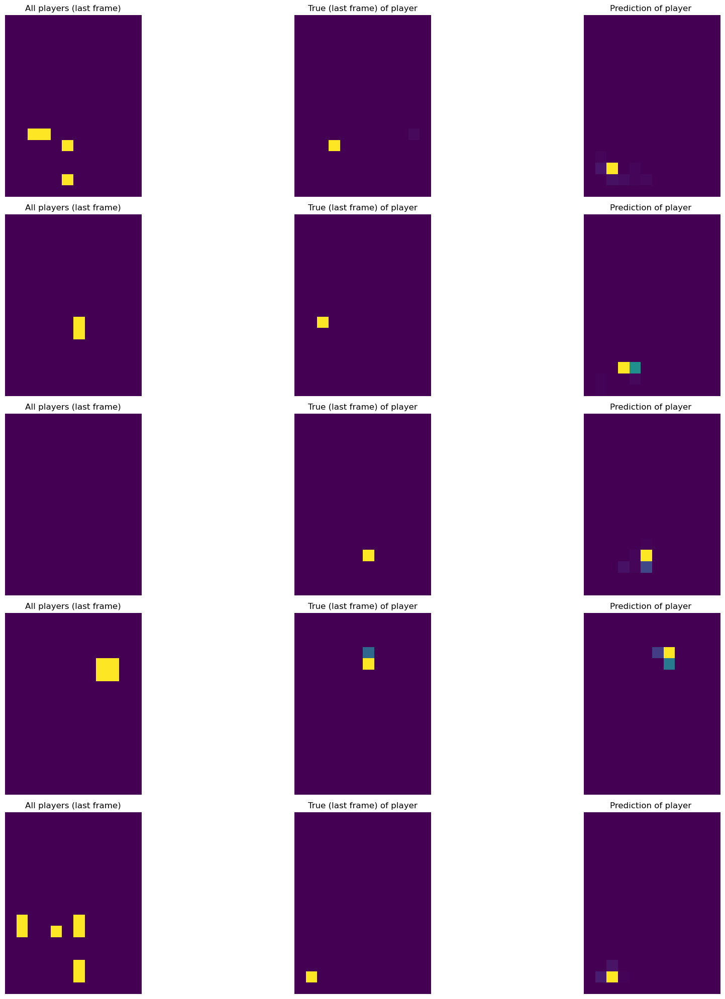

MODELO model1 - ESCENA Scene1
Epoch 1/25
322/322 [==============================] - 6s 13ms/step - loss: 0.0561 - mse: 0.0144 - mae: 0.0332 - val_loss: 0.0311 - val_mse: 0.0045 - val_mae: 0.0087
Epoch 2/25
322/322 [==============================] - 3s 10ms/step - loss: 0.0197 - mse: 0.0036 - mae: 0.0080 - val_loss: 0.0307 - val_mse: 0.0046 - val_mae: 0.0091
Epoch 3/25
322/322 [==============================] - 3s 10ms/step - loss: 0.0182 - mse: 0.0035 - mae: 0.0078 - val_loss: 0.0284 - val_mse: 0.0046 - val_mae: 0.0093
Epoch 4/25
322/322 [==============================] - 3s 10ms/step - loss: 0.0161 - mse: 0.0034 - mae: 0.0074 - val_loss: 0.0285 - val_mse: 0.0050 - val_mae: 0.0105
Epoch 5/25
322/322 [==============================] - 3s 10ms/step - loss: 0.0150 - mse: 0.0032 - mae: 0.0071 - val_loss: 0.0282 - val_mse: 0.0049 - val_mae: 0.0100
Epoch 6/25
322/322 [==============================] - 3s 10ms/step - loss: 0.0141 - mse: 0.0031 - mae: 0.0068 - val_loss: 0.0298 - val_mse: 0.005

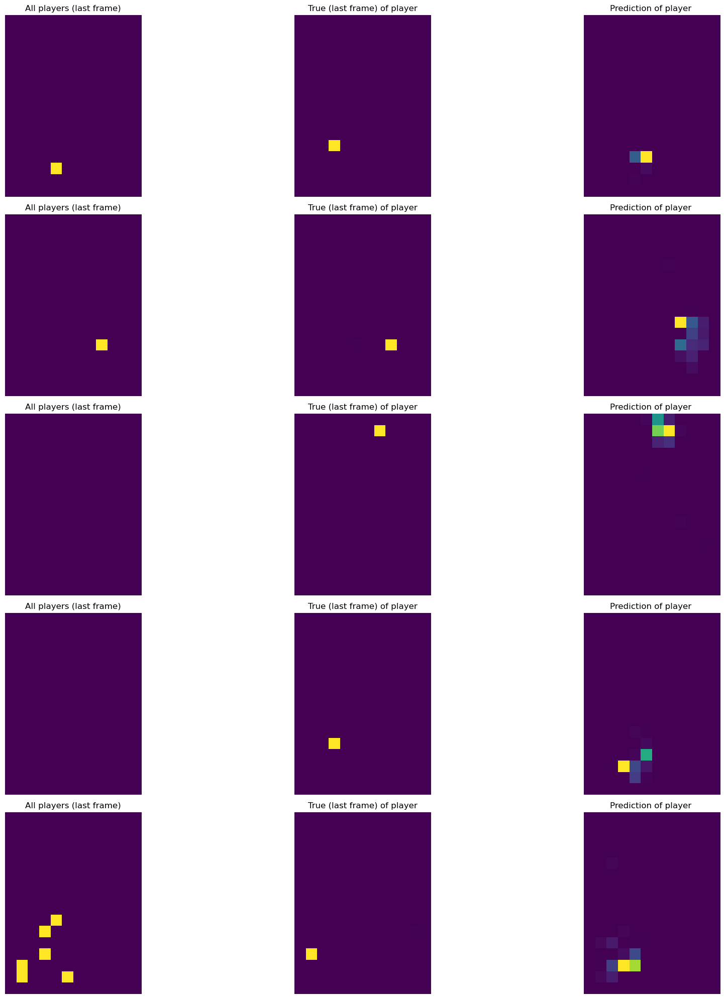

MODELO model2 - ESCENA Scene1
Epoch 1/25
322/322 [==============================] - 196s 603ms/step - loss: 0.2017 - mse: 0.0664 - mae: 0.1414 - val_loss: 0.1697 - val_mse: 0.0530 - val_mae: 0.1185
Epoch 2/25
322/322 [==============================] - 196s 608ms/step - loss: 0.1509 - mse: 0.0464 - mae: 0.1107 - val_loss: 0.1430 - val_mse: 0.0406 - val_mae: 0.1033
Epoch 3/25
322/322 [==============================] - 204s 632ms/step - loss: 0.1264 - mse: 0.0351 - mae: 0.0959 - val_loss: 0.1214 - val_mse: 0.0306 - val_mae: 0.0892
Epoch 4/25
322/322 [==============================] - 204s 632ms/step - loss: 0.1061 - mse: 0.0263 - mae: 0.0826 - val_loss: 0.1031 - val_mse: 0.0232 - val_mae: 0.0765
Epoch 5/25
322/322 [==============================] - 204s 634ms/step - loss: 0.0894 - mse: 0.0198 - mae: 0.0710 - val_loss: 0.0895 - val_mse: 0.0178 - val_mae: 0.0664
Epoch 6/25
322/322 [==============================] - 205s 637ms/step - loss: 0.0760 - mse: 0.0151 - mae: 0.0611 - val_loss: 0.078

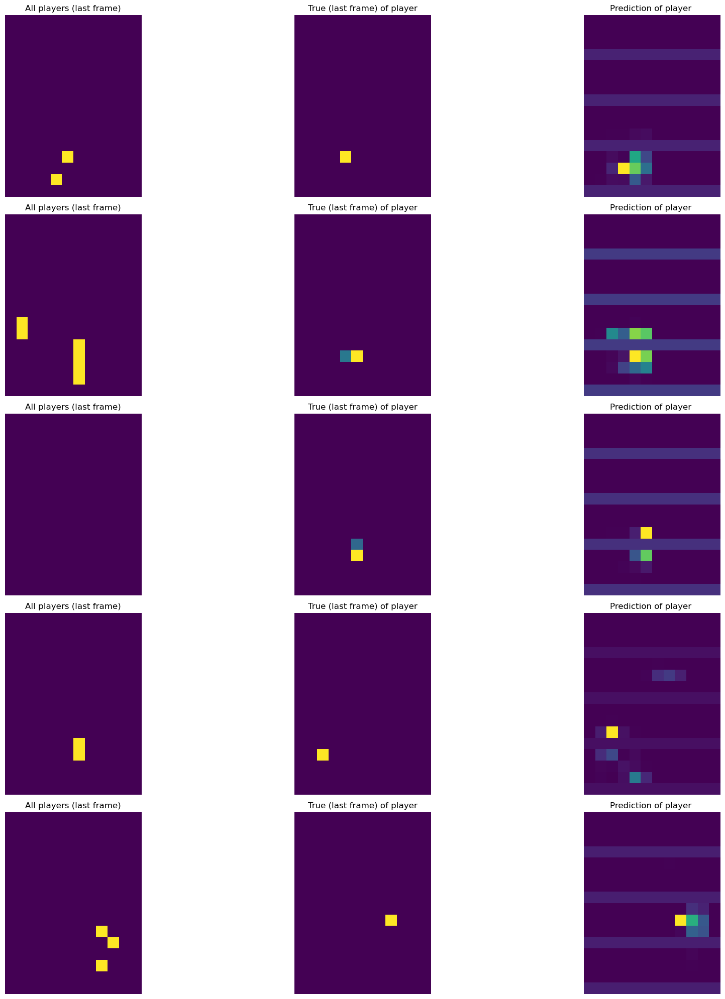

MODELO model4 - ESCENA Scene1
Epoch 1/25
322/322 [==============================] - 209s 639ms/step - loss: 0.2138 - mse: 0.0701 - mae: 0.1503 - val_loss: 0.1724 - val_mse: 0.0539 - val_mae: 0.1197
Epoch 2/25
322/322 [==============================] - 209s 651ms/step - loss: 0.1560 - mse: 0.0476 - mae: 0.1123 - val_loss: 0.1485 - val_mse: 0.0420 - val_mae: 0.1058
Epoch 3/25
322/322 [==============================] - 210s 653ms/step - loss: 0.1326 - mse: 0.0365 - mae: 0.0981 - val_loss: 0.1268 - val_mse: 0.0320 - val_mae: 0.0913
Epoch 4/25
322/322 [==============================] - 192s 597ms/step - loss: 0.1116 - mse: 0.0276 - mae: 0.0849 - val_loss: 0.1073 - val_mse: 0.0244 - val_mae: 0.0791
Epoch 5/25
322/322 [==============================] - 184s 571ms/step - loss: 0.0944 - mse: 0.0210 - mae: 0.0733 - val_loss: 0.0924 - val_mse: 0.0188 - val_mae: 0.0684
Epoch 6/25
322/322 [==============================] - 183s 569ms/step - loss: 0.0811 - mse: 0.0161 - mae: 0.0634 - val_loss: 0.080

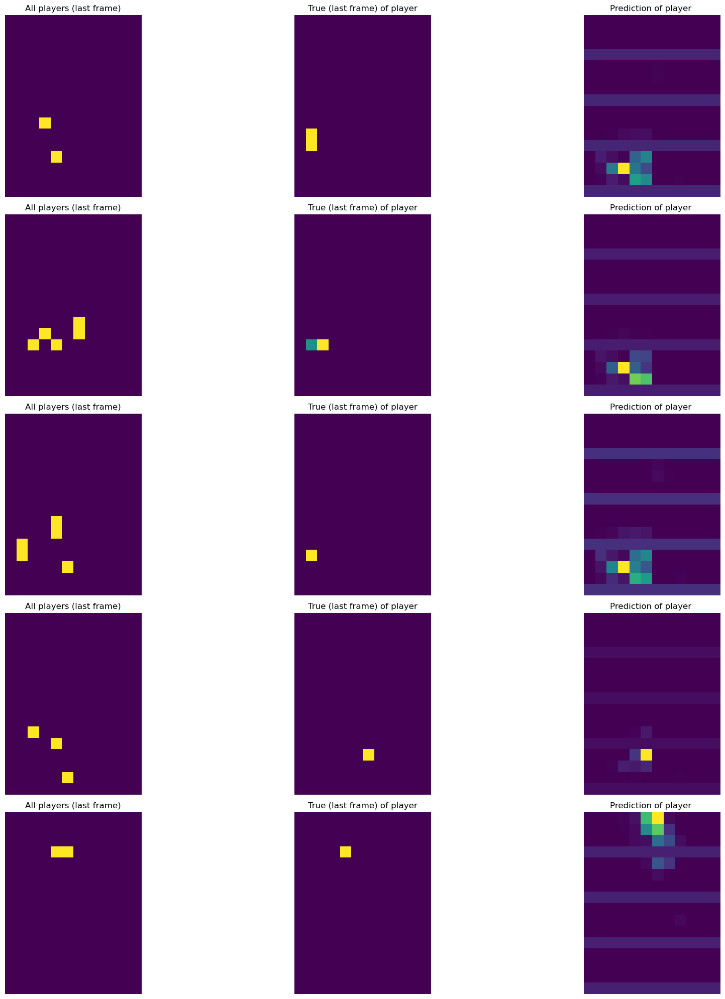

SCENE Scene2
TRAIN: [1933 1369 1718 ... 3961  731 5870]  TEST: [4672 4673 4674 4675 4676 4677 4678 4679 4680 4681 4682 4683 4684 4685
 4686 4687 4688 4689 4690 4691 4692 4693 4694 4695 4696 4697 4698 4699
 4700 4701 4702 4703 4704 4705 4706 4707 4708 4709 4710 4711 4712 4713
 4714 4715 4716 4717 4718 4719 4720 4721 4722 4723 4724 4725 4726 4727
 4728 4729 4730 4731 4732 4733 4734 4735 4736 4737 4738 4739 4740 4741
 4742 4743 4744 4745 4746 4747 4748 4749 4750 4751 4752 4753 4754 4755
 4756 4757 4758 4759 4760 4761 4762 4763 4764 4765 4766 4767 4768 4769
 4770 4771 4772 4773 4774 4775 4776 4777 4778 4779 4780 4781 4782 4783
 4784 4785 4786 4787 4788 4789 4790 4791 4792 4793 4794 4795 4796 4797
 4798 4799 4800 4801 4802 4803 4804 4805 4806 4807 4808 4809 4810 4811
 4812 4813 4814 4815 4816 4817 4818 4819 4820 4821 4822 4823 4824 4825
 4826 4827 4828 4829 4830 4831 4832 4833 4834 4835 4836 4837 4838 4839
 4840 4841 4842 4843 4844 4845 4846 4847 4848 4849 4850 4851 4852 4853
 4854 4855 485

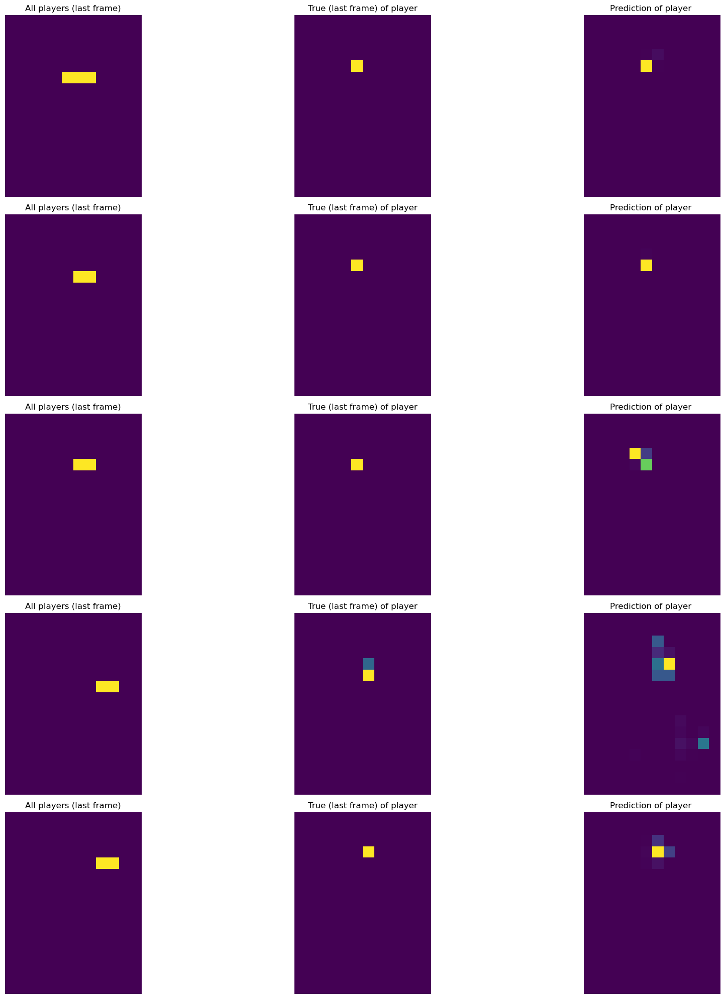

MODELO model1 - ESCENA Scene2
Epoch 1/25
433/433 [==============================] - 8s 14ms/step - loss: 0.0483 - mse: 0.0119 - mae: 0.0273 - val_loss: 0.0282 - val_mse: 0.0050 - val_mae: 0.0108
Epoch 2/25
433/433 [==============================] - 5s 11ms/step - loss: 0.0199 - mse: 0.0038 - mae: 0.0083 - val_loss: 0.0243 - val_mse: 0.0048 - val_mae: 0.0093
Epoch 3/25
433/433 [==============================] - 5s 11ms/step - loss: 0.0182 - mse: 0.0037 - mae: 0.0080 - val_loss: 0.0220 - val_mse: 0.0047 - val_mae: 0.0100
Epoch 4/25
433/433 [==============================] - 5s 11ms/step - loss: 0.0165 - mse: 0.0035 - mae: 0.0077 - val_loss: 0.0190 - val_mse: 0.0043 - val_mae: 0.0093
Epoch 5/25
433/433 [==============================] - 5s 11ms/step - loss: 0.0156 - mse: 0.0034 - mae: 0.0074 - val_loss: 0.0196 - val_mse: 0.0043 - val_mae: 0.0096
Epoch 6/25
433/433 [==============================] - 5s 11ms/step - loss: 0.0145 - mse: 0.0033 - mae: 0.0071 - val_loss: 0.0170 - val_mse: 0.004

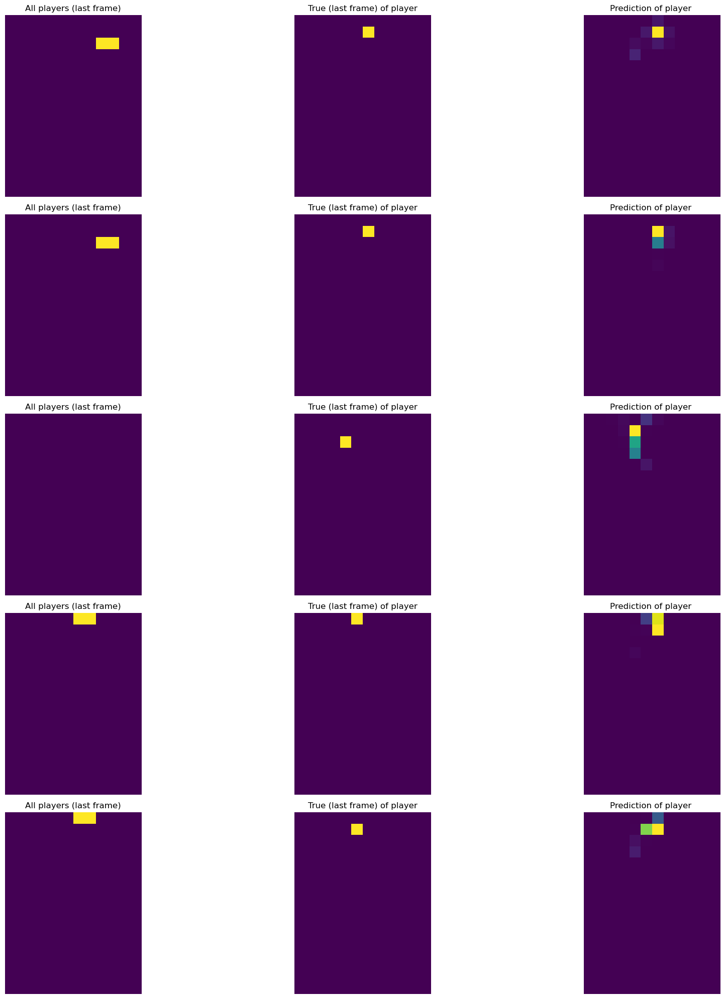

MODELO model2 - ESCENA Scene2
Epoch 1/25
433/433 [==============================] - 282s 646ms/step - loss: 0.1912 - mse: 0.0623 - mae: 0.1347 - val_loss: 0.1611 - val_mse: 0.0496 - val_mae: 0.1139
Epoch 2/25
433/433 [==============================] - 280s 646ms/step - loss: 0.1379 - mse: 0.0403 - mae: 0.1029 - val_loss: 0.1285 - val_mse: 0.0344 - val_mae: 0.0944
Epoch 3/25
433/433 [==============================] - 297s 685ms/step - loss: 0.1090 - mse: 0.0275 - mae: 0.0844 - val_loss: 0.1040 - val_mse: 0.0239 - val_mae: 0.0782
Epoch 4/25
433/433 [==============================] - 312s 720ms/step - loss: 0.0875 - mse: 0.0189 - mae: 0.0691 - val_loss: 0.0850 - val_mse: 0.0169 - val_mae: 0.0652
Epoch 5/25
433/433 [==============================] - 307s 710ms/step - loss: 0.0715 - mse: 0.0134 - mae: 0.0568 - val_loss: 0.0700 - val_mse: 0.0125 - val_mae: 0.0530
Epoch 6/25
433/433 [==============================] - 299s 691ms/step - loss: 0.0592 - mse: 0.0099 - mae: 0.0470 - val_loss: 0.058

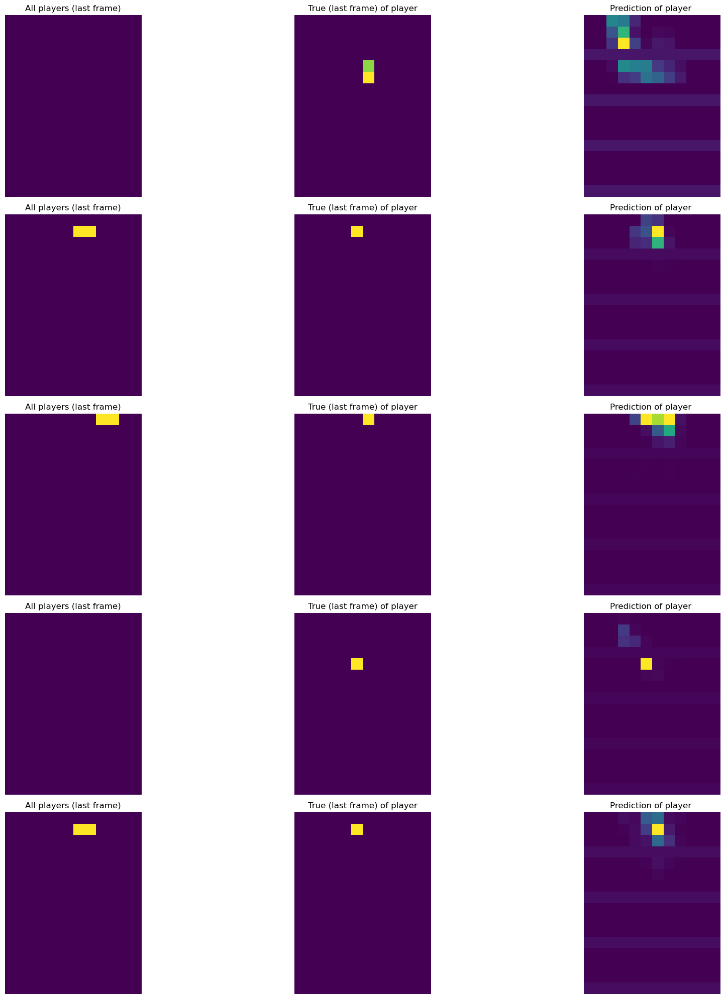

MODELO model4 - ESCENA Scene2
Epoch 1/25
433/433 [==============================] - 327s 748ms/step - loss: 0.2006 - mse: 0.0651 - mae: 0.1411 - val_loss: 0.1663 - val_mse: 0.0506 - val_mae: 0.1162
Epoch 2/25
433/433 [==============================] - 312s 720ms/step - loss: 0.1439 - mse: 0.0416 - mae: 0.1048 - val_loss: 0.1350 - val_mse: 0.0357 - val_mae: 0.0970
Epoch 3/25
433/433 [==============================] - 316s 731ms/step - loss: 0.1157 - mse: 0.0288 - mae: 0.0867 - val_loss: 0.1108 - val_mse: 0.0250 - val_mae: 0.0795
Epoch 4/25
433/433 [==============================] - 317s 733ms/step - loss: 0.0927 - mse: 0.0199 - mae: 0.0712 - val_loss: 0.0882 - val_mse: 0.0178 - val_mae: 0.0656
Epoch 5/25
433/433 [==============================] - 296s 684ms/step - loss: 0.0758 - mse: 0.0142 - mae: 0.0587 - val_loss: 0.0732 - val_mse: 0.0131 - val_mae: 0.0556
Epoch 6/25
433/433 [==============================] - 272s 629ms/step - loss: 0.0631 - mse: 0.0105 - mae: 0.0487 - val_loss: 0.063

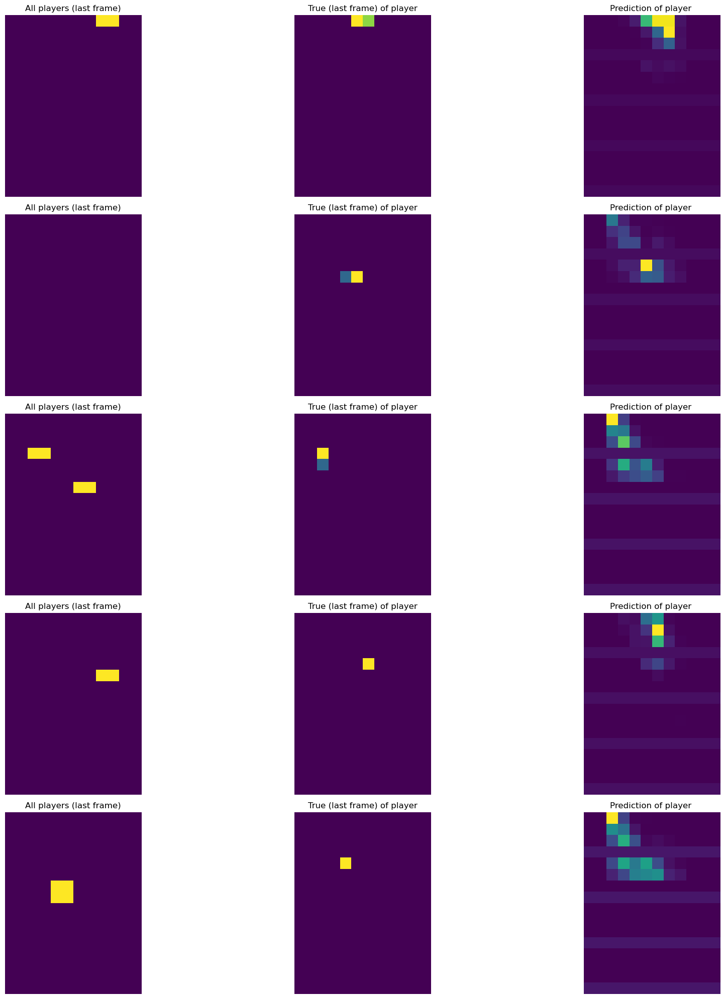

SCENE Scene3
TRAIN: [5708 6977 6564 ... 6807  634 1447]  TEST: [   0    1    2 ... 5423 5424 5425]
MODELO model0 - ESCENA Scene3
Epoch 1/25
381/381 [==============================] - 442s 1s/step - loss: 0.0371 - mse: 0.0061 - mae: 0.0147 - val_loss: 0.0275 - val_mse: 0.0039 - val_mae: 0.0094
Epoch 2/25
381/381 [==============================] - 412s 1s/step - loss: 0.0248 - mse: 0.0040 - mae: 0.0087 - val_loss: 0.0262 - val_mse: 0.0039 - val_mae: 0.0091
Epoch 3/25
381/381 [==============================] - 424s 1s/step - loss: 0.0216 - mse: 0.0039 - mae: 0.0086 - val_loss: 0.0234 - val_mse: 0.0039 - val_mae: 0.0096
Epoch 4/25
381/381 [==============================] - 434s 1s/step - loss: 0.0210 - mse: 0.0039 - mae: 0.0085 - val_loss: 0.0242 - val_mse: 0.0039 - val_mae: 0.0081
Epoch 5/25
381/381 [==============================] - 433s 1s/step - loss: 0.0209 - mse: 0.0039 - mae: 0.0085 - val_loss: 0.0230 - val_mse: 0.0039 - val_mae: 0.0084
Epoch 6/25
381/381 [==========================

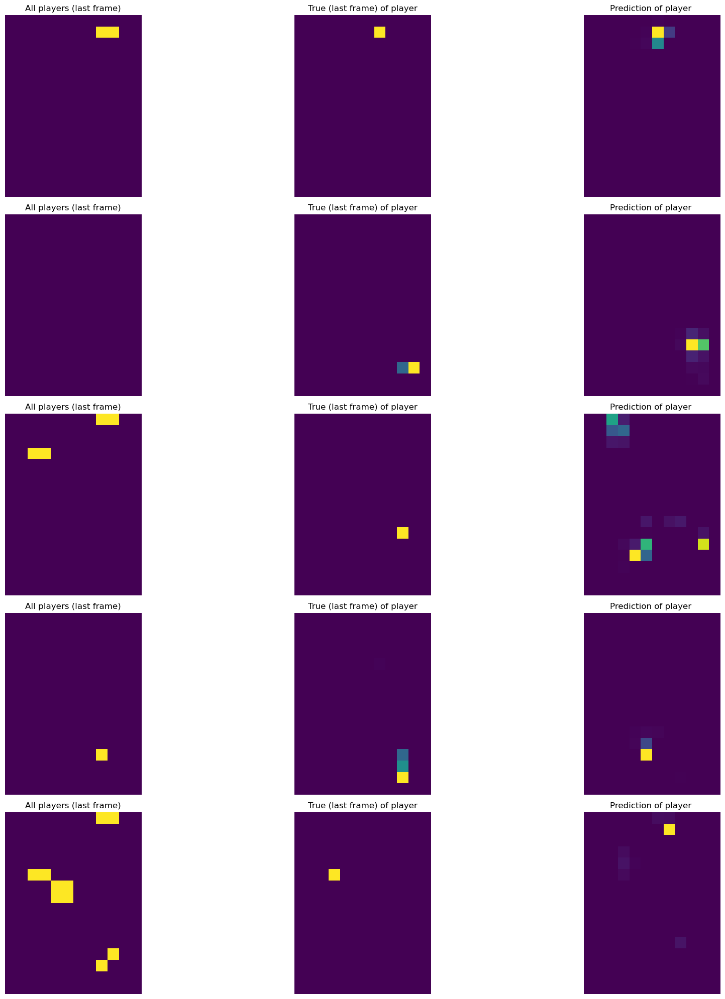

MODELO model1 - ESCENA Scene3
Epoch 1/25
381/381 [==============================] - 20s 47ms/step - loss: 0.0517 - mse: 0.0128 - mae: 0.0297 - val_loss: 0.0251 - val_mse: 0.0039 - val_mae: 0.0088
Epoch 2/25
381/381 [==============================] - 18s 46ms/step - loss: 0.0203 - mse: 0.0038 - mae: 0.0084 - val_loss: 0.0234 - val_mse: 0.0039 - val_mae: 0.0077
Epoch 3/25
381/381 [==============================] - 17s 46ms/step - loss: 0.0181 - mse: 0.0037 - mae: 0.0080 - val_loss: 0.0218 - val_mse: 0.0039 - val_mae: 0.0085
Epoch 4/25
381/381 [==============================] - 18s 46ms/step - loss: 0.0169 - mse: 0.0036 - mae: 0.0078 - val_loss: 0.0207 - val_mse: 0.0038 - val_mae: 0.0079
Epoch 5/25
381/381 [==============================] - 17s 46ms/step - loss: 0.0155 - mse: 0.0034 - mae: 0.0074 - val_loss: 0.0210 - val_mse: 0.0040 - val_mae: 0.0082
Epoch 6/25
381/381 [==============================] - 17s 46ms/step - loss: 0.0145 - mse: 0.0033 - mae: 0.0071 - val_loss: 0.0208 - val_mse:

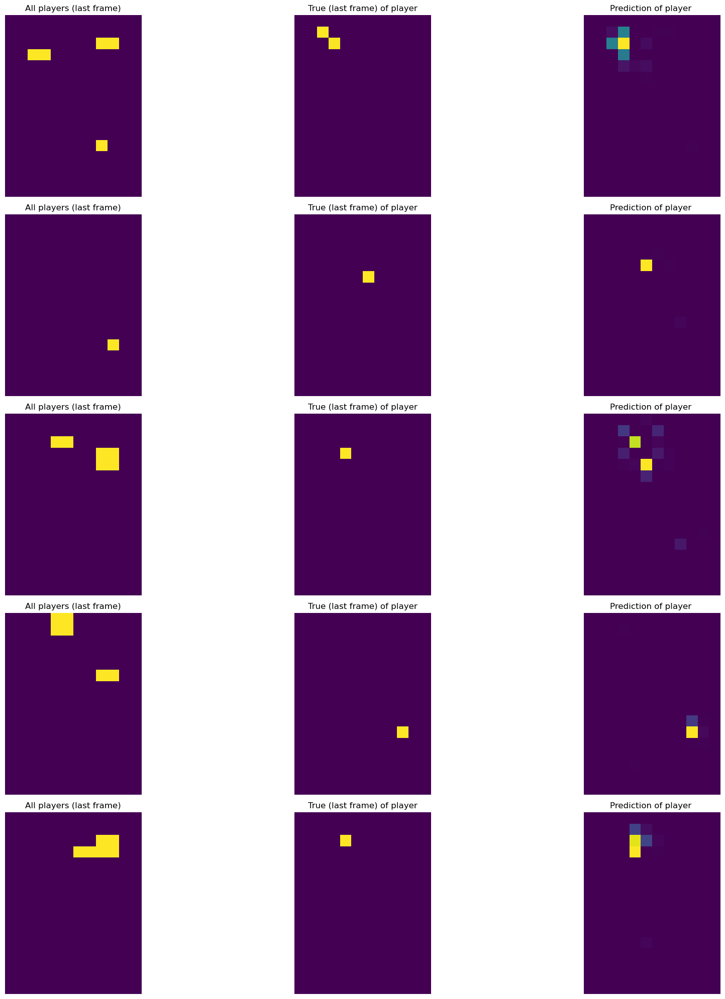

MODELO model2 - ESCENA Scene3
Epoch 1/25
381/381 [==============================] - 291s 759ms/step - loss: 0.1956 - mse: 0.0642 - mae: 0.1376 - val_loss: 0.1629 - val_mse: 0.0506 - val_mae: 0.1155
Epoch 2/25
381/381 [==============================] - 333s 873ms/step - loss: 0.1439 - mse: 0.0432 - mae: 0.1066 - val_loss: 0.1322 - val_mse: 0.0365 - val_mae: 0.0973
Epoch 3/25
381/381 [==============================] - 334s 877ms/step - loss: 0.1168 - mse: 0.0309 - mae: 0.0897 - val_loss: 0.1082 - val_mse: 0.0262 - val_mae: 0.0826
Epoch 4/25
381/381 [==============================] - 333s 873ms/step - loss: 0.0957 - mse: 0.0221 - mae: 0.0752 - val_loss: 0.0903 - val_mse: 0.0188 - val_mae: 0.0682
Epoch 5/25
381/381 [==============================] - 333s 873ms/step - loss: 0.0795 - mse: 0.0161 - mae: 0.0631 - val_loss: 0.0751 - val_mse: 0.0140 - val_mae: 0.0584
Epoch 6/25
381/381 [==============================] - 333s 875ms/step - loss: 0.0667 - mse: 0.0120 - mae: 0.0532 - val_loss: 0.064

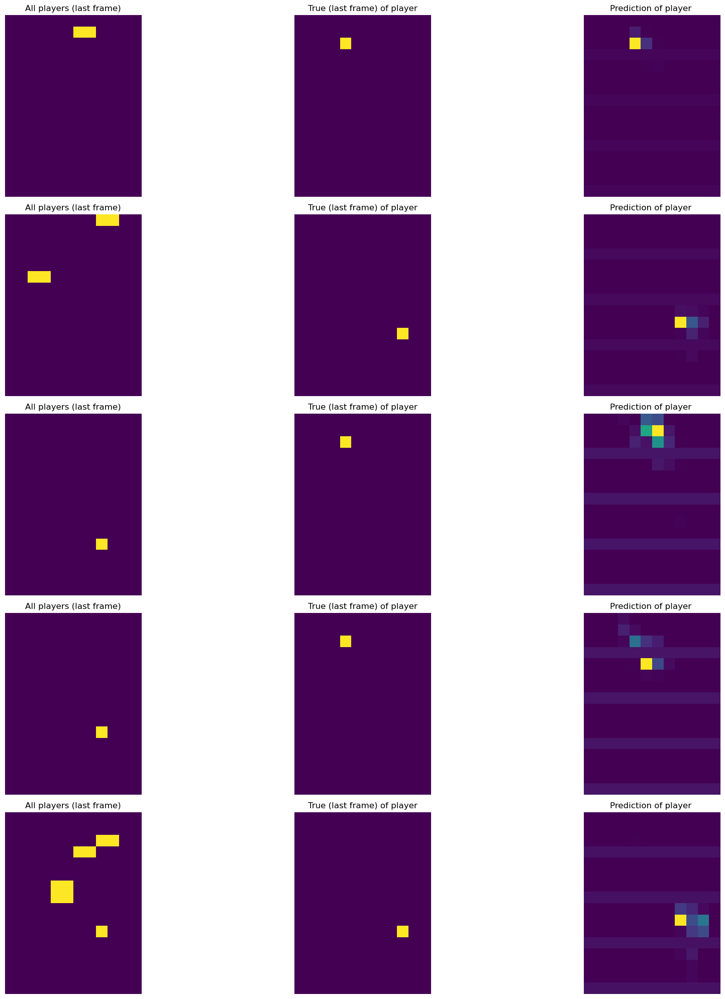

MODELO model4 - ESCENA Scene3
Epoch 1/25
381/381 [==============================] - 335s 872ms/step - loss: 0.2053 - mse: 0.0670 - mae: 0.1443 - val_loss: 0.1676 - val_mse: 0.0515 - val_mae: 0.1170
Epoch 2/25
381/381 [==============================] - 330s 866ms/step - loss: 0.1493 - mse: 0.0443 - mae: 0.1082 - val_loss: 0.1391 - val_mse: 0.0378 - val_mae: 0.1002
Epoch 3/25
381/381 [==============================] - 329s 863ms/step - loss: 0.1212 - mse: 0.0321 - mae: 0.0917 - val_loss: 0.1128 - val_mse: 0.0272 - val_mae: 0.0847
Epoch 4/25
381/381 [==============================] - 329s 863ms/step - loss: 0.0997 - mse: 0.0232 - mae: 0.0771 - val_loss: 0.0931 - val_mse: 0.0198 - val_mae: 0.0716
Epoch 5/25
381/381 [==============================] - 330s 866ms/step - loss: 0.0830 - mse: 0.0169 - mae: 0.0650 - val_loss: 0.0795 - val_mse: 0.0148 - val_mae: 0.0634
Epoch 6/25
381/381 [==============================] - 329s 864ms/step - loss: 0.0702 - mse: 0.0127 - mae: 0.0550 - val_loss: 0.067

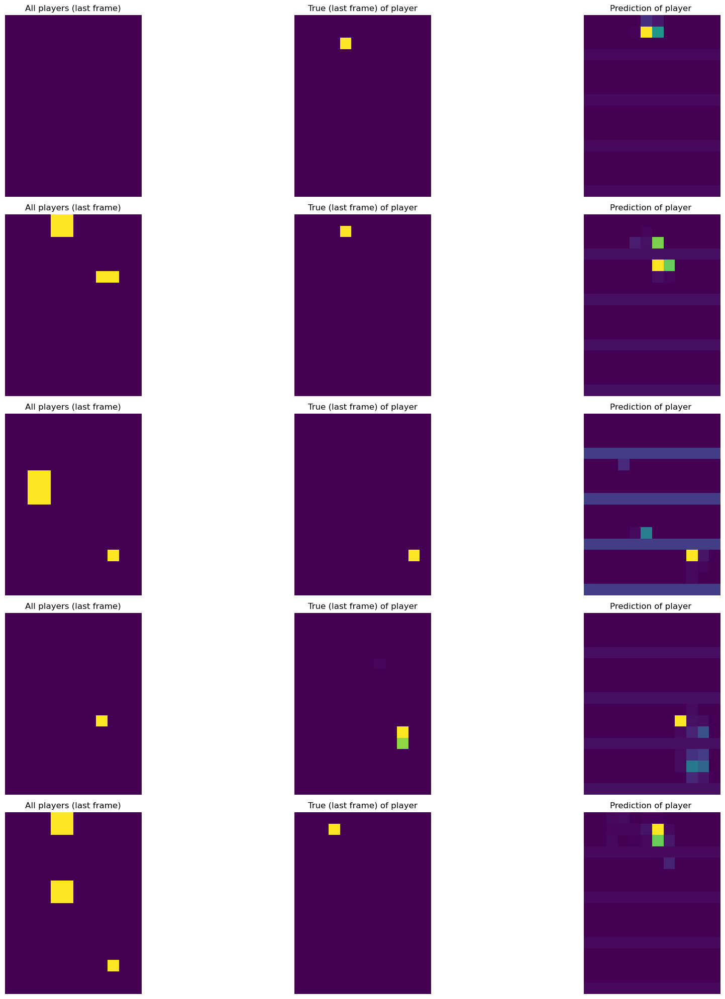

SCENE Scene4
TRAIN: [4591 1187 6763 ...  123  252 6309]  TEST: [ 346  347  348 ... 5853 5854 5855]
MODELO model0 - ESCENA Scene4
Epoch 1/25
376/376 [==============================] - 512s 1s/step - loss: 0.0378 - mse: 0.0062 - mae: 0.0149 - val_loss: 0.0258 - val_mse: 0.0039 - val_mae: 0.0093
Epoch 2/25
376/376 [==============================] - 502s 1s/step - loss: 0.0236 - mse: 0.0039 - mae: 0.0087 - val_loss: 0.0228 - val_mse: 0.0038 - val_mae: 0.0082
Epoch 3/25
376/376 [==============================] - 504s 1s/step - loss: 0.0201 - mse: 0.0038 - mae: 0.0084 - val_loss: 0.0221 - val_mse: 0.0038 - val_mae: 0.0073
Epoch 4/25
376/376 [==============================] - 503s 1s/step - loss: 0.0182 - mse: 0.0037 - mae: 0.0081 - val_loss: 0.0181 - val_mse: 0.0037 - val_mae: 0.0083
Epoch 5/25
376/376 [==============================] - 503s 1s/step - loss: 0.0170 - mse: 0.0036 - mae: 0.0078 - val_loss: 0.0177 - val_mse: 0.0036 - val_mae: 0.0072
Epoch 6/25
376/376 [==========================

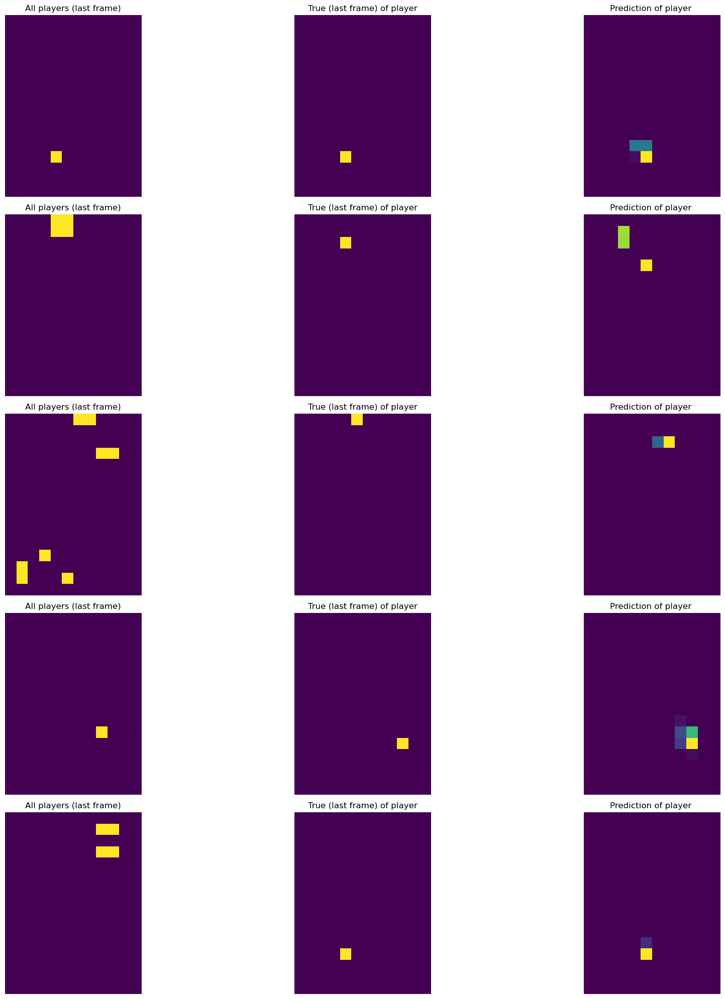

MODELO model1 - ESCENA Scene4
Epoch 1/25
376/376 [==============================] - 24s 58ms/step - loss: 0.0527 - mse: 0.0131 - mae: 0.0303 - val_loss: 0.0218 - val_mse: 0.0038 - val_mae: 0.0081
Epoch 2/25
376/376 [==============================] - 21s 57ms/step - loss: 0.0205 - mse: 0.0039 - mae: 0.0085 - val_loss: 0.0204 - val_mse: 0.0038 - val_mae: 0.0083
Epoch 3/25
376/376 [==============================] - 21s 57ms/step - loss: 0.0184 - mse: 0.0037 - mae: 0.0081 - val_loss: 0.0203 - val_mse: 0.0038 - val_mae: 0.0081
Epoch 4/25
376/376 [==============================] - 21s 57ms/step - loss: 0.0169 - mse: 0.0036 - mae: 0.0078 - val_loss: 0.0188 - val_mse: 0.0038 - val_mae: 0.0082
Epoch 5/25
376/376 [==============================] - 21s 57ms/step - loss: 0.0157 - mse: 0.0034 - mae: 0.0075 - val_loss: 0.0188 - val_mse: 0.0038 - val_mae: 0.0078
Epoch 6/25
376/376 [==============================] - 21s 57ms/step - loss: 0.0147 - mse: 0.0033 - mae: 0.0072 - val_loss: 0.0180 - val_mse:

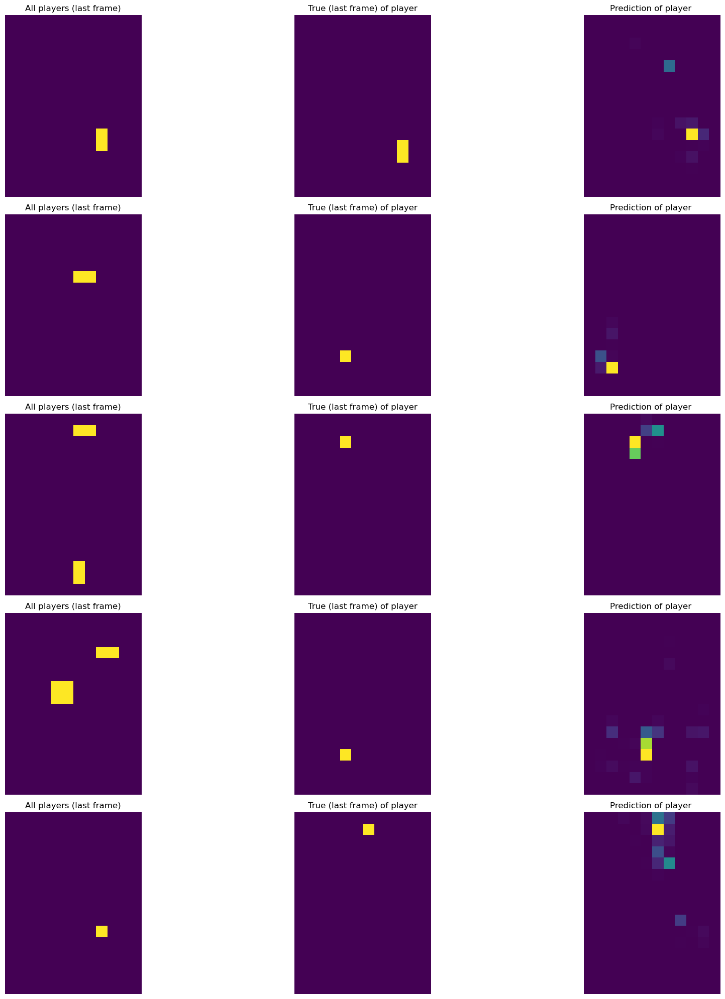

MODELO model2 - ESCENA Scene4
Epoch 1/25
376/376 [==============================] - 322s 852ms/step - loss: 0.1962 - mse: 0.0643 - mae: 0.1378 - val_loss: 0.1600 - val_mse: 0.0507 - val_mae: 0.1157
Epoch 2/25
376/376 [==============================] - 321s 854ms/step - loss: 0.1445 - mse: 0.0434 - mae: 0.1069 - val_loss: 0.1305 - val_mse: 0.0367 - val_mae: 0.0984
Epoch 3/25
376/376 [==============================] - 322s 856ms/step - loss: 0.1176 - mse: 0.0312 - mae: 0.0902 - val_loss: 0.1069 - val_mse: 0.0263 - val_mae: 0.0824
Epoch 4/25
376/376 [==============================] - 321s 855ms/step - loss: 0.0967 - mse: 0.0224 - mae: 0.0758 - val_loss: 0.0885 - val_mse: 0.0190 - val_mae: 0.0696
Epoch 5/25
376/376 [==============================] - 321s 854ms/step - loss: 0.0805 - mse: 0.0164 - mae: 0.0638 - val_loss: 0.0744 - val_mse: 0.0141 - val_mae: 0.0584
Epoch 6/25
376/376 [==============================] - 322s 857ms/step - loss: 0.0679 - mse: 0.0123 - mae: 0.0539 - val_loss: 0.063

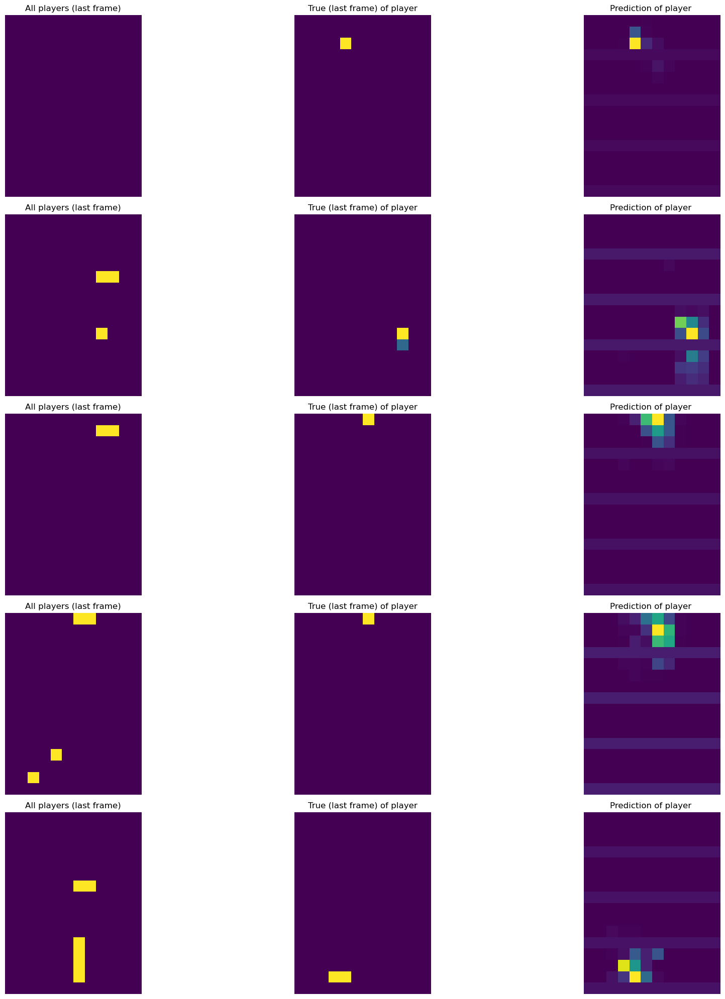

MODELO model4 - ESCENA Scene4
Epoch 1/25
376/376 [==============================] - 325s 857ms/step - loss: 0.2059 - mse: 0.0671 - mae: 0.1444 - val_loss: 0.1646 - val_mse: 0.0516 - val_mae: 0.1174
Epoch 2/25
376/376 [==============================] - 319s 847ms/step - loss: 0.1502 - mse: 0.0446 - mae: 0.1085 - val_loss: 0.1360 - val_mse: 0.0379 - val_mae: 0.1004
Epoch 3/25
376/376 [==============================] - 318s 846ms/step - loss: 0.1235 - mse: 0.0324 - mae: 0.0923 - val_loss: 0.1105 - val_mse: 0.0274 - val_mae: 0.0846
Epoch 4/25
376/376 [==============================] - 319s 849ms/step - loss: 0.1010 - mse: 0.0235 - mae: 0.0777 - val_loss: 0.0916 - val_mse: 0.0199 - val_mae: 0.0717
Epoch 5/25
376/376 [==============================] - 318s 847ms/step - loss: 0.0841 - mse: 0.0172 - mae: 0.0656 - val_loss: 0.0770 - val_mse: 0.0147 - val_mae: 0.0606
Epoch 6/25
376/376 [==============================] - 319s 850ms/step - loss: 0.0712 - mse: 0.0129 - mae: 0.0556 - val_loss: 0.067

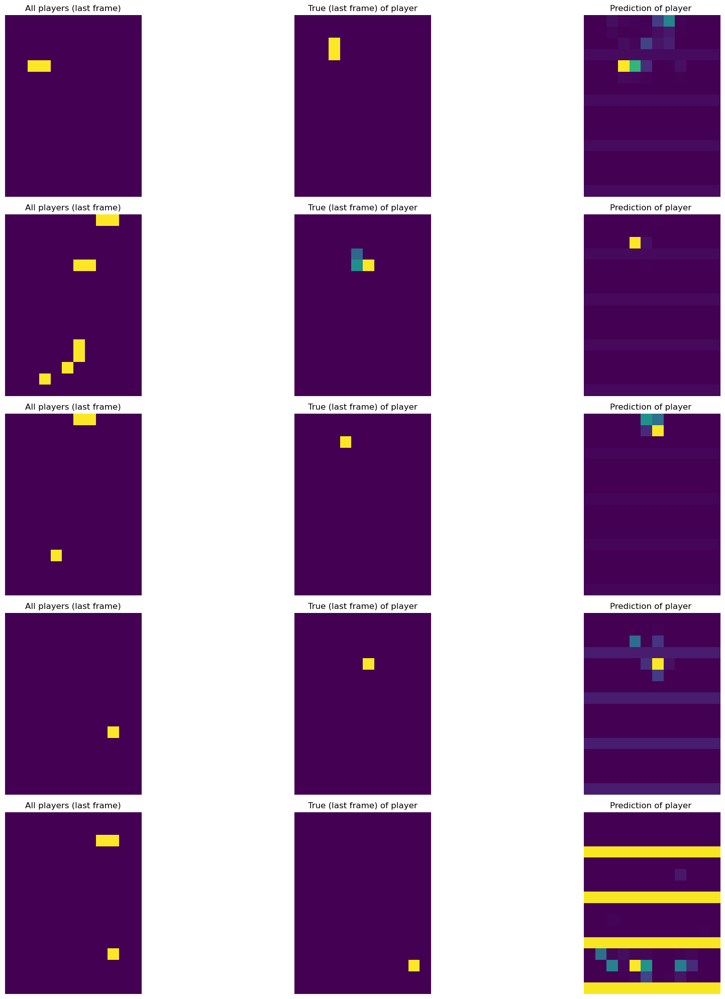

SCENE Scene5
TRAIN: [3532  703  519 ... 2772 3931 3945]  TEST: [ 717  718  719 ... 6348 6349 6350]
MODELO model0 - ESCENA Scene5
Epoch 1/25
364/364 [==============================] - 547s 1s/step - loss: 0.0385 - mse: 0.0063 - mae: 0.0151 - val_loss: 0.0248 - val_mse: 0.0039 - val_mae: 0.0086
Epoch 2/25
364/364 [==============================] - 537s 1s/step - loss: 0.0236 - mse: 0.0039 - mae: 0.0087 - val_loss: 0.0223 - val_mse: 0.0039 - val_mae: 0.0083
Epoch 3/25
364/364 [==============================] - 546s 2s/step - loss: 0.0195 - mse: 0.0038 - mae: 0.0083 - val_loss: 0.0192 - val_mse: 0.0038 - val_mae: 0.0082
Epoch 4/25
364/364 [==============================] - 551s 2s/step - loss: 0.0170 - mse: 0.0036 - mae: 0.0078 - val_loss: 0.0173 - val_mse: 0.0036 - val_mae: 0.0080
Epoch 5/25
364/364 [==============================] - 556s 2s/step - loss: 0.0152 - mse: 0.0034 - mae: 0.0074 - val_loss: 0.0175 - val_mse: 0.0036 - val_mae: 0.0070
Epoch 6/25
364/364 [==========================

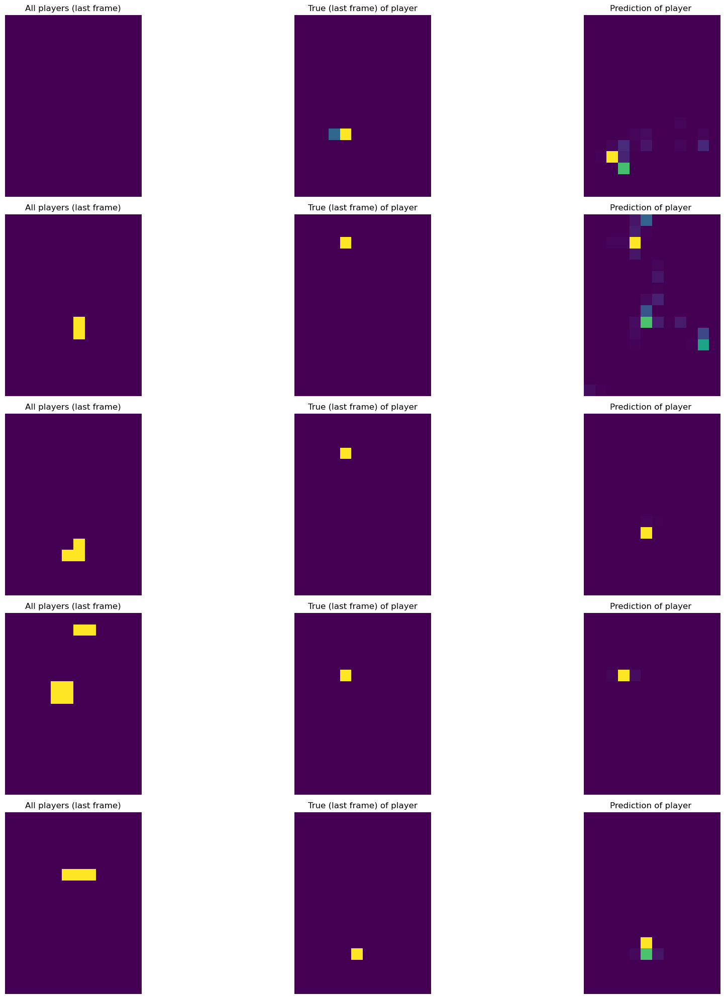

MODELO model1 - ESCENA Scene5
Epoch 1/25
364/364 [==============================] - 24s 62ms/step - loss: 0.0537 - mse: 0.0134 - mae: 0.0308 - val_loss: 0.0218 - val_mse: 0.0039 - val_mae: 0.0086
Epoch 2/25
364/364 [==============================] - 23s 63ms/step - loss: 0.0205 - mse: 0.0039 - mae: 0.0085 - val_loss: 0.0208 - val_mse: 0.0038 - val_mae: 0.0075
Epoch 3/25
364/364 [==============================] - 23s 63ms/step - loss: 0.0189 - mse: 0.0038 - mae: 0.0082 - val_loss: 0.0194 - val_mse: 0.0038 - val_mae: 0.0080
Epoch 4/25
364/364 [==============================] - 23s 63ms/step - loss: 0.0172 - mse: 0.0036 - mae: 0.0079 - val_loss: 0.0188 - val_mse: 0.0038 - val_mae: 0.0075
Epoch 5/25
364/364 [==============================] - 23s 63ms/step - loss: 0.0157 - mse: 0.0034 - mae: 0.0075 - val_loss: 0.0184 - val_mse: 0.0038 - val_mae: 0.0078
Epoch 6/25
364/364 [==============================] - 23s 63ms/step - loss: 0.0149 - mse: 0.0034 - mae: 0.0073 - val_loss: 0.0187 - val_mse:

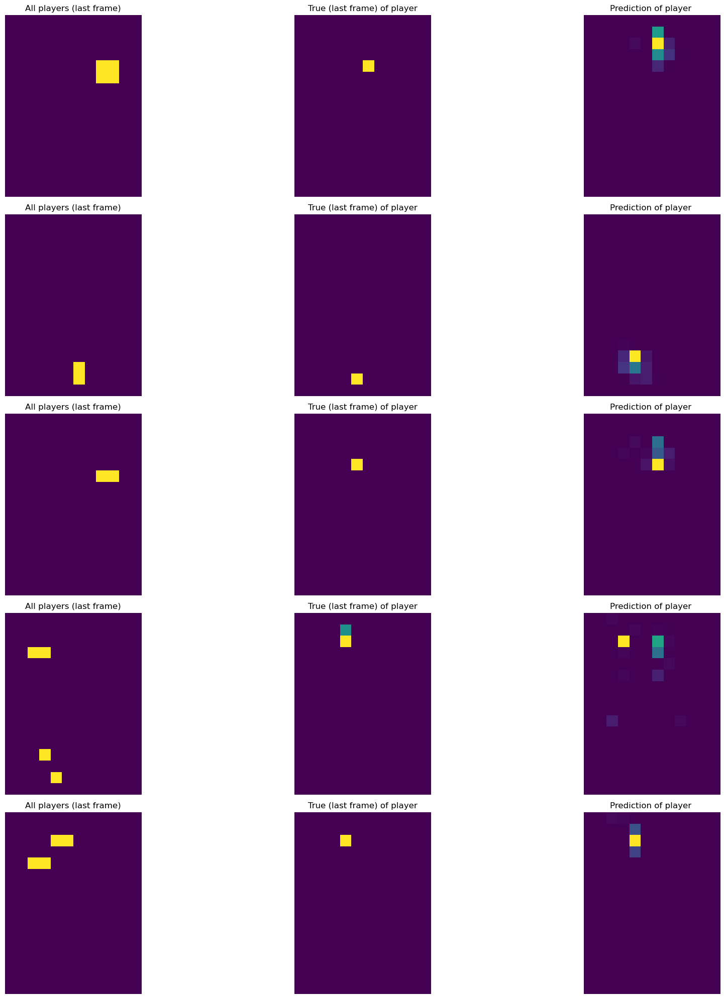

MODELO model2 - ESCENA Scene5
Epoch 1/25
364/364 [==============================] - 374s 1s/step - loss: 0.1975 - mse: 0.0648 - mae: 0.1385 - val_loss: 0.1617 - val_mse: 0.0514 - val_mae: 0.1162
Epoch 2/25
364/364 [==============================] - 337s 926ms/step - loss: 0.1460 - mse: 0.0441 - mae: 0.1077 - val_loss: 0.1330 - val_mse: 0.0377 - val_mae: 0.0999
Epoch 3/25
364/364 [==============================] - 331s 908ms/step - loss: 0.1196 - mse: 0.0320 - mae: 0.0915 - val_loss: 0.1097 - val_mse: 0.0273 - val_mae: 0.0840
Epoch 4/25
364/364 [==============================] - 353s 969ms/step - loss: 0.0987 - mse: 0.0232 - mae: 0.0773 - val_loss: 0.0908 - val_mse: 0.0199 - val_mae: 0.0711
Epoch 5/25
364/364 [==============================] - 380s 1s/step - loss: 0.0823 - mse: 0.0171 - mae: 0.0653 - val_loss: 0.0760 - val_mse: 0.0148 - val_mae: 0.0605
Epoch 6/25
364/364 [==============================] - 370s 1s/step - loss: 0.0694 - mse: 0.0129 - mae: 0.0554 - val_loss: 0.0644 - val_m

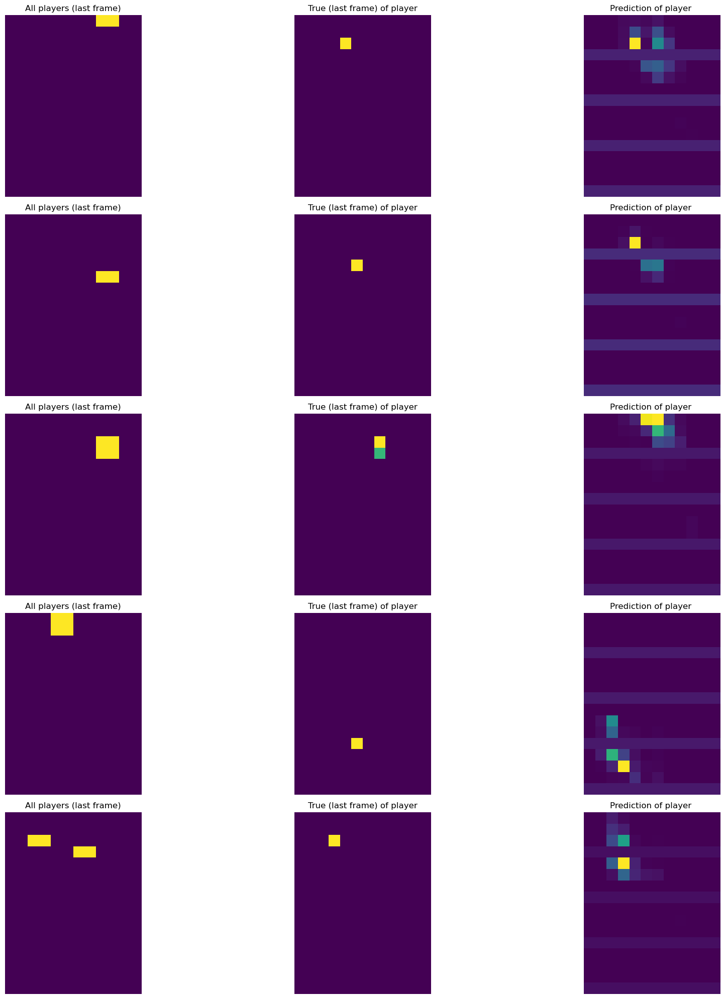

MODELO model4 - ESCENA Scene5
Epoch 1/25
364/364 [==============================] - 357s 970ms/step - loss: 0.2078 - mse: 0.0678 - mae: 0.1458 - val_loss: 0.1663 - val_mse: 0.0523 - val_mae: 0.1182
Epoch 2/25
364/364 [==============================] - 350s 963ms/step - loss: 0.1516 - mse: 0.0453 - mae: 0.1093 - val_loss: 0.1387 - val_mse: 0.0390 - val_mae: 0.1014
Epoch 3/25
364/364 [==============================] - 349s 959ms/step - loss: 0.1251 - mse: 0.0333 - mae: 0.0935 - val_loss: 0.1130 - val_mse: 0.0285 - val_mae: 0.0861
Epoch 4/25
364/364 [==============================] - 349s 959ms/step - loss: 0.1034 - mse: 0.0244 - mae: 0.0793 - val_loss: 0.0954 - val_mse: 0.0210 - val_mae: 0.0749
Epoch 5/25
364/364 [==============================] - 349s 960ms/step - loss: 0.0868 - mse: 0.0180 - mae: 0.0673 - val_loss: 0.0830 - val_mse: 0.0159 - val_mae: 0.0669
Epoch 6/25
364/364 [==============================] - 349s 959ms/step - loss: 0.0733 - mse: 0.0136 - mae: 0.0572 - val_loss: 0.068

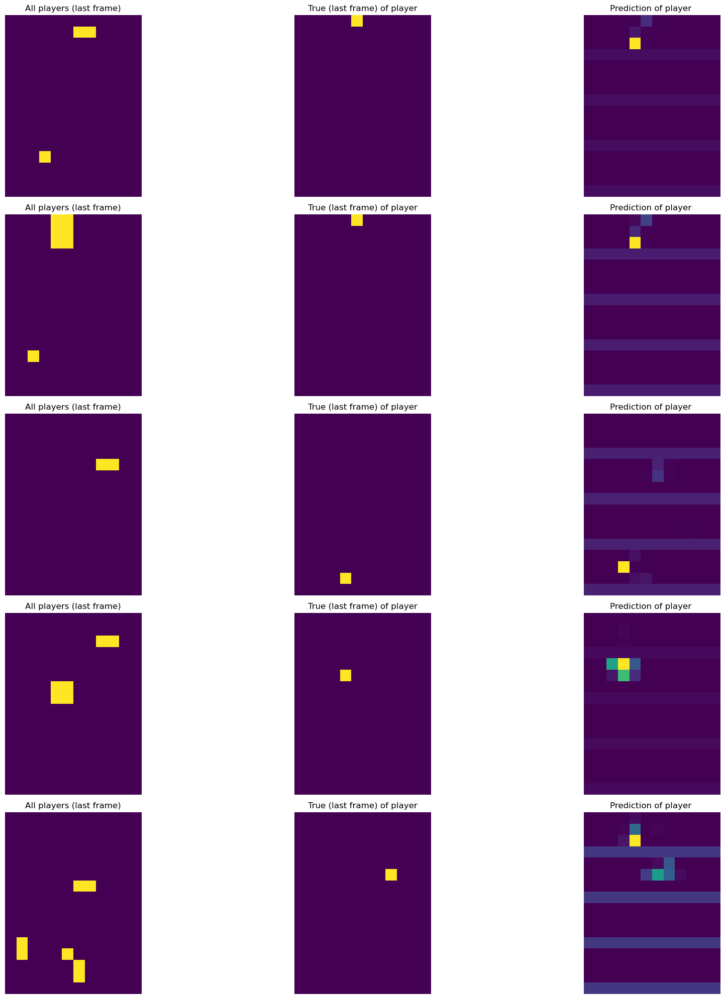

SCENE Scene6
TRAIN: [1609 3059 5426 ... 5248  841 5831]  TEST: [1174 1175 1176 ... 6726 6727 6728]
MODELO model0 - ESCENA Scene6
Epoch 1/25
388/388 [==============================] - 603s 2s/step - loss: 0.0385 - mse: 0.0063 - mae: 0.0151 - val_loss: 0.0232 - val_mse: 0.0028 - val_mae: 0.0096
Epoch 2/25
388/388 [==============================] - 596s 2s/step - loss: 0.0244 - mse: 0.0041 - mae: 0.0091 - val_loss: 0.0180 - val_mse: 0.0028 - val_mae: 0.0076
Epoch 3/25
388/388 [==============================] - 597s 2s/step - loss: 0.0203 - mse: 0.0040 - mae: 0.0087 - val_loss: 0.0160 - val_mse: 0.0028 - val_mae: 0.0082
Epoch 4/25
388/388 [==============================] - 599s 2s/step - loss: 0.0174 - mse: 0.0037 - mae: 0.0082 - val_loss: 0.0154 - val_mse: 0.0028 - val_mae: 0.0089
Epoch 5/25
388/388 [==============================] - 600s 2s/step - loss: 0.0154 - mse: 0.0035 - mae: 0.0076 - val_loss: 0.0136 - val_mse: 0.0026 - val_mae: 0.0062
Epoch 6/25
388/388 [==========================

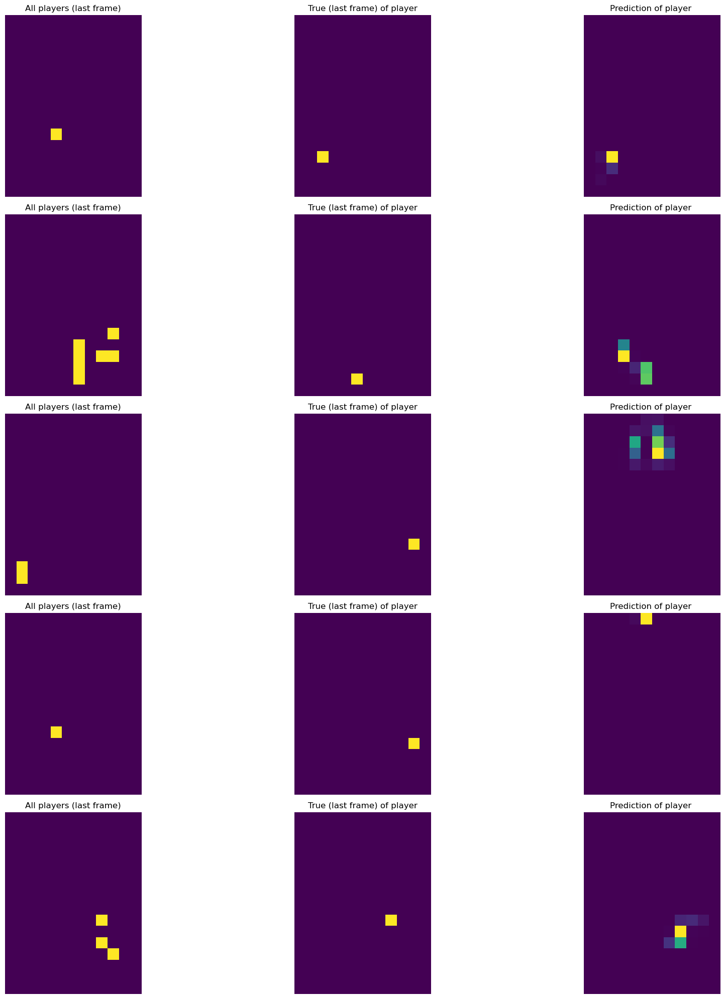

MODELO model1 - ESCENA Scene6
Epoch 1/25
388/388 [==============================] - 25s 60ms/step - loss: 0.0518 - mse: 0.0128 - mae: 0.0296 - val_loss: 0.0181 - val_mse: 0.0028 - val_mae: 0.0079
Epoch 2/25
388/388 [==============================] - 23s 59ms/step - loss: 0.0213 - mse: 0.0040 - mae: 0.0089 - val_loss: 0.0147 - val_mse: 0.0027 - val_mae: 0.0070
Epoch 3/25
388/388 [==============================] - 23s 59ms/step - loss: 0.0193 - mse: 0.0039 - mae: 0.0086 - val_loss: 0.0140 - val_mse: 0.0026 - val_mae: 0.0066
Epoch 4/25
388/388 [==============================] - 23s 59ms/step - loss: 0.0175 - mse: 0.0037 - mae: 0.0082 - val_loss: 0.0151 - val_mse: 0.0028 - val_mae: 0.0067
Epoch 5/25
388/388 [==============================] - 23s 59ms/step - loss: 0.0163 - mse: 0.0036 - mae: 0.0078 - val_loss: 0.0156 - val_mse: 0.0032 - val_mae: 0.0072
Epoch 6/25
388/388 [==============================] - 23s 59ms/step - loss: 0.0152 - mse: 0.0034 - mae: 0.0075 - val_loss: 0.0145 - val_mse:

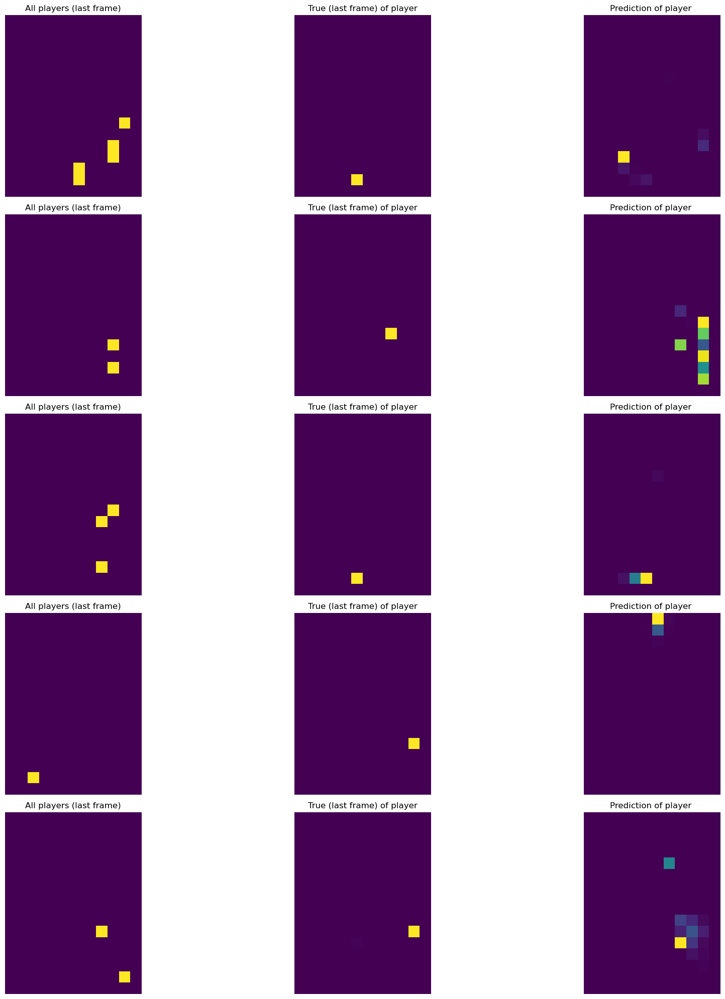

MODELO model2 - ESCENA Scene6
Epoch 1/25
388/388 [==============================] - 380s 975ms/step - loss: 0.1960 - mse: 0.0640 - mae: 0.1375 - val_loss: 0.1566 - val_mse: 0.0493 - val_mae: 0.1139
Epoch 2/25
388/388 [==============================] - 378s 975ms/step - loss: 0.1441 - mse: 0.0429 - mae: 0.1065 - val_loss: 0.1248 - val_mse: 0.0350 - val_mae: 0.0959
Epoch 3/25
388/388 [==============================] - 362s 932ms/step - loss: 0.1168 - mse: 0.0306 - mae: 0.0894 - val_loss: 0.1002 - val_mse: 0.0244 - val_mae: 0.0801
Epoch 4/25
388/388 [==============================] - 353s 909ms/step - loss: 0.0951 - mse: 0.0218 - mae: 0.0747 - val_loss: 0.0821 - val_mse: 0.0173 - val_mae: 0.0670
Epoch 5/25
388/388 [==============================] - 351s 905ms/step - loss: 0.0785 - mse: 0.0158 - mae: 0.0625 - val_loss: 0.0678 - val_mse: 0.0125 - val_mae: 0.0564
Epoch 6/25
388/388 [==============================] - 351s 906ms/step - loss: 0.0659 - mse: 0.0118 - mae: 0.0526 - val_loss: 0.057

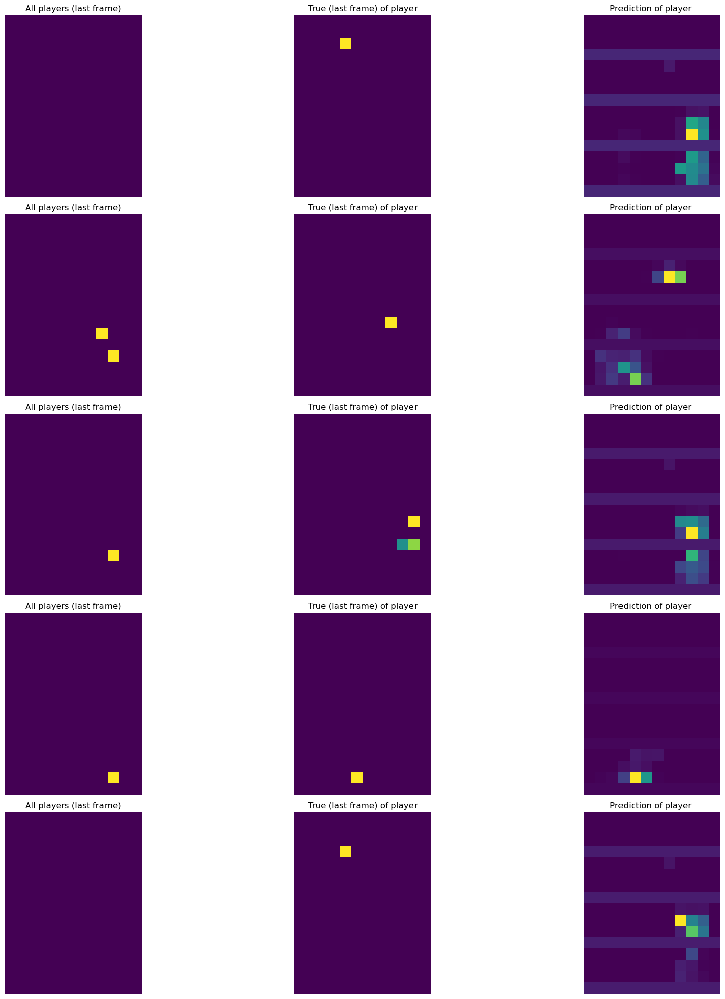

MODELO model4 - ESCENA Scene6
Epoch 1/25
388/388 [==============================] - 385s 984ms/step - loss: 0.2065 - mse: 0.0672 - mae: 0.1448 - val_loss: 0.1608 - val_mse: 0.0503 - val_mae: 0.1159
Epoch 2/25
388/388 [==============================] - 378s 973ms/step - loss: 0.1499 - mse: 0.0442 - mae: 0.1083 - val_loss: 0.1305 - val_mse: 0.0364 - val_mae: 0.0983
Epoch 3/25
388/388 [==============================] - 376s 970ms/step - loss: 0.1224 - mse: 0.0319 - mae: 0.0916 - val_loss: 0.1055 - val_mse: 0.0258 - val_mae: 0.0832
Epoch 4/25
388/388 [==============================] - 376s 970ms/step - loss: 0.1000 - mse: 0.0229 - mae: 0.0769 - val_loss: 0.0873 - val_mse: 0.0183 - val_mae: 0.0692
Epoch 5/25
388/388 [==============================] - 377s 973ms/step - loss: 0.0832 - mse: 0.0168 - mae: 0.0647 - val_loss: 0.0712 - val_mse: 0.0132 - val_mae: 0.0579
Epoch 6/25
388/388 [==============================] - 376s 970ms/step - loss: 0.0704 - mse: 0.0126 - mae: 0.0546 - val_loss: 0.060

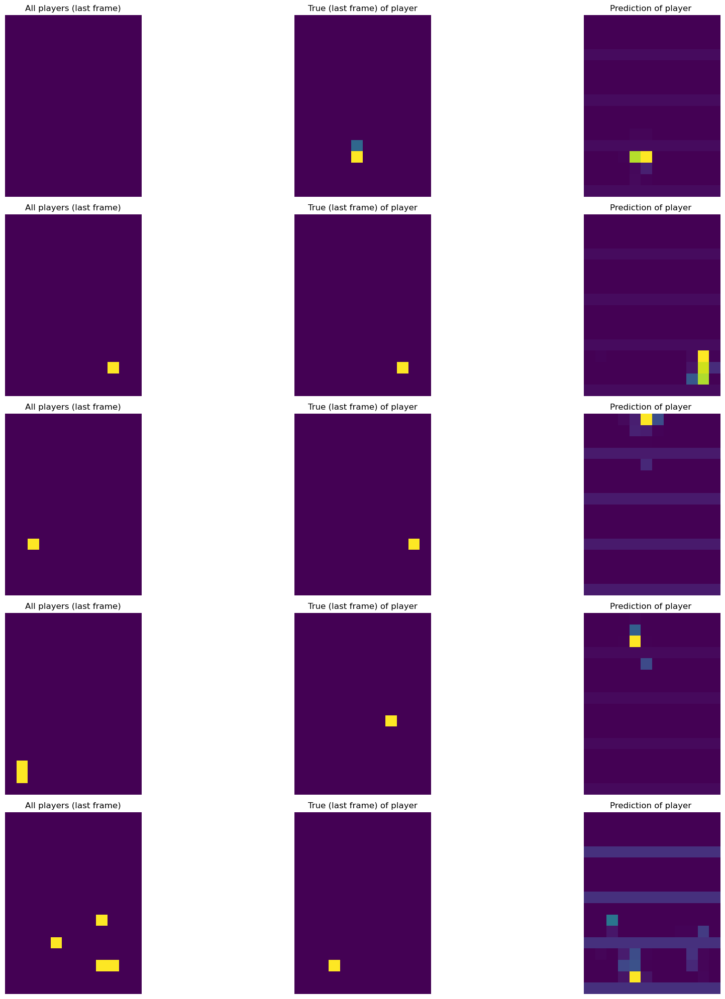

Resultados por escena:
Escena {0: 'Scene1', 1: 'Scene1', 2: 'Scene1', 3: 'Scene1', 4: 'Scene1', 5: 'Scene1', 6: 'Scene1', 7: 'Scene1', 8: 'Scene1', 9: 'Scene1', 10: 'Scene1', 11: 'Scene1', 12: 'Scene1', 13: 'Scene1', 14: 'Scene1', 15: 'Scene1', 16: 'Scene1', 17: 'Scene1', 18: 'Scene1', 19: 'Scene1', 20: 'Scene1', 21: 'Scene1', 22: 'Scene1', 23: 'Scene1', 24: 'Scene1', 25: 'Scene1', 26: 'Scene1', 27: 'Scene1', 28: 'Scene1', 29: 'Scene1', 30: 'Scene1', 31: 'Scene1', 32: 'Scene1', 33: 'Scene1', 34: 'Scene1', 35: 'Scene1', 36: 'Scene1', 37: 'Scene1', 38: 'Scene1', 39: 'Scene1', 40: 'Scene1', 41: 'Scene1', 42: 'Scene1', 43: 'Scene1', 44: 'Scene1', 45: 'Scene1', 46: 'Scene1', 47: 'Scene1', 48: 'Scene1', 49: 'Scene1', 50: 'Scene1', 51: 'Scene1', 52: 'Scene1', 53: 'Scene1', 54: 'Scene1', 55: 'Scene1', 56: 'Scene1', 57: 'Scene1', 58: 'Scene1', 59: 'Scene1', 60: 'Scene1', 61: 'Scene1', 62: 'Scene1', 63: 'Scene1', 64: 'Scene1', 65: 'Scene1', 66: 'Scene1', 67: 'Scene1', 68: 'Scene1', 69: 'Scene1',

In [18]:
import numpy as np
import time
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import KFold

np.random.seed(42)
Y_pred_total=np.array([])

# Lista de identificadores de modelo
model_ids = ["model0","model1","model2","model4"] 

# Estructuras para almacenar resultados y tiempos de ejecución
mse_results = {model_id: [] for model_id in model_ids}
mae_results = {model_id: [] for model_id in model_ids}
training_times = {model_id: [] for model_id in model_ids}
total_execution_time = {model_id: 0 for model_id in model_ids}

print(np.unique(S))

for ixs,sc in enumerate(np.unique(S0)):
    print("SCENE",sc)
    #obtenemos train and test index basado en la escena ( y luego lo barajamos)
    train_indices=np.where(S0 != sc)[0]
    test_indices=np.where(S0 == sc)[0]

    np.random.shuffle(train_indices)

    #datos de train y test
    print("TRAIN:", train_indices, " TEST:", test_indices)
    
    XYT_train=XYT[train_indices]
    rssiT_train=rssiT[train_indices]
    YT_train=YT[train_indices]

    XYT_test=XYT[test_indices]
    rssiT_test=rssiT[test_indices]
    YT_test=YT[test_indices]
    
    for model_id in model_ids:
        print(f"MODELO {model_id} - ESCENA {sc}")
        
        model = load_model(f"XXX-{model_id}.h5")

        start_time = time.time()

        history = model.fit([XYT_train, rssiT_train], YT_train,
                                  batch_size=16,
                                  validation_data=([XYT_test, rssiT_test], YT_test),
                                  epochs=25)
        end_time = time.time()
        training_time = end_time - start_time
        
        YT_prediction = model.predict([XYT_test, rssiT_test])

        plottingRandom(XYT_test, YT_test, YT_prediction)

        mse = mean_squared_error(YT_test.flatten(), YT_prediction.flatten())
        mae = mean_absolute_error(YT_test.flatten(), YT_prediction.flatten())

        mse_results[model_id].append(mse)
        mae_results[model_id].append(mae)
        training_times[model_id].append(training_time)
        total_execution_time[model_id] += training_time

# Calculando promedios y mostrando resultados

print("Resultados por escena:")
for i, sc in enumerate(np.unique(S)):
    print(f"Escena {sc}:")
    for model_id in model_ids:
        print(f"Modelo {model_id} - MSE: {mse_results[model_id][i]:.4f}, MAE: {mae_results[model_id][i]:.4f}, Tiempo: {training_times[model_id][i]:.2f}s")
    print("")
    
print("RESUMEN RESULTADOS:")
for model_id in model_ids:
    average_mse = np.mean(mse_results[model_id])
    average_mae = np.mean(mae_results[model_id])
    print(f"Modelo {model_id}:")
    print(f"Tiempo de ejecución total: {total_execution_time[model_id]:.2f} segundos")
    print(f"MSE promedio: {average_mse:.4f}")
    print(f"MAE promedio: {average_mae:.4f}\n")



##### 